In [185]:
from functions import *

In [186]:
import sys, importlib
importlib.reload(sys.modules['functions'])
from functions import *

comparar valores de EW calculados com e sim binning

Voronoi binning

**Analysing SN2010ev, in galaxy NGC 3244, which has redshift z=0.009213 ± 7.00e-6 (He)**

# To-do

# Importing data

In [3]:
#import data
file_name="../SN2010ev.fits"
data = fits.open(file_name)
cube = data[1].data   # this is the cube, a (3681 x 341 x 604) matrix with fluxes at different 3681 wavelengths and 308 x 318 spatial pixels ("spaxels")
header = data[1].header # this has information on the data cube
ecube = data[2].data # this is the cube uncertainty (3681 x 341 x 604)
print(np.shape(cube))


print(cube[0])
print(cube[0][200][300])

x_len=len(cube[0][0])
y_len=len(cube[0])

(3681, 341, 604)
[[     nan      nan      nan ...      nan      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]
 ...
 [     nan      nan      nan ... 69.65055      nan      nan]
 [     nan      nan      nan ... 68.30897      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]]
91.866684


In [4]:
#  -- following is to the get the wavelength array
CRVAL = float(header["CRVAL3"])
NAXIS = int(header["NAXIS3"])
CDELT = float(header["CD3_3"])
CRPIX = float(header["CRPIX3"])
wave = np.array(CRVAL + CDELT * (np.arange(NAXIS) - CRPIX))

In [5]:
#testing function findWavelengths
result = findWavelengths(wave, 5000)
print("Closest elements:", result)

result = findWavelengths(wave, [5000,4000,6000])
print("Closest elements:", result)

Closest elements: (4999.6923828125, 201)
Closest elements: [(4999.6923828125, 201), (4748.4423828125, 0), (5999.6923828125, 1001)]


# Plotting cube images

## Plotting cube at Hα

In [6]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

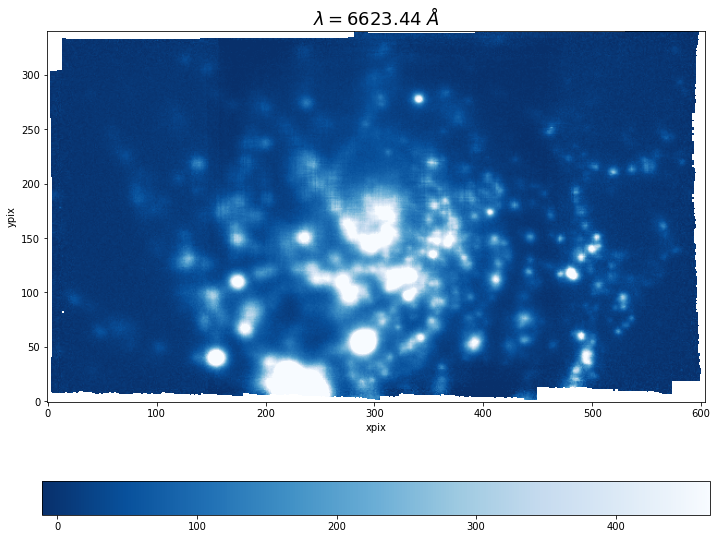

In [7]:
img_data=cube[index]

plot_image(img_data,wavelen, index, 'Blues_r')

In [8]:
print('Min:', np.nanmin(img_data))
print('Max:', np.nanmax(img_data))
print('Mean:', np.nanmean(img_data))
print('Stdev:', np.nanstd(img_data))

Min: -67.27145
Max: 6526.5054
Mean: 62.408295
Stdev: 175.11049


In [9]:
len(img_data.flatten())
y_len*x_len

205964

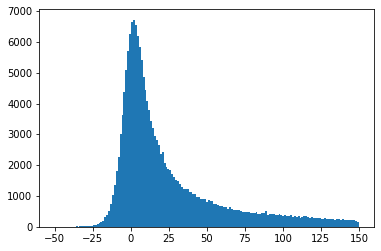

In [10]:
histogram = plt.hist(img_data.flatten(), bins='auto',range=[-50,150])

## Plotting cube at various wavelengths

In [11]:
W=5000
V=5510 #V (Visible/Green): ~551 nm
R=6580 #R (Red): ~658 nm

halpha=6563

xx=[W,V,R,halpha_obs]

selection=findWavelengths(wave, xx)

waves=np.transpose(selection)[0]
indices=np.transpose(selection)[1]
indices = indices.astype(int)

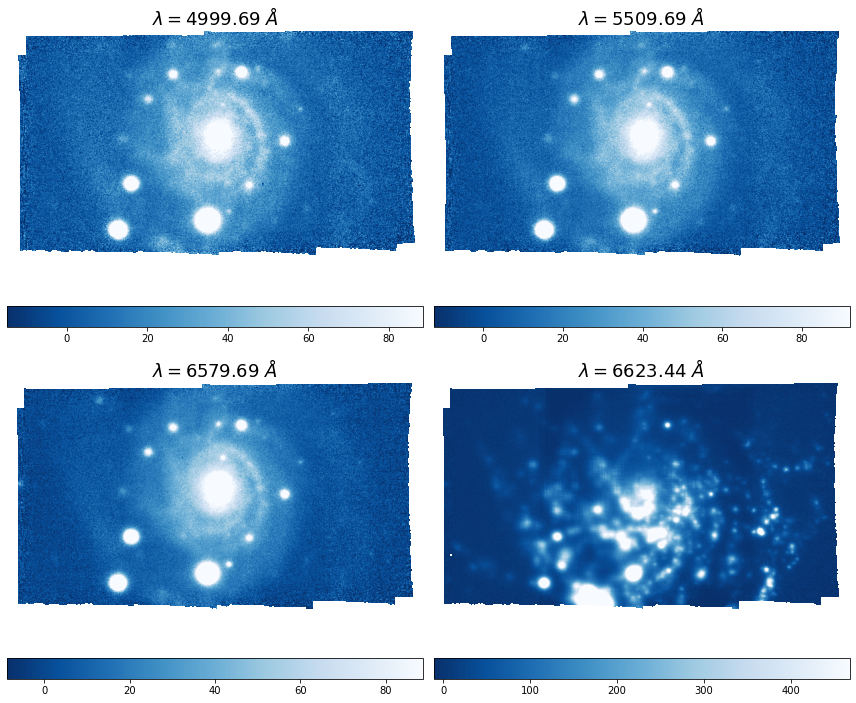

In [12]:
plot_image(cube[indices],wave[indices], indices, 'Blues_r')

## Making a gif around Halpha

In [13]:
xx=[halpha_obs-10,halpha_obs+10]

selection=findWavelengths(wave,xx)

waves=np.transpose(selection)[0]
indices=np.transpose(selection)[1]
indices = indices.astype(int)

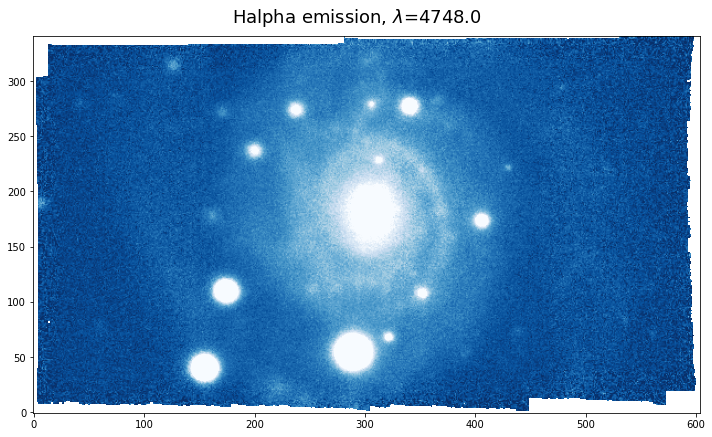

In [14]:


image_array = cube[indices[0]:indices[1]]



fig, ax = plt.subplots(figsize=(10, 8))


# Set the initial image
image=cube[indices[0]];
lo,up = np.nanpercentile(image,2),np.nanpercentile(image,98)

im = ax.imshow(image, animated=True,cmap="Blues_r",origin='lower',clim=(lo,up))
plt.tight_layout()
def update(i):
    im.set_array(image_array[i])
    fig.suptitle("Halpha emission, $\lambda$="+str(round(wave[i],0)),fontsize=18,y=0.85)
    
    return im,


# Create the animation object
animation_fig = animation.FuncAnimation(fig, update, frames=len(image_array), interval=400, blit=True,repeat_delay=15,)

# Show the animation
plt.tight_layout()
plt.show()

animation_fig.save("im.gif")

In [15]:
from PIL import Image

im = []
for n in range(20):
    arr = np.random.randint(low = 0, high = 255, size = (300, 300, 3))
    im.append(Image.fromarray(arr.astype('uint8')))

im[0].save('im.gif', save_all=True, append_images=im[1:], optimize=False, duration=200, loop=0)

## Plotting median within a certain waveband

0 1
[4748.44238281 4749.69238281]


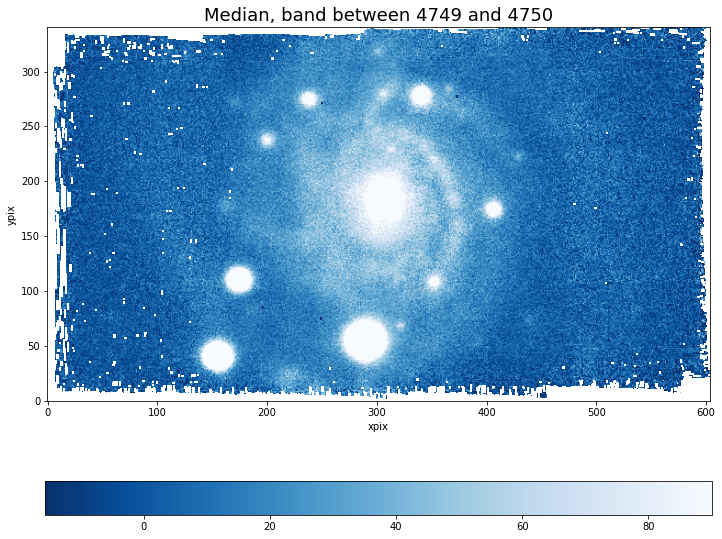

In [16]:
med=median(cube,wave,[4749,4750])


plot_image(med,wavelengths=[4749,4750],index=[4749,4750], colormap='Blues_r',title='Median, band between 4749 and 4750')


#median(cube,wave,[np.max(wave),np.min(max)])


## Plotting average within a certain waveband

0 1
[4748.44238281 4749.69238281]


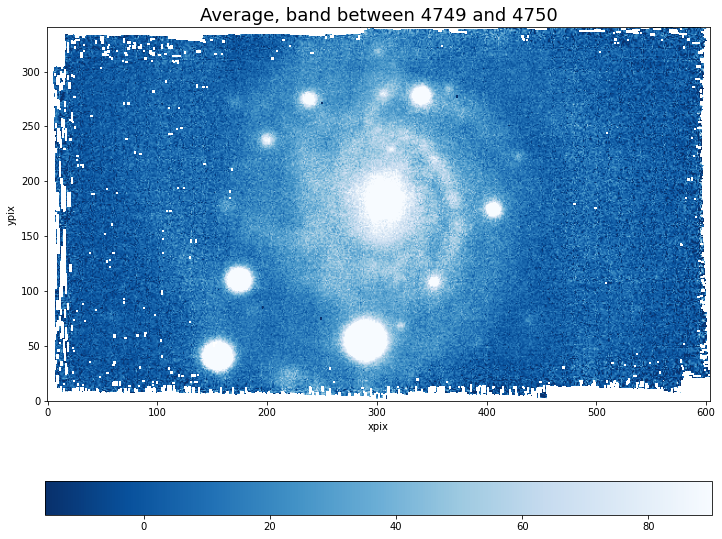

In [17]:
ave=average(cube,wave,[4749,4750])


plot_image(ave,wavelengths=[4749,4750],index=[4749,4750], colormap='Blues_r',title='Average, band between 4749 and 4750')


#ave(cube,wave,[np.max(wave),np.min(max)])


# Binning

## Binning 2x2

In [18]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

img_data=cube[index]

print("dimensions before binning: ", len(img_data),len(img_data[0]))

binned_data=binning(img_data,4)

print("dimensions after binning: ", len(binned_data),len(binned_data[0]))


dimensions before binning:  341 604
dimensions after binning:  86 151


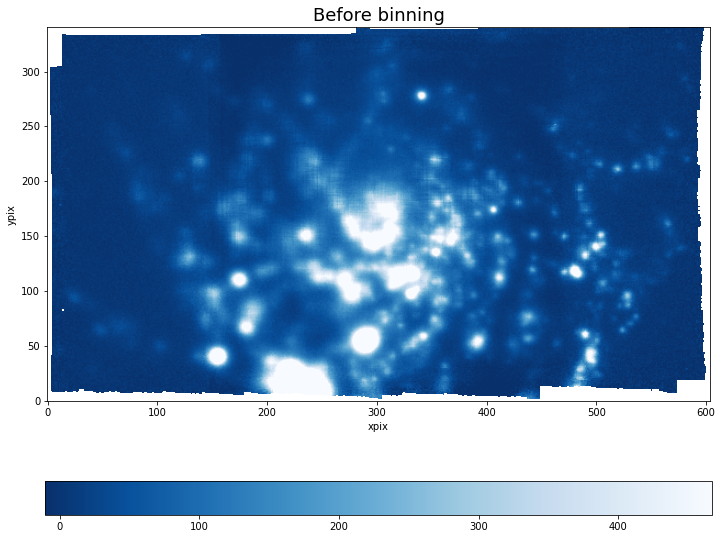

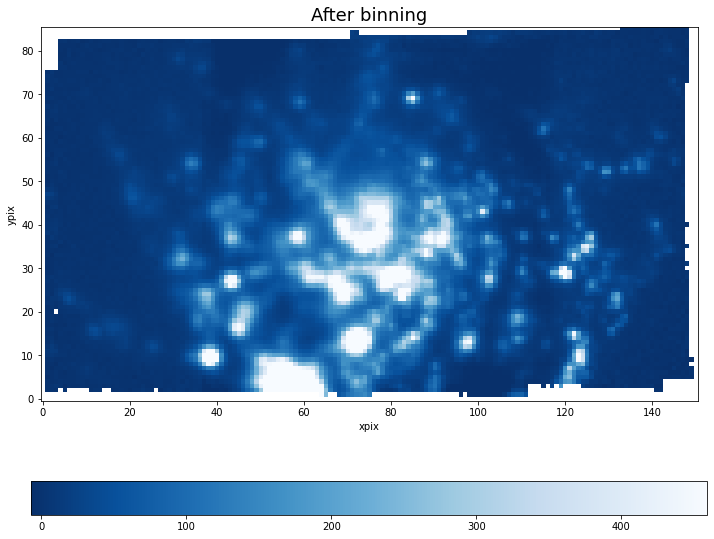

In [19]:
plot_image(img_data,wavelen, index, 'Blues_r', "Before binning")
plot_image(binned_data,wavelen, index, 'Blues_r',"After binning")

In [20]:
np.shape(cube)

(3681, 341, 604)

## Region w/ high SNR

Zoom in area of background signal

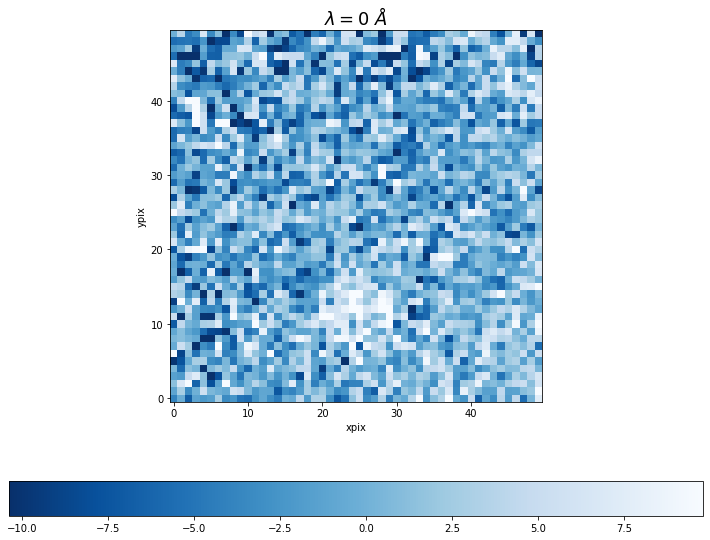

In [21]:
bg=img_data[270:320, 15:65]
plot_image(bg,0,0,'Blues_r')

In [22]:
# background noise
noise = np.nanstd(bg)

snr_map = img_data / noise
mean_snr = np.nanmean(snr_map)
threshold = 0.5 * mean_snr


square_size = 1000


#best square
best_square = None
best_snr = -np.inf  
best_coords = (0, 0)


h, w = image.shape
for y in range(0, h - square_size + 1, square_size):
    for x in range(0, w - square_size + 1, square_size):
        
        block = snr_map[y:y+square_size, x:x+square_size]

        block_mean_snr = np.mean(block)

        if block_mean_snr > best_snr:
            best_snr = block_mean_snr
            best_square = block
            best_coords = (y, x)

if best_square is not None:
    np.save("../best_snr_square.npy", best_square)
    print(f"Saved the best SNR square at {best_coords} with mean SNR {best_snr:.2f}")

best_square = np.load("../best_snr_square.npy")
print(best_square)

[[24.733227  23.659376  23.296698  ...  8.002031   6.8485003  6.3015223]
 [25.289423  24.369799  22.9598    ...  6.986258   6.1466255  7.6385193]
 [23.431923  22.804512  24.332674  ...  7.397483   7.678427   5.837128 ]
 ...
 [31.349007  31.20333   35.570824  ... 10.715965  10.636392  11.201308 ]
 [28.347382  27.447086  30.333021  ...  9.965655  11.025977  11.6718   ]
 [25.059385  26.852942  27.987513  ...  9.946177  11.049753  11.41961  ]]


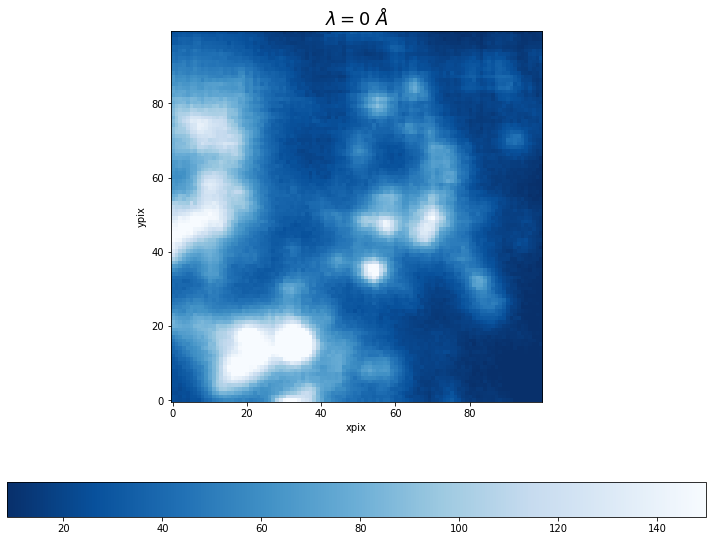

In [23]:
plot_image(best_square,0,0,'Blues_r')

## Binning of galaxy bulge

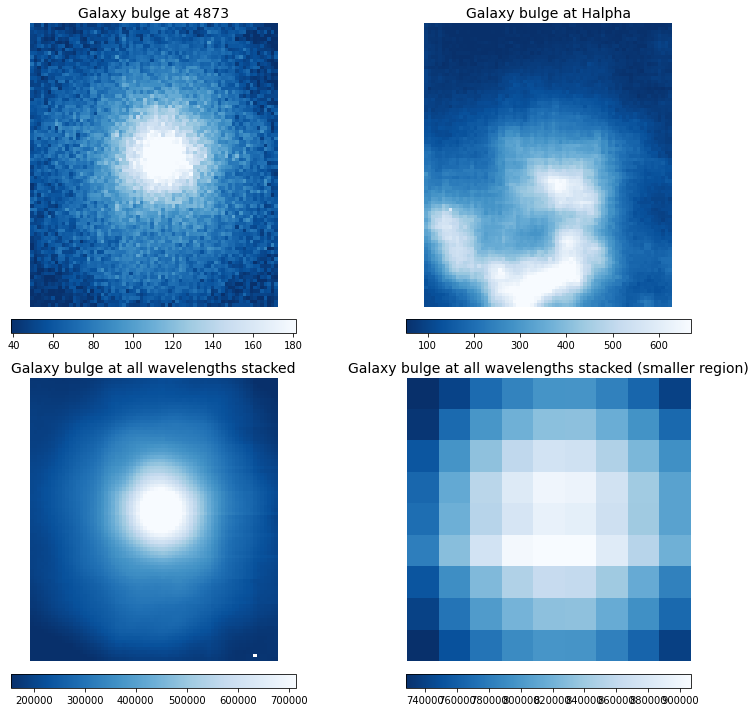

In [24]:
bulge=cube[:,140:220,270:340];
ebulge=ecube[:,140:220,270:340];

small_bulge=cube[:,178:187,302:311]
#small_bulge=cube[:,181:185,305:307]

images = [
    bulge[100],
    bulge[index], 
    stack_all(bulge),
    stack_all(small_bulge)
]

titles = [
    "Galaxy bulge at "+str(int(round(wave[100],0))),
    "Galaxy bulge at Halpha",
    "Galaxy bulge at all wavelengths stacked",
    "Galaxy bulge at all wavelengths stacked (smaller region)"
]

plot_images(images, wavelengths=[0, 0, 0, 0], colormap='Blues_r', titles=titles)


In [25]:
stacked_bulge=stack(bulge,wave,number_images=10,central_wavelength=halpha_obs)
stacked_ebulge=stack(ebulge,wave,number_images=10,central_wavelength=halpha_obs)

binned_bulge=binning(bulge[index],4)
ebinned_bulge=binning(ebulge[index],4)

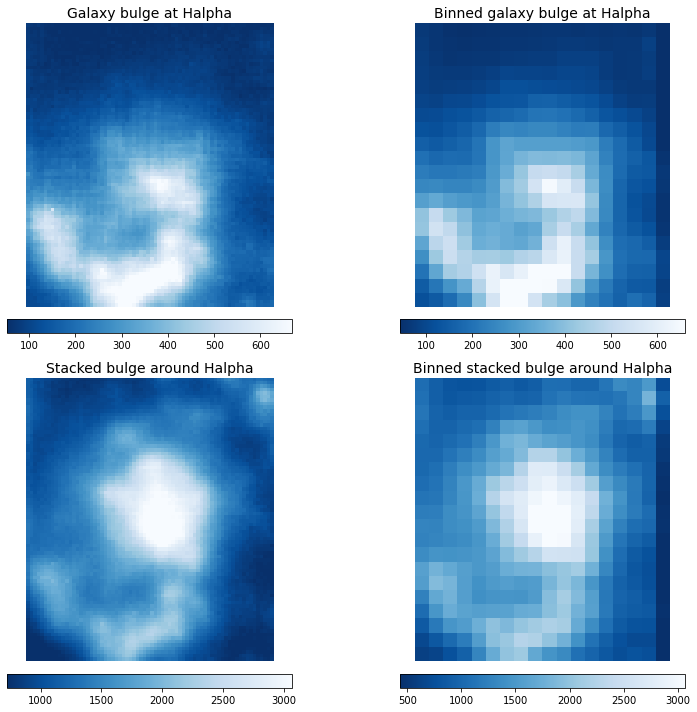

In [26]:
images = [
    bulge[index], 
    binned_bulge, 
    stacked_bulge, 
    binning(stacked_bulge, 4)
]

titles = [
    "Galaxy bulge at Halpha",
    "Binned galaxy bulge at Halpha",
    "Stacked bulge around Halpha",
    "Binned stacked bulge around Halpha"
]

plot_images(images, wavelengths=[0, 0, 0, 0], colormap='Blues_r', titles=titles)


In [27]:
binned_stacked_bulge=binning(stack(bulge,wave,number_images=10,central_wavelength=halpha_obs),4)
binned_stacked_ebulge=binning(stack(ebulge,wave,number_images=10,central_wavelength=halpha_obs),4)

print("Median SNR before binning = ",np.median(signaltonoise(stacked_bulge,stacked_ebulge)), "\nMedian SNR after stacking&binning = ",np.median(signaltonoise(binned_stacked_bulge,binned_stacked_ebulge)))
      

Median SNR before binning =  4.6879454 
Median SNR after stacking&binning =  4.642662903020382


so SNR is lower after binning?(*) could be because i am computing the same SNR for a bin for all the pixels that were collapsed

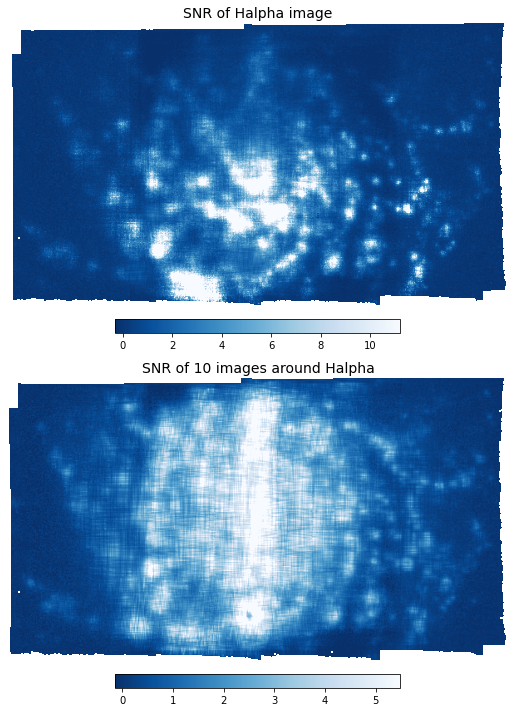

Average of SNR in the image is  1.5096688
Average of SNR in the image is  1.4523461
Median of SNR in the image is  0.4109841
Median of SNR in the image is  0.79283464

SNR gets worse on average, but not in median(**)


In [28]:
snr1=signaltonoise(cube[index],ecube[100])
#plot_image(snr,0,0,colormap='Blues_r',title="SNR of Halpha image")

stacked_galaxy=stack(cube,wave,number_images=10,central_wavelength=halpha_obs)
stacked_uncertainties=stack(ecube,wave,number_images=10,central_wavelength=halpha_obs)


snr2=signaltonoise(stacked_galaxy,stacked_uncertainties)

plot_images([snr1,snr2],wavelengths=[0, 0],colormap='Blues_r',titles=["SNR of Halpha image","SNR of 10 images around Halpha"])

print("Average of SNR in the image is ",np.nanmean(snr1))
print("Average of SNR in the image is ",np.nanmean(snr2))
print("Median of SNR in the image is ",np.nanmedian(snr1))
print("Median of SNR in the image is ",np.nanmedian(snr2))
print("\nSNR gets worse on average, but not in median(**)")

## Stacked galaxy bulge spetra

Text(0.5, 1.0, 'Median spectra of galaxy bulge')

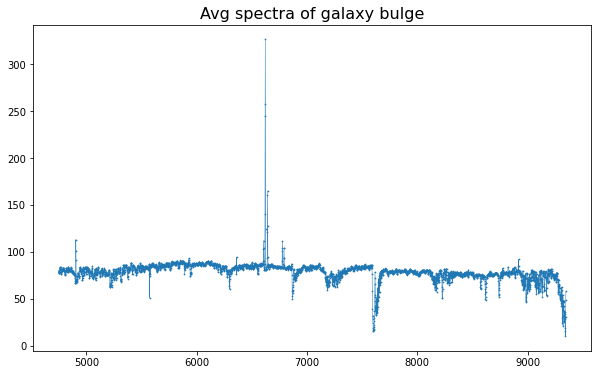

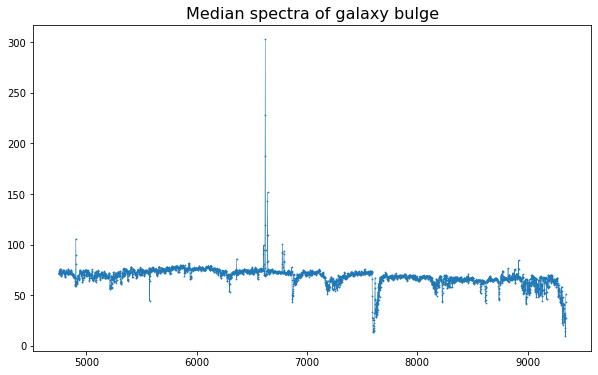

In [29]:
plt.figure(figsize=(10,6))

plt.plot(wave,avg_spectra_of_region(bulge),linewidth=0.5,alpha=0.95)
plt.scatter(wave,avg_spectra_of_region(bulge),s=0.5)
plt.title("Avg spectra of galaxy bulge",fontsize=16)



plt.figure(figsize=(10,6))

median_bulge=median_spectra_of_region(bulge)
plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)
plt.title("Median spectra of galaxy bulge",fontsize=16)




In [30]:
new_wave=wave/(1+z)
halpha_obs

6623.2630764

in x_obs we look for halpha_obs=6562.8*(1+z)

so in x_obs/(1+z) we look for 6562.8

Text(0.5, 1.0, 'Median spectra of smaller region of galaxy bulge')

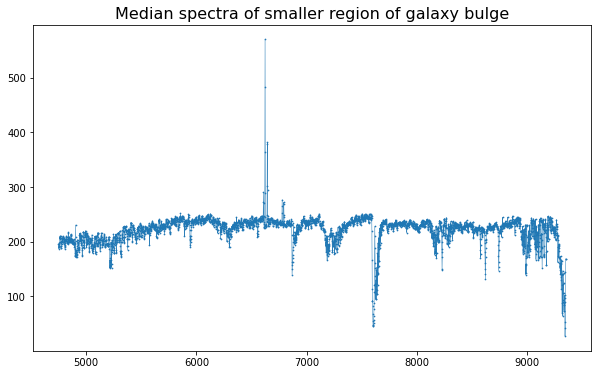

In [31]:
plt.figure(figsize=(10,6))



plt.plot(wave,median_spectra_of_region(small_bulge),linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_spectra_of_region(small_bulge),s=0.5)
plt.title("Median spectra of smaller region of galaxy bulge",fontsize=16)

#plt.xlim(halpha_obs-50,halpha_obs+50)

## Different galaxy regions

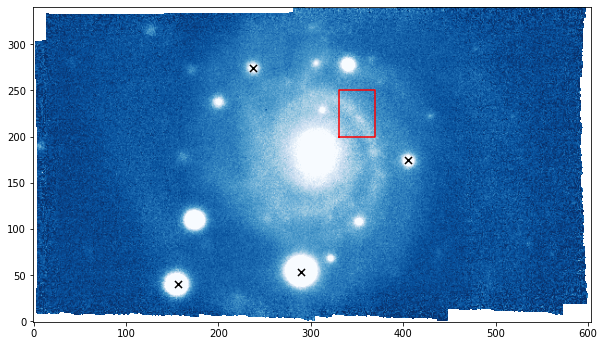

In [32]:
arm=cube[:,200:250,330:370]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [330, 330, 370, 370, 330]
y_coords = [200, 250, 250, 200, 200] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline


star_x=[289,156,237,405]#175
star_y=[53,40,274,175]#110
plt.scatter(star_x,star_y,s=50,marker='x',c='black')


spectra at star (single pixel)

In [33]:
arr=np.transpose((star_x,star_y))
lbls = ["Star (single pixel spectra) at (x,y)= ({},{})".format(row[0], row[1]) for row in arr]

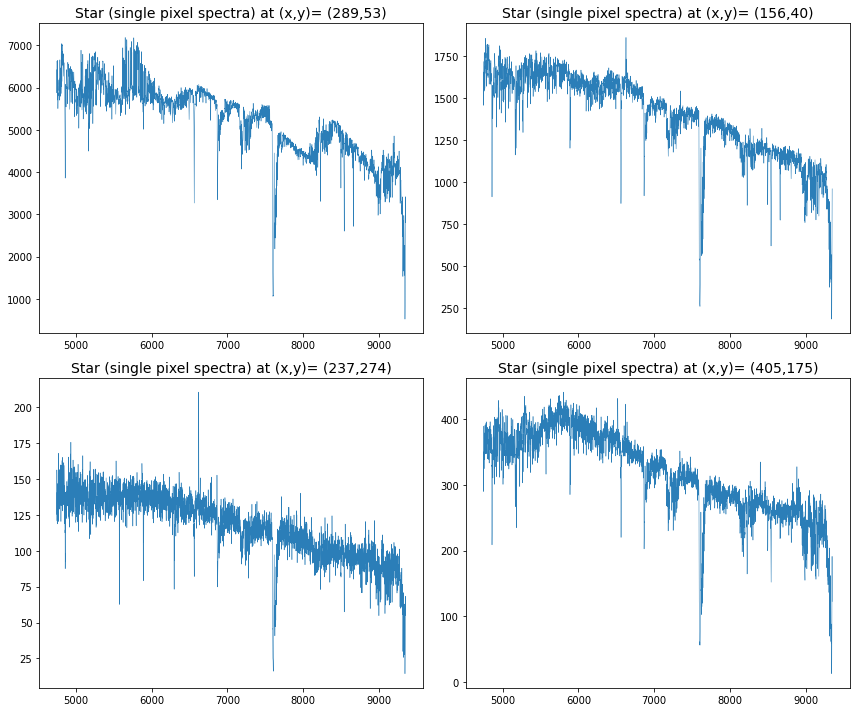

In [34]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = np.array(axes).reshape(-1)
    
for i in range(4):
    lo, up = np.nanpercentile(images[i], 2), np.nanpercentile(images[i], 98)
    im = axes[i].plot(wave,cube[:,star_y[i],star_x[i]],linewidth=0.5,alpha=0.95)
    axes[i].set_title(lbls[i], fontsize=14)
    
# Hide unused subplots if grid has extra slots
for j in range(4, len(axes)):
    axes[j].axis('off')
    
    

plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Median spectra of galaxy arm')

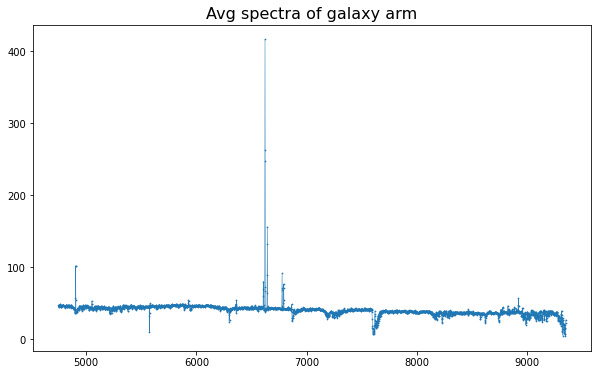

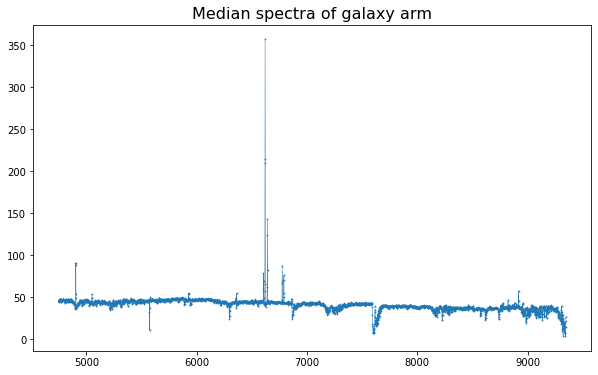

In [35]:
plt.figure(figsize=(10,6))

plt.plot(wave,avg_spectra_of_region(arm),linewidth=0.5,alpha=0.95)
plt.scatter(wave,avg_spectra_of_region(arm),s=0.5)
plt.title("Avg spectra of galaxy arm",fontsize=16)



plt.figure(figsize=(10,6))

median_arm=median_spectra_of_region(arm)
plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)
plt.title("Median spectra of galaxy arm",fontsize=16)

Text(0.5, 1.0, 'Median spectra of galaxy bg')

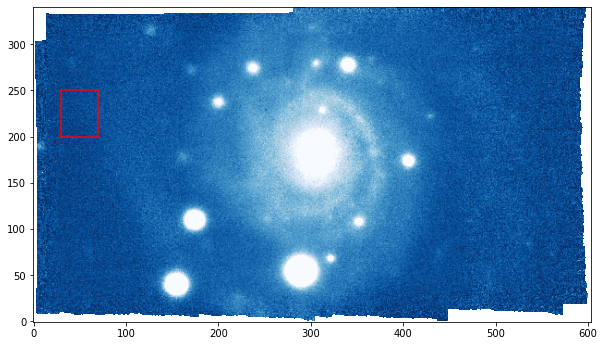

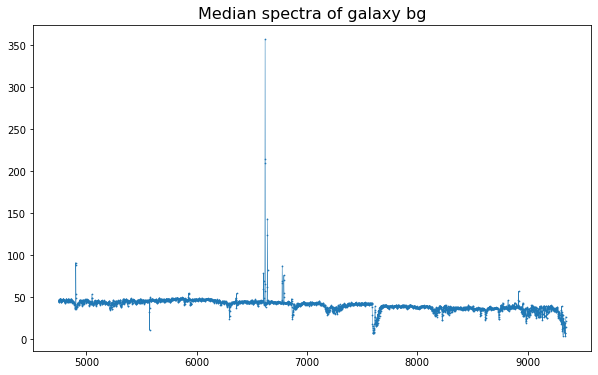

In [36]:
bg=cube[:,200:250,30:70]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [30, 30, 70, 70, 30]
y_coords = [200, 250, 250, 200, 200] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline




plt.figure(figsize=(10,6))

plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)
plt.title("Median spectra of galaxy bg",fontsize=16)

## Plotting uncertainty of spectra

In [37]:
uncertainty=ecube[:,200:250,30:70]
y_err=np.sqrt(np.median(uncertainty, axis=(1, 2)));

np.median(uncertainty[2])

88.63081

In [38]:
median_bg=median_spectra_of_region(bg)

y_err2=mad(median_bg)
print(y_err,y_err2)

[      nan 10.026817  9.414394 ...  6.174121  7.762108       nan] 0.21641612


In [39]:
np.sqrt(y_err[2])

3.0682886

In [40]:
median_bg=median_spectra_of_region(bg)

Text(0.5, 1.0, 'Background spectra')

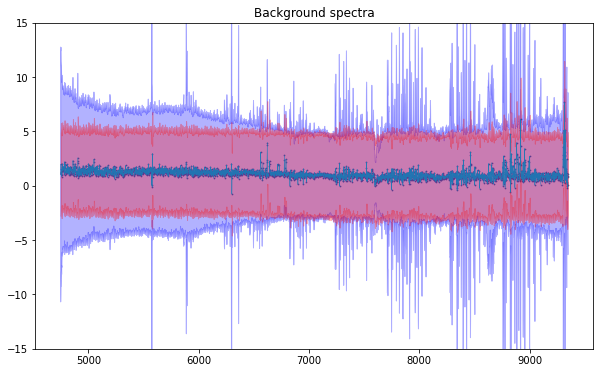

In [97]:
plt.figure(figsize=(10,6))

plt.plot(wave,median_bg,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bg,s=0.5)

plt.fill_between(wave,median_bg - y_err, median_bg + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(wave,median_bg - y_err2, median_bg + y_err2, color='red', alpha=0.3, label="Uncertainty")
plt.ylim(-15,15)

plt.title("Background spectra")

In [98]:
y_err2=mad(median_bulge)
print(y_err,y_err2)

[18.233322  11.719336  11.202767  ...  6.1104426  7.45156          nan] 3.808239


Text(0.5, 1.0, 'Bulge spectra')

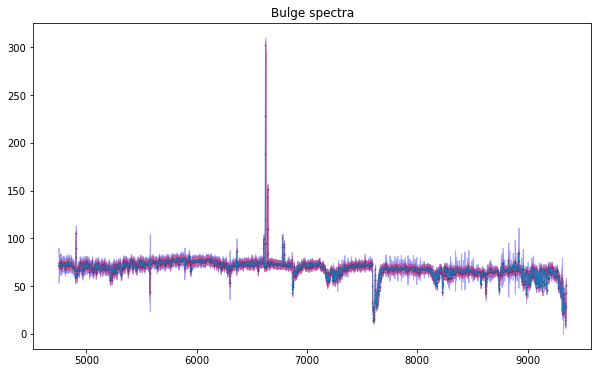

In [99]:
y_err=np.sqrt(np.median(ebulge, axis=(1, 2)));#median absolute deviaton=MAD

plt.figure(figsize=(10,6))

plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)

plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(wave,median_bulge - y_err2, median_bulge + y_err2, color='red', alpha=0.3, label="Uncertainty")
#plt.ylim(-15,15)
plt.title("Bulge spectra")

In [100]:
print("median snr of spectra is ",np.nanmedian(signaltonoise_spec(median_bulge,y_err)))

median snr of spectra is  13.528046


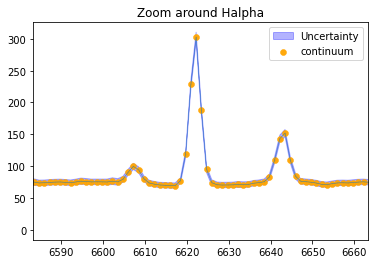

In [101]:
plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)

plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")

x_min, x_max= plt.xlim(halpha_obs-40,halpha_obs+40)
plt.title("Zoom around Halpha")
x_chopped,y_chopped=chop_data(wave,median_bulge,x_min,x_max)

plt.scatter(x_chopped,y_chopped,linewidth=0.5,alpha=0.95,color="orange",label="continuum")

plt.legend()

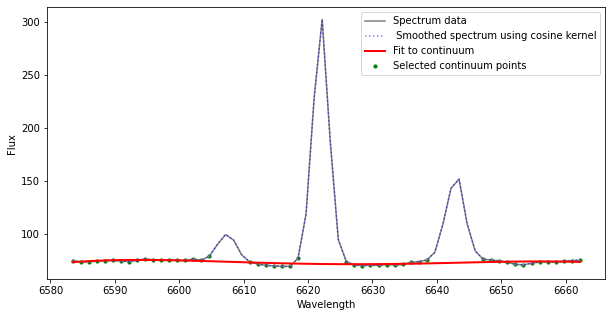

In [102]:
y_smooth=smooth_spectra(y_chopped,kernel_size=3)

continuum_fit, x_continuum, y_continuum=continuum(x_chopped,y_smooth)

y_continuum_fit = continuum_fit(x_chopped)


plt.figure(figsize=(10, 5))
plt.plot(x_chopped, y_chopped, label="Spectrum data", color="gray")
plt.plot(x_chopped, y_smooth, label=" Smoothed spectrum using cosine kernel", color="blue", alpha=0.5,linestyle="dotted")
plt.plot(x_chopped, y_continuum_fit, label="Fit to continuum", color="red", linewidth=2)
plt.scatter(x_continuum, y_continuum, color="green", s=10, label="Selected continuum points")
plt.xlabel("Wavelength")
plt.ylabel("Flux")
plt.legend()
#plt.xlim(6400,6500)
plt.show()

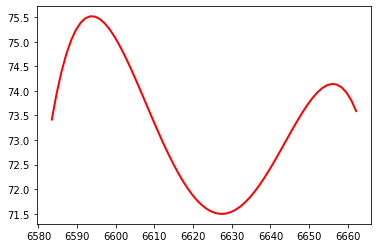

In [103]:
plt.plot(x_chopped, y_continuum_fit, label="Fitted Continuum (5th order)", color="red", linewidth=2)


Text(0.5, 1.0, 'Zoom around Halpha')

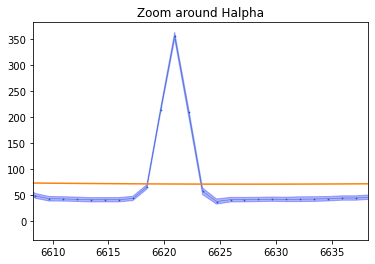

In [104]:
plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)

plt.fill_between(wave,median_arm - y_err, median_arm + y_err, color='blue', alpha=0.3, label="Uncertainty")
#plt.ylim(-5,100)
plt.xlim(halpha_obs-15,halpha_obs+15)
plt.plot(x_chopped,y_continuum_fit)
plt.title("Zoom around Halpha")

Fitted Amplitude (A): 273.64393394258764
Fitted Mean (mu): 6622.004933078535
Fitted Standard Deviation (sigma): 1.9796754082971693
Integral using Simpson's rule: 1277.3566


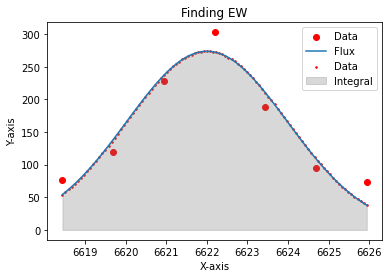

In [105]:
bound1=int(findWavelengths(wave, 6618)[1])
bound2=int(findWavelengths(wave, 6627)[1])

x = wave[bound1:bound2]
y = median_bulge[bound1:bound2]


initial_guess = initial_guess = [max(y), np.mean(x), np.std(x)]

params, covariance = curve_fit(gaussian, x, y, p0=initial_guess)
A_fit, mu_fit, sigma_fit = params


x_fit = np.linspace(min(x), max(x), 100)
y_fit = gaussian(x_fit, params[0], params[1], params[2])



# Print fitted parameters
print(f"Fitted Amplitude (A): {A_fit}")
print(f"Fitted Mean (mu): {mu_fit}")
print(f"Fitted Standard Deviation (sigma): {sigma_fit}")


##

xx = np.linspace(x_fit[0],x_fit[len(x_fit)-1], 100)  

#integral
integral_simps = simps(y_fit, xx)

print(f"Integral using Simpson's rule: {integral_simps:.4f}")

plt.scatter(x, y, label="Data", color="red")
plt.plot(xx, y_fit, label="Flux")
plt.scatter(xx, y_fit, label="Data", color="red",s=2.4)
#plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(xx, y_fit, alpha=0.3, color='gray', label="Integral")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.title("Finding EW")
plt.show()


integrating smoothed spectra

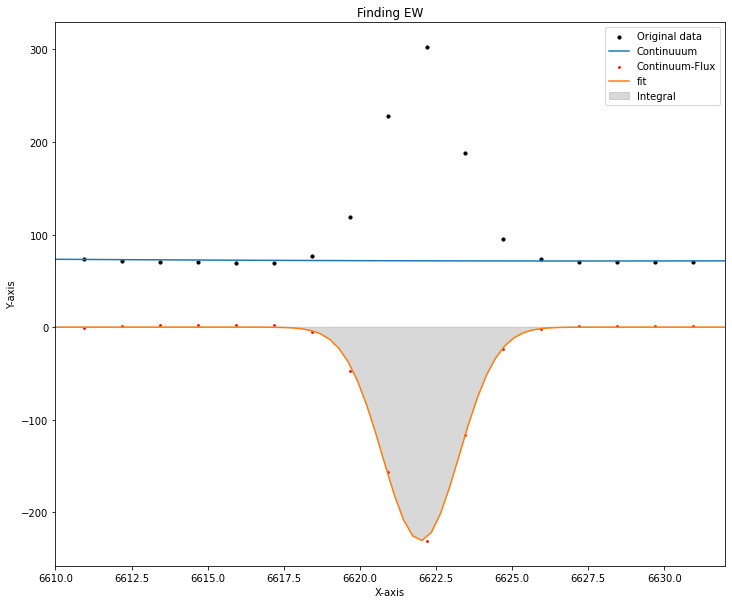

EW calculated through a parametric approach is ==  -19.954243283072405


In [187]:
bound1=halpha_obs-40
bound2=halpha_obs+40

x,y=chop_data(wave,median_bulge,bound1,bound2)

    
print("EW calculated through a parametric approach is == ", EW_parametric(x,y,continuum_fit,plots=True))

## EW maps

picking region

In [177]:
x1=300
x2=420
y1=120
y2=200

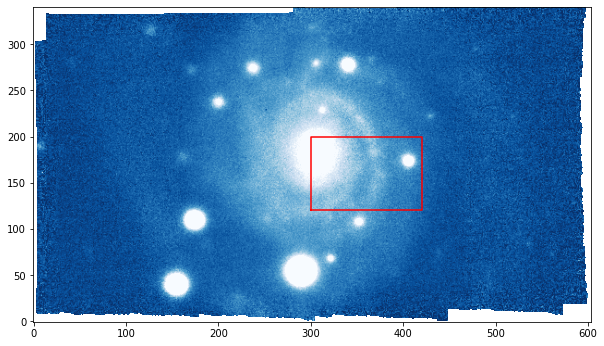

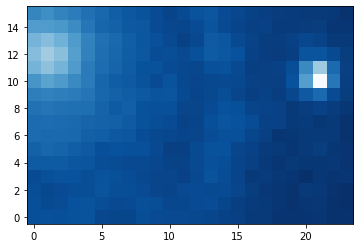

(8, 12)


In [178]:
region=cube[:,y1:y2,x1:x2]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [x1, x1, x2, x2, x1]
y_coords = [y1, y2, y2, y1, y1] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline

plt.show()

plt.imshow(binning(region[10], 5),"Blues_r",origin='lower');

plt.show()

print(np.shape(binning(region[10], 10)))

In [179]:
binned_region=[]

for w in range(0,len(wave)):
    binned_region.append(binning(region[w], 5))

In [180]:
print(np.shape(binned_region))

(3681, 16, 24)


In [181]:
halpha_obs

6623.2630764

In [182]:
binned_region=np.array(binned_region)

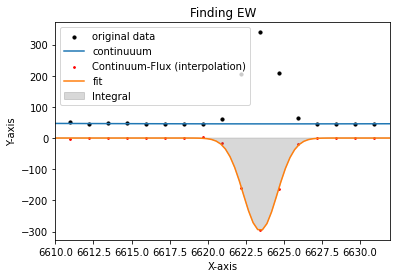

EW= -17.79112199489876  at (i,j)= 0 , 0


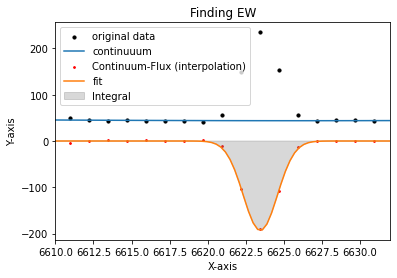

EW= -12.11674069843148  at (i,j)= 0 , 1


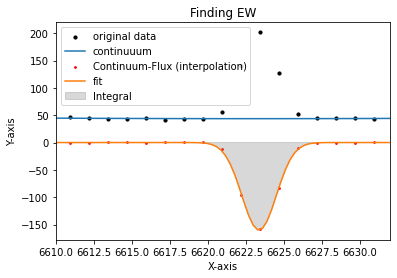

EW= -10.19372497198484  at (i,j)= 0 , 2


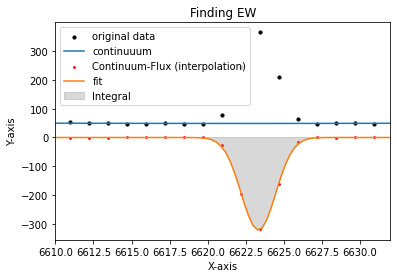

EW= -18.251380122164218  at (i,j)= 0 , 3


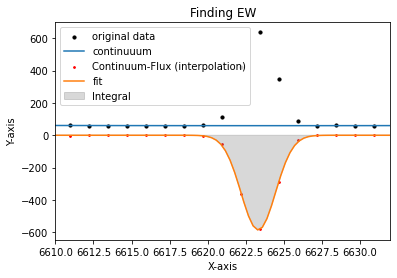

EW= -27.437207457649595  at (i,j)= 0 , 4


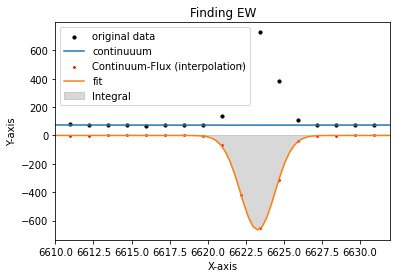

EW= -25.39277759589867  at (i,j)= 0 , 5


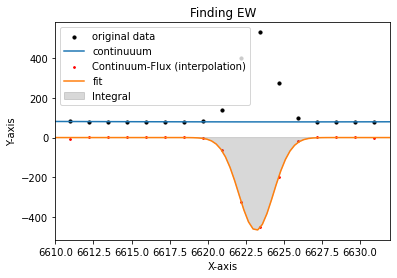

EW= -16.516143715523327  at (i,j)= 0 , 6


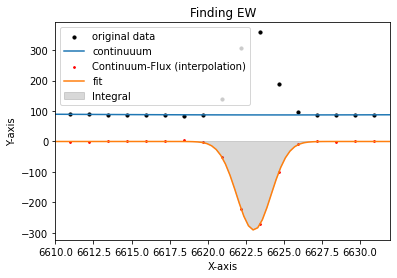

EW= -9.22395526912927  at (i,j)= 0 , 7


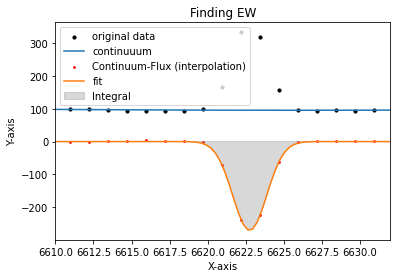

EW= -7.756610448612014  at (i,j)= 0 , 8


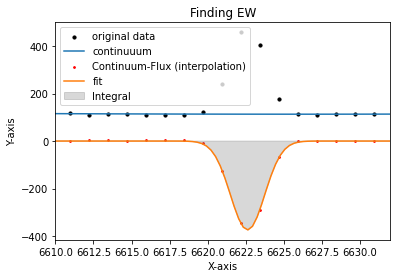

EW= -9.125400183595948  at (i,j)= 0 , 9


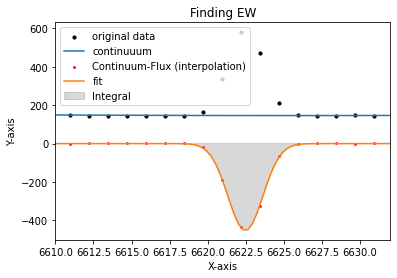

EW= -8.728503525848788  at (i,j)= 0 , 10


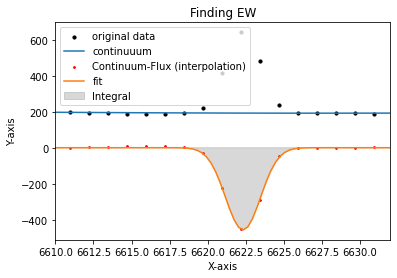

EW= -6.695360632617854  at (i,j)= 0 , 11


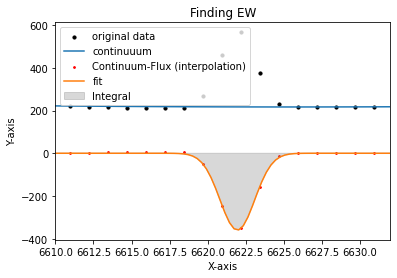

EW= -4.642970786477284  at (i,j)= 0 , 12


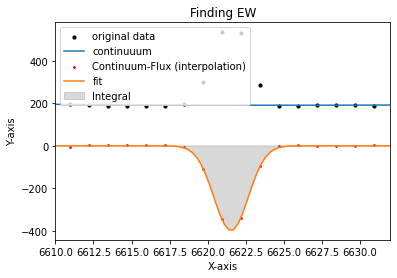

EW= -5.767851757452703  at (i,j)= 0 , 13


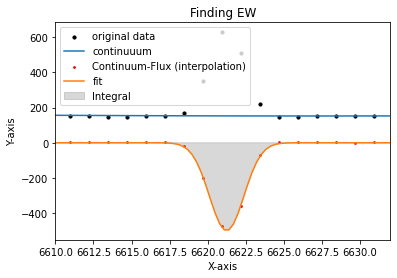

EW= -9.097834988719084  at (i,j)= 0 , 14


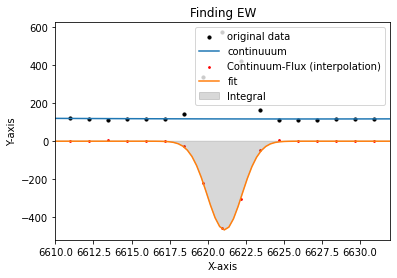

EW= -11.13935168005026  at (i,j)= 0 , 15


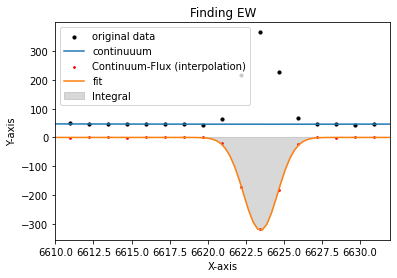

EW= -19.255327660895393  at (i,j)= 1 , 0


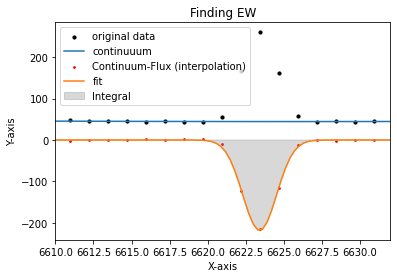

EW= -13.366201464068562  at (i,j)= 1 , 1


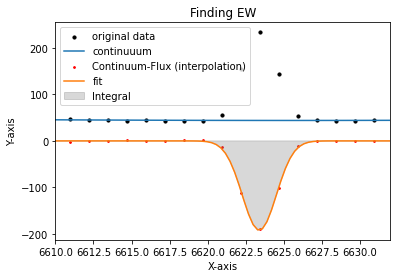

EW= -12.007977999567611  at (i,j)= 1 , 2


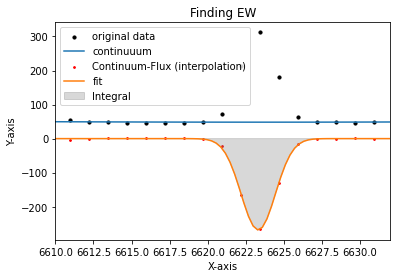

EW= -15.381037005180517  at (i,j)= 1 , 3


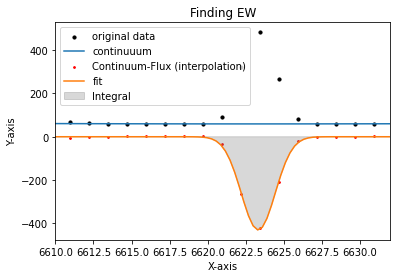

EW= -19.898428130404145  at (i,j)= 1 , 4


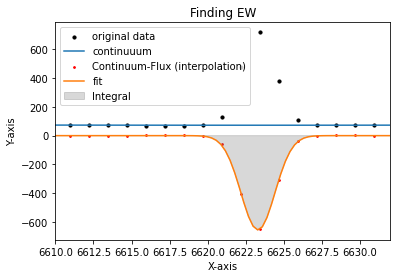

EW= -24.90007876680616  at (i,j)= 1 , 5


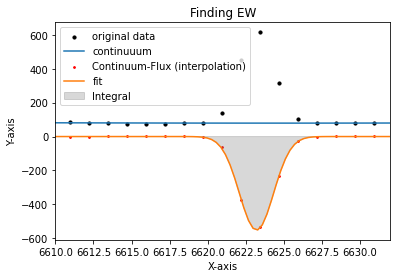

EW= -19.255623949399205  at (i,j)= 1 , 6


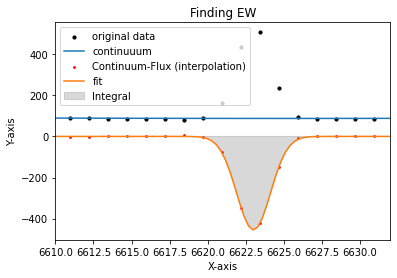

EW= -14.157797925526742  at (i,j)= 1 , 7


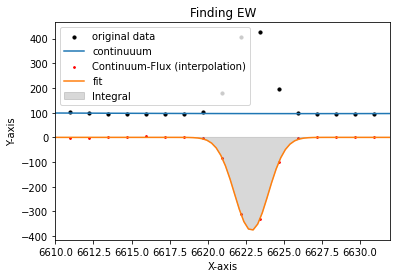

EW= -10.625632767236693  at (i,j)= 1 , 8


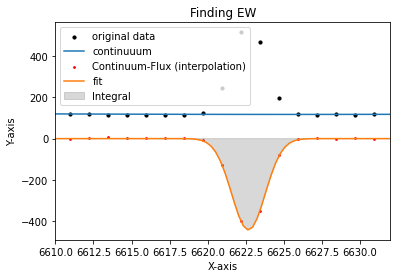

EW= -10.193732028713946  at (i,j)= 1 , 9


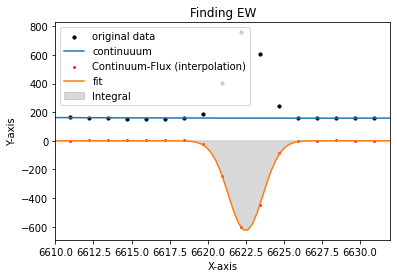

EW= -10.988284354610002  at (i,j)= 1 , 10


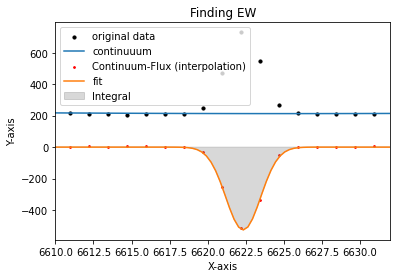

EW= -6.937919894393015  at (i,j)= 1 , 11


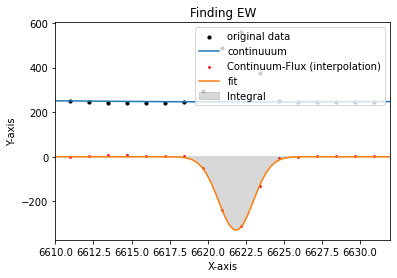

EW= -3.7293203952551743  at (i,j)= 1 , 12


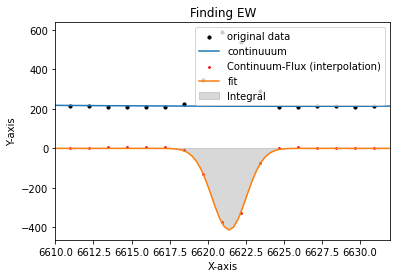

EW= -5.305447049980054  at (i,j)= 1 , 13


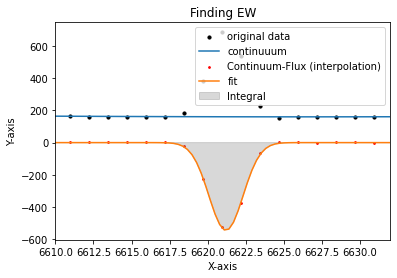

EW= -9.361095567609121  at (i,j)= 1 , 14


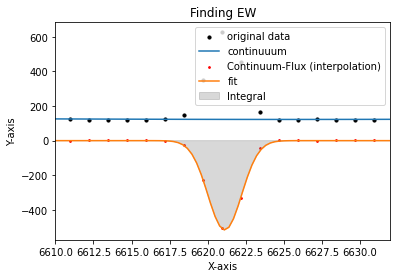

EW= -11.46568678183002  at (i,j)= 1 , 15


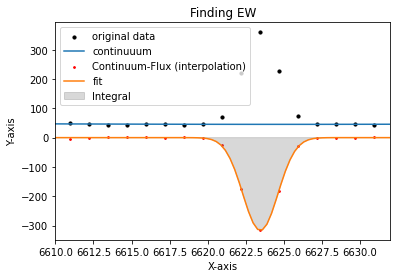

EW= -19.800274751839925  at (i,j)= 2 , 0


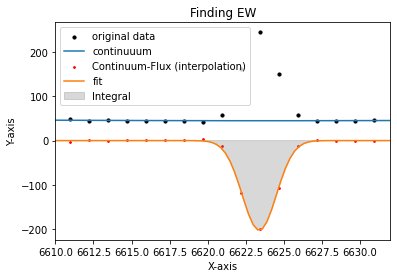

EW= -12.450082932324008  at (i,j)= 2 , 1


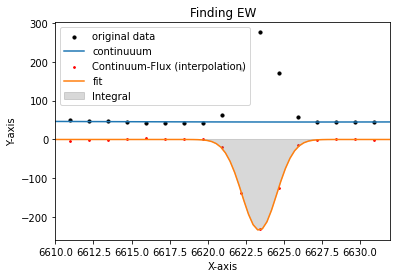

EW= -14.485967225169304  at (i,j)= 2 , 2


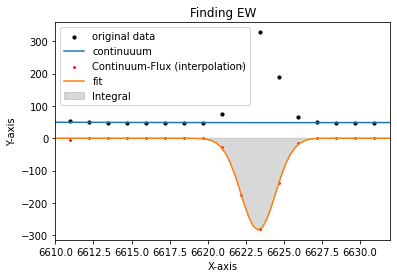

EW= -16.328953529998483  at (i,j)= 2 , 3


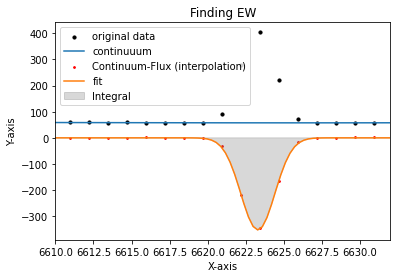

EW= -16.846869495762235  at (i,j)= 2 , 4


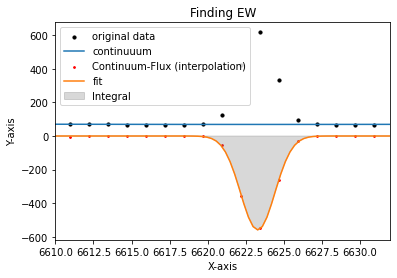

EW= -22.454121339219117  at (i,j)= 2 , 5


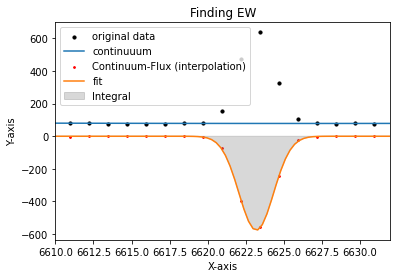

EW= -20.445418199632304  at (i,j)= 2 , 6


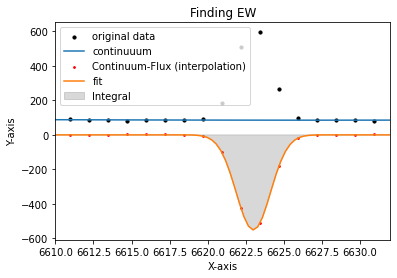

EW= -17.839449356877903  at (i,j)= 2 , 7


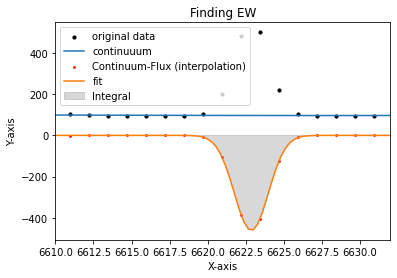

EW= -13.1046465095478  at (i,j)= 2 , 8


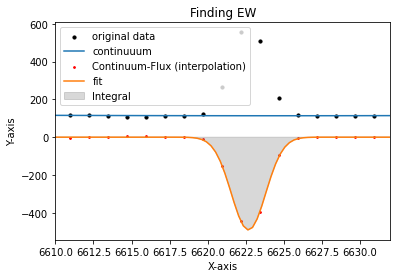

EW= -11.999306146349165  at (i,j)= 2 , 9


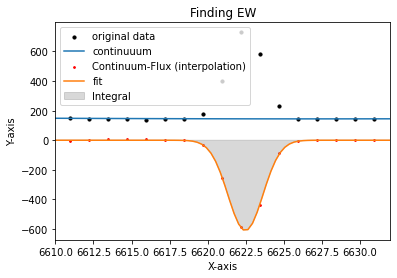

EW= -11.880605245418877  at (i,j)= 2 , 10


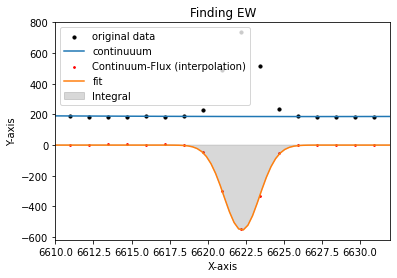

EW= -8.479106628589516  at (i,j)= 2 , 11


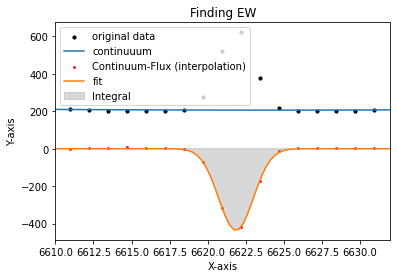

EW= -5.923080888846215  at (i,j)= 2 , 12


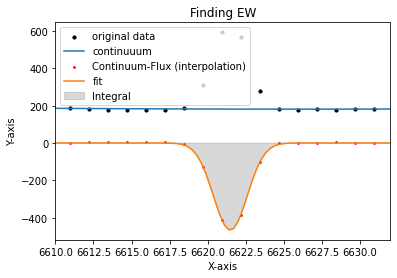

EW= -7.009775027641027  at (i,j)= 2 , 13


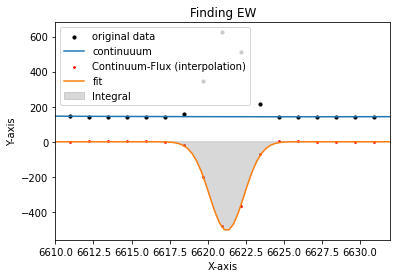

EW= -9.860941528578305  at (i,j)= 2 , 14


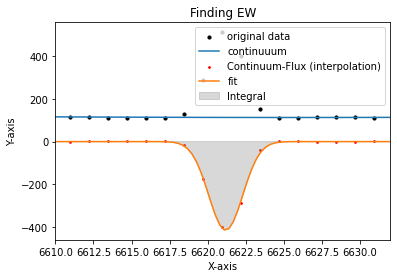

EW= -10.062376391799972  at (i,j)= 2 , 15


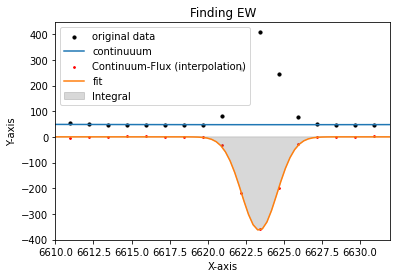

EW= -21.935621755355378  at (i,j)= 3 , 0


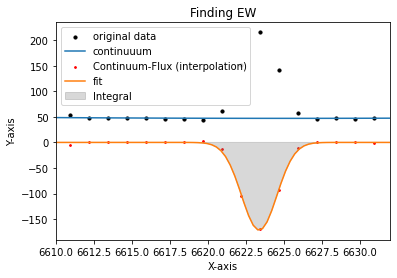

EW= -10.355296920388392  at (i,j)= 3 , 1


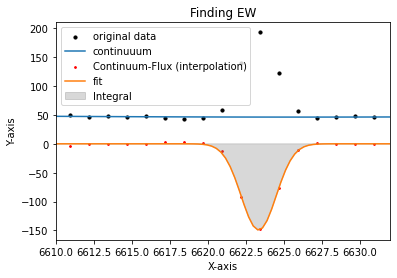

EW= -9.088320922830047  at (i,j)= 3 , 2


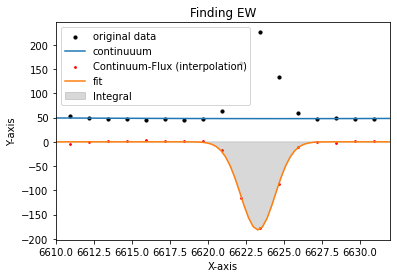

EW= -10.532719958063803  at (i,j)= 3 , 3


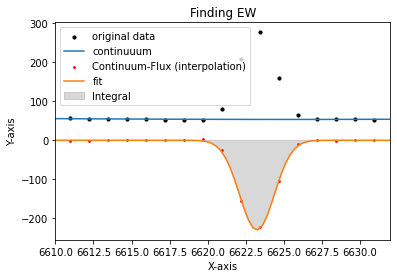

EW= -12.039695785602033  at (i,j)= 3 , 4


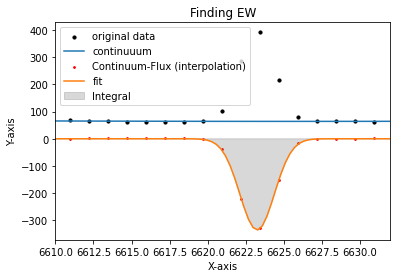

EW= -14.621950376540939  at (i,j)= 3 , 5


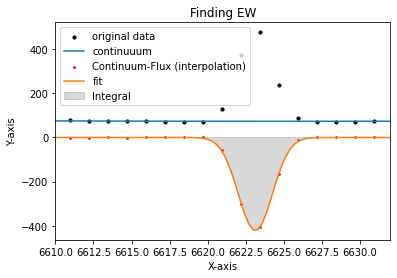

EW= -15.839907051129616  at (i,j)= 3 , 6


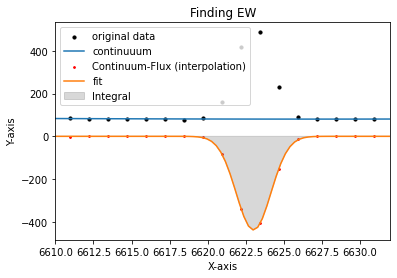

EW= -15.178970404934372  at (i,j)= 3 , 7


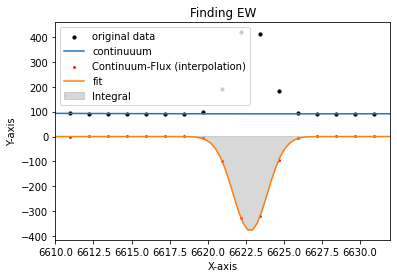

EW= -11.463641482781167  at (i,j)= 3 , 8


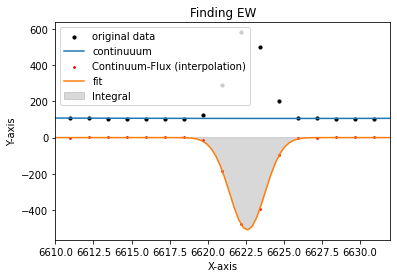

EW= -13.612079019474464  at (i,j)= 3 , 9


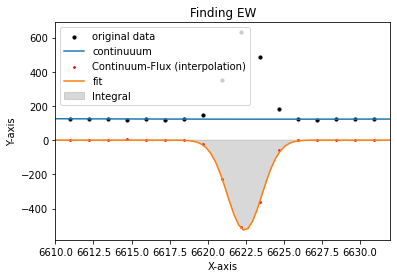

EW= -11.983964446047931  at (i,j)= 3 , 10


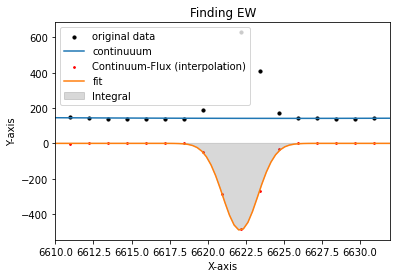

EW= -9.807207770206126  at (i,j)= 3 , 11


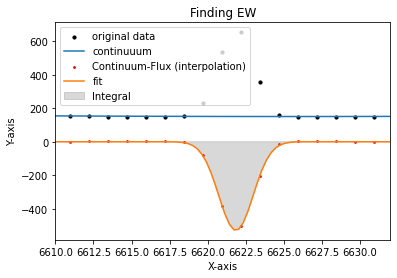

EW= -9.738521671706614  at (i,j)= 3 , 12


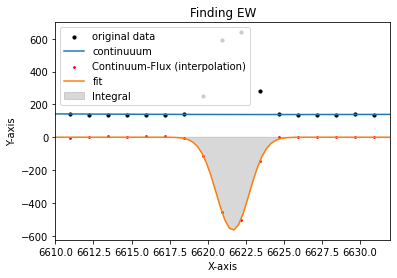

EW= -10.809445751227821  at (i,j)= 3 , 13


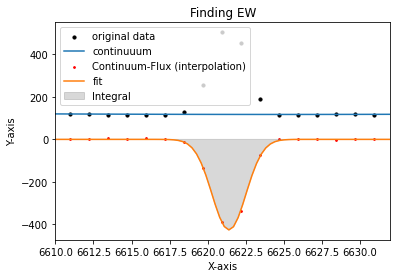

EW= -9.916153262495689  at (i,j)= 3 , 14


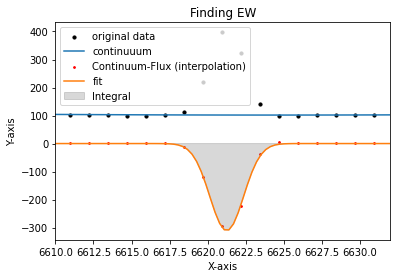

EW= -8.337456508975011  at (i,j)= 3 , 15


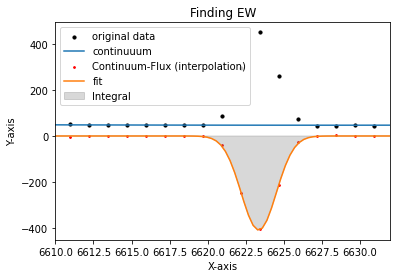

EW= -24.607424005622896  at (i,j)= 4 , 0


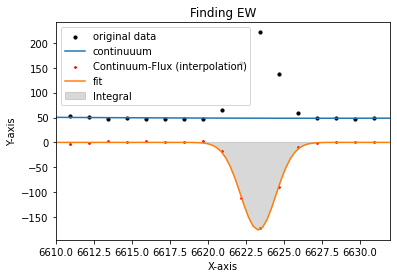

EW= -10.180382462550671  at (i,j)= 4 , 1


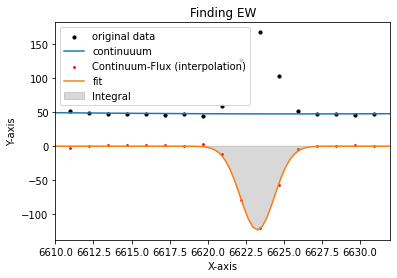

EW= -7.093712150418934  at (i,j)= 4 , 2


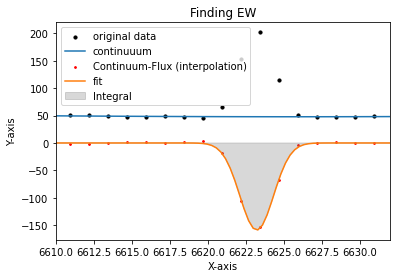

EW= -9.015757006812576  at (i,j)= 4 , 3


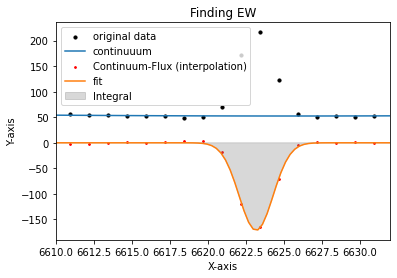

EW= -8.929023329945403  at (i,j)= 4 , 4


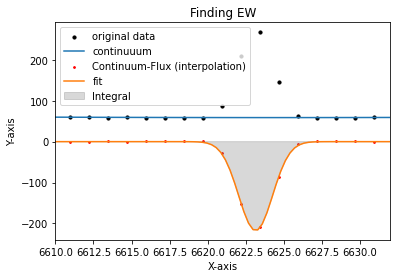

EW= -10.116576427064713  at (i,j)= 4 , 5


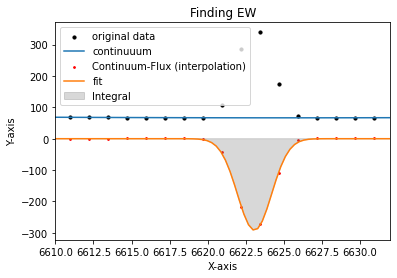

EW= -12.06509537334324  at (i,j)= 4 , 6


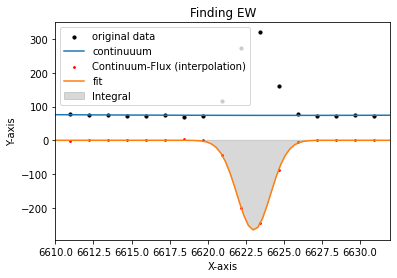

EW= -9.671821408573704  at (i,j)= 4 , 7


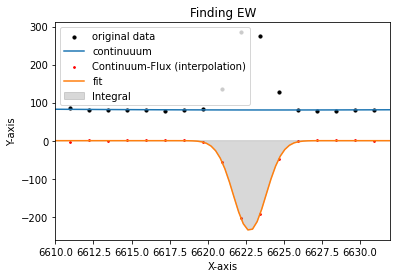

EW= -7.692912624297423  at (i,j)= 4 , 8


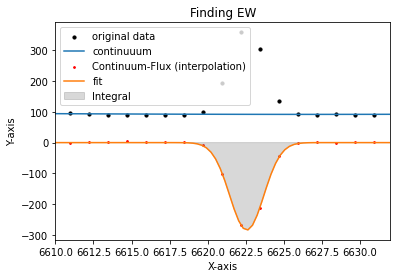

EW= -8.498793446649877  at (i,j)= 4 , 9


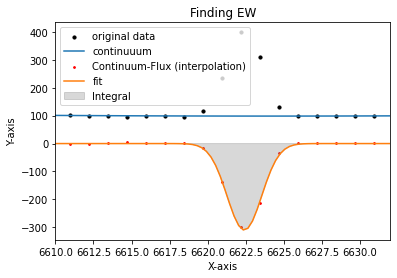

EW= -8.796971071013507  at (i,j)= 4 , 10


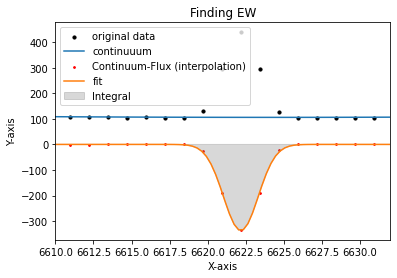

EW= -8.906246644910162  at (i,j)= 4 , 11


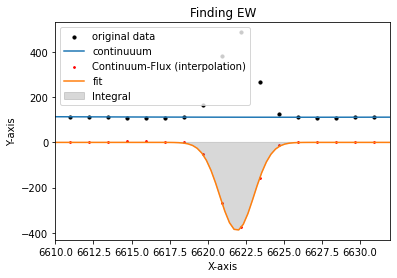

EW= -9.611594147113465  at (i,j)= 4 , 12


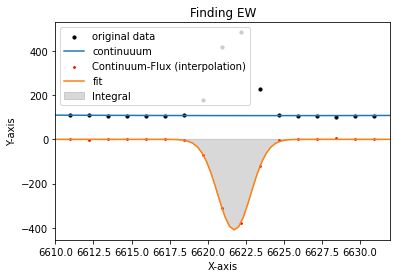

EW= -10.155351642971832  at (i,j)= 4 , 13


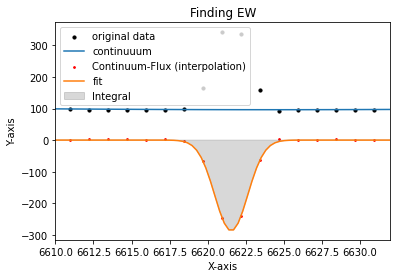

EW= -7.9417307679610385  at (i,j)= 4 , 14


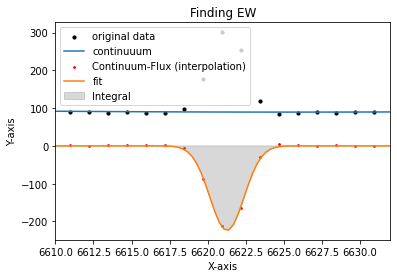

EW= -6.887537312893801  at (i,j)= 4 , 15


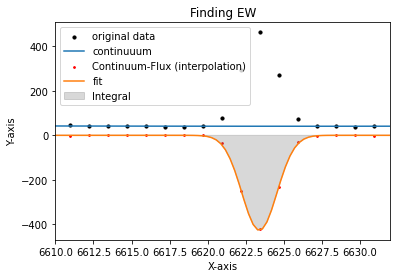

EW= -29.508019996973772  at (i,j)= 5 , 0


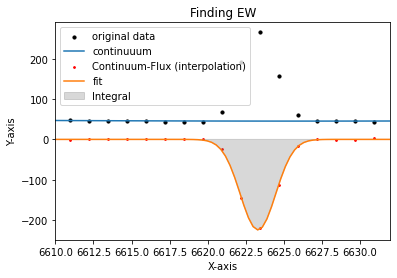

EW= -14.08021088757531  at (i,j)= 5 , 1


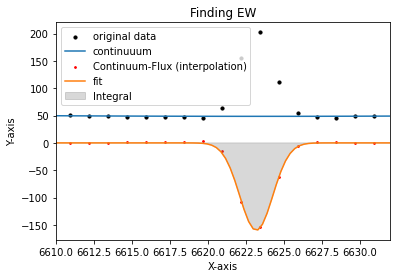

EW= -8.757602814706075  at (i,j)= 5 , 2


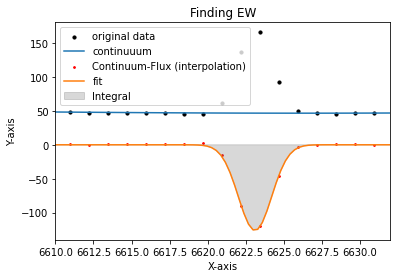

EW= -7.266185096825474  at (i,j)= 5 , 3


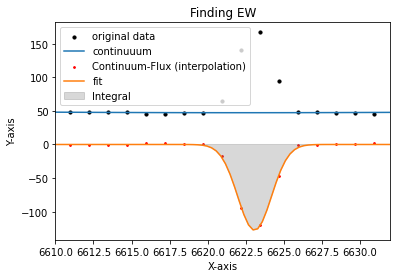

EW= -7.348229964960367  at (i,j)= 5 , 4


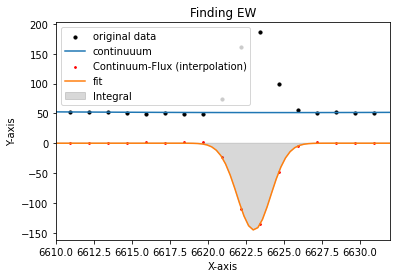

EW= -7.664418210884409  at (i,j)= 5 , 5


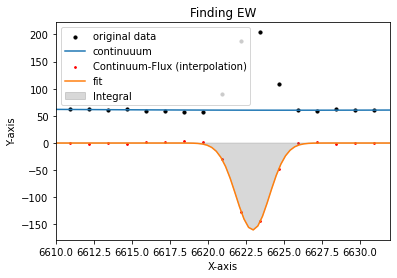

EW= -7.154025623855777  at (i,j)= 5 , 6


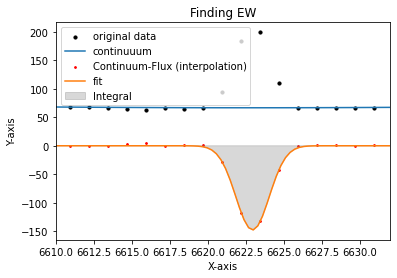

EW= -5.970107185920608  at (i,j)= 5 , 7


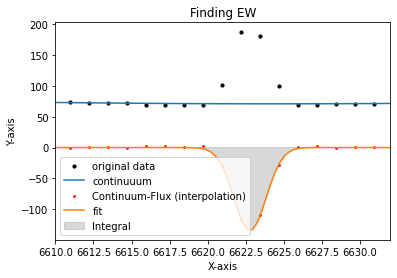

EW= -4.941020479100281  at (i,j)= 5 , 8


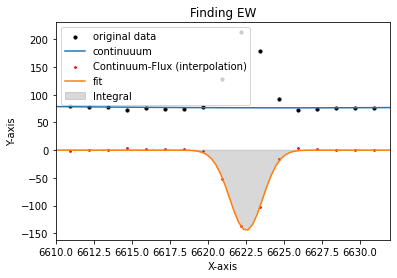

EW= -5.013560859617193  at (i,j)= 5 , 9


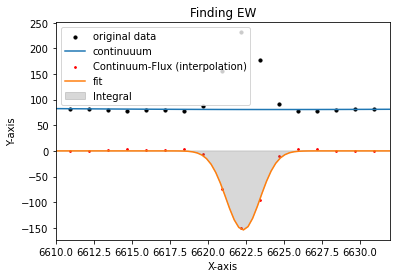

EW= -5.225299780127643  at (i,j)= 5 , 10


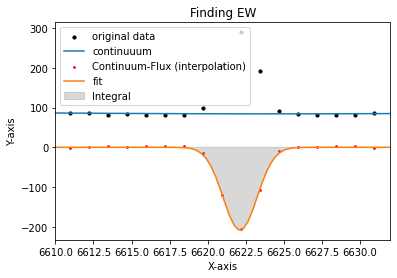

EW= -6.7531560014130285  at (i,j)= 5 , 11


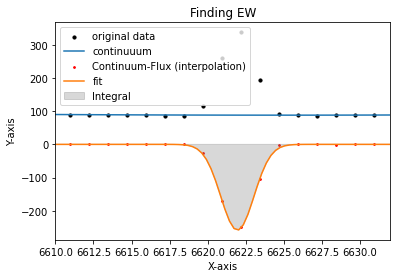

EW= -7.857162222221837  at (i,j)= 5 , 12


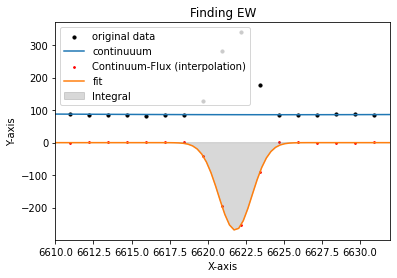

EW= -8.414191310584611  at (i,j)= 5 , 13


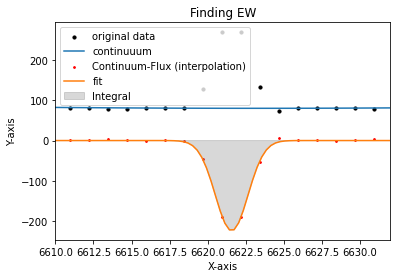

EW= -7.363662676433745  at (i,j)= 5 , 14


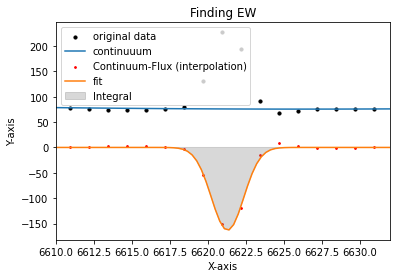

EW= -5.6086466216578845  at (i,j)= 5 , 15


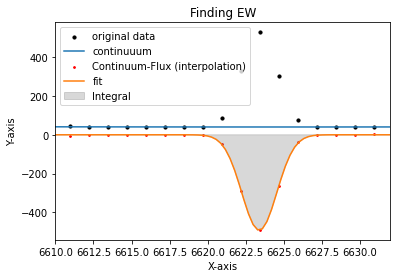

EW= -34.66051546601236  at (i,j)= 6 , 0


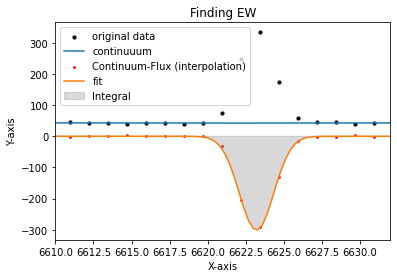

EW= -19.72458382749551  at (i,j)= 6 , 1


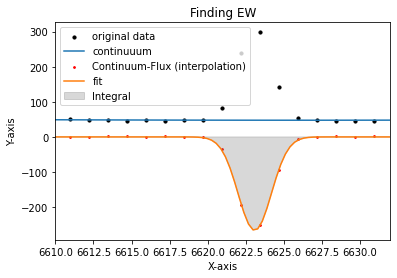

EW= -15.022970120167619  at (i,j)= 6 , 2


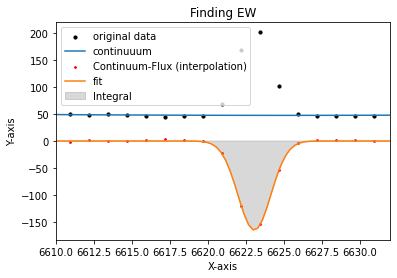

EW= -9.204905635154413  at (i,j)= 6 , 3


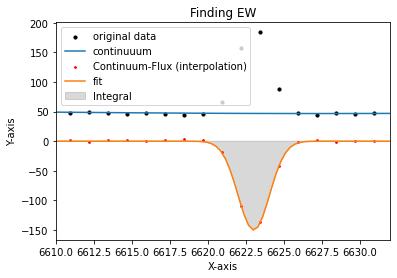

EW= -8.12259162414068  at (i,j)= 6 , 4


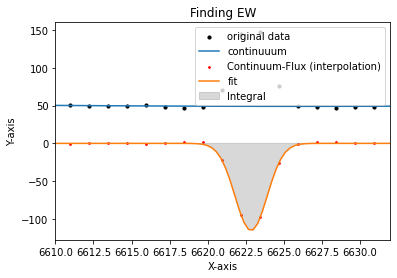

EW= -6.085848744246437  at (i,j)= 6 , 5


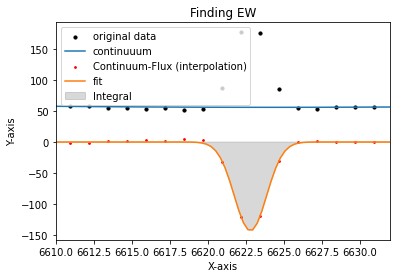

EW= -6.657378809193684  at (i,j)= 6 , 6


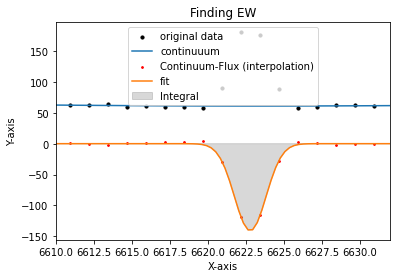

EW= -5.91337804253697  at (i,j)= 6 , 7


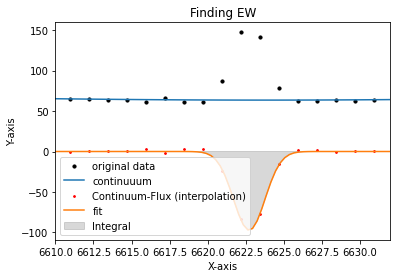

EW= -3.892710552675657  at (i,j)= 6 , 8


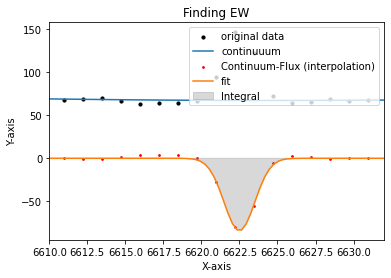

EW= -3.102121552493911  at (i,j)= 6 , 9


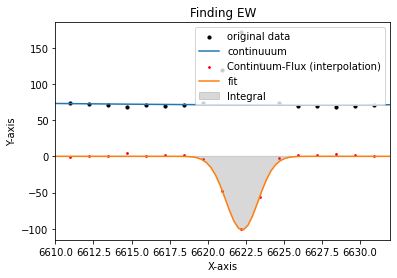

EW= -3.7073545106371792  at (i,j)= 6 , 10


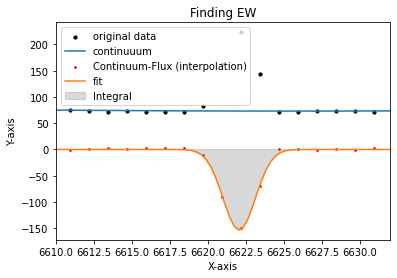

EW= -5.488811618476332  at (i,j)= 6 , 11


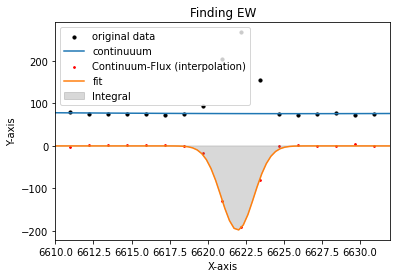

EW= -6.866096175632833  at (i,j)= 6 , 12


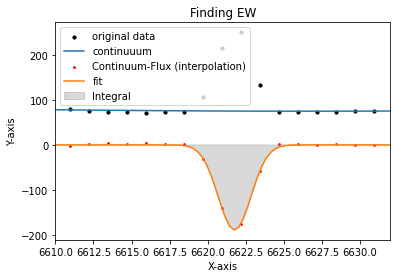

EW= -6.649161713524707  at (i,j)= 6 , 13


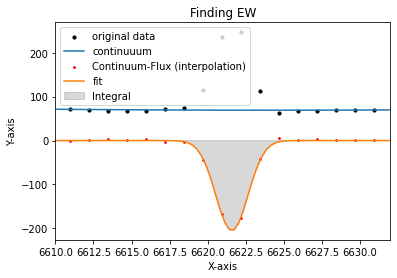

EW= -7.724250956104966  at (i,j)= 6 , 14


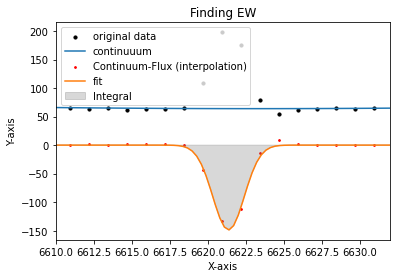

EW= -5.908341068624968  at (i,j)= 6 , 15


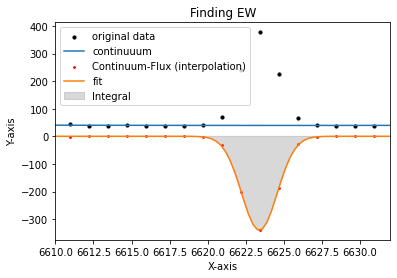

EW= -24.713027553810516  at (i,j)= 7 , 0


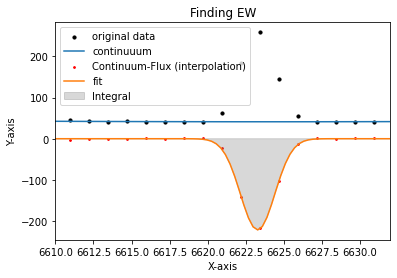

EW= -14.957325993168197  at (i,j)= 7 , 1


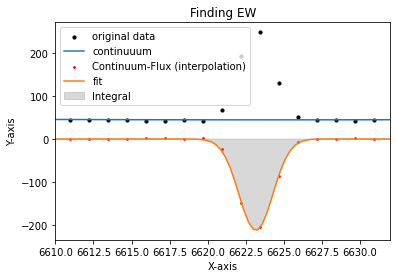

EW= -12.9928037688071  at (i,j)= 7 , 2


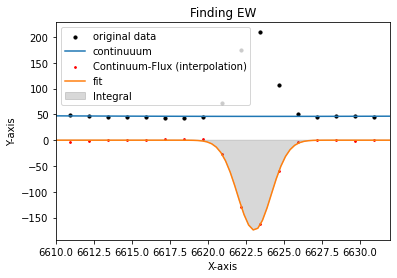

EW= -10.253680288134888  at (i,j)= 7 , 3


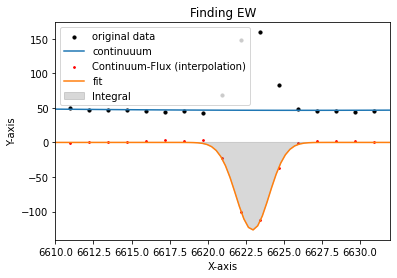

EW= -7.292615872923173  at (i,j)= 7 , 4


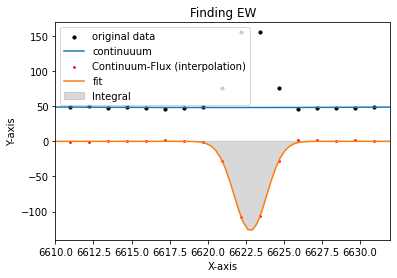

EW= -6.907223120452503  at (i,j)= 7 , 5


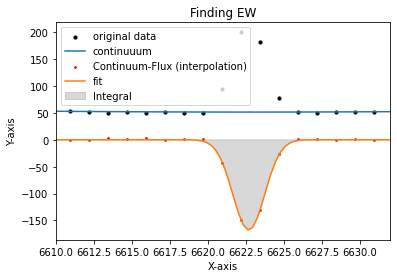

EW= -8.358657995590429  at (i,j)= 7 , 6


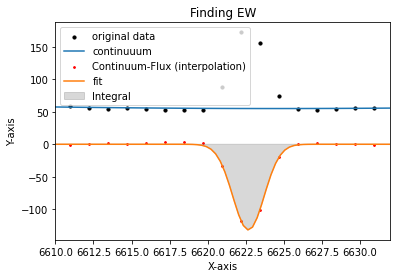

EW= -6.060935191329897  at (i,j)= 7 , 7


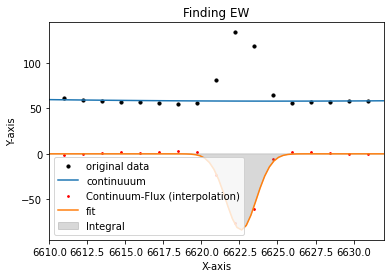

EW= -3.5273435825559436  at (i,j)= 7 , 8


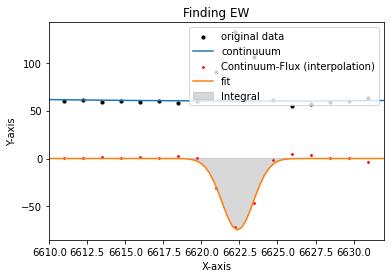

EW= -3.1571665892449388  at (i,j)= 7 , 9


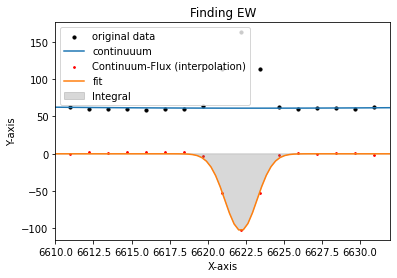

EW= -4.328493137400053  at (i,j)= 7 , 10


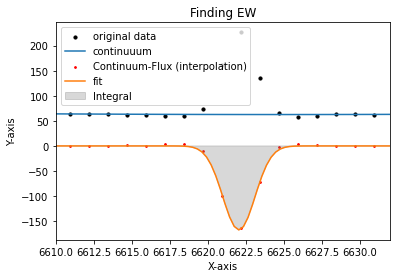

EW= -6.941675678331095  at (i,j)= 7 , 11


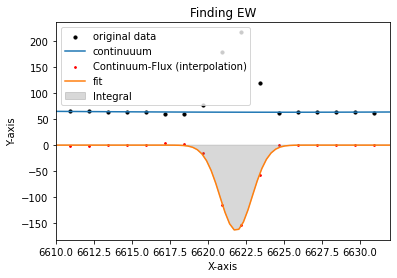

EW= -6.70449588706268  at (i,j)= 7 , 12


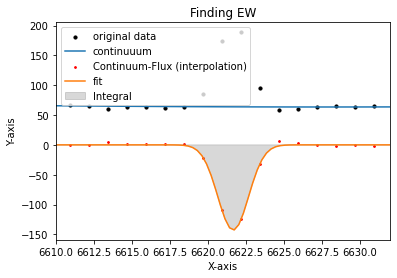

EW= -5.566781287079288  at (i,j)= 7 , 13


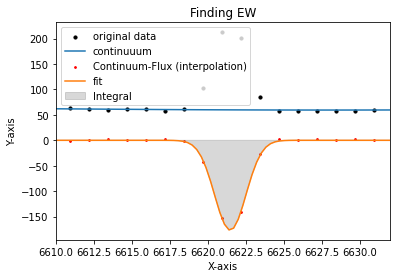

EW= -7.481284858392395  at (i,j)= 7 , 14


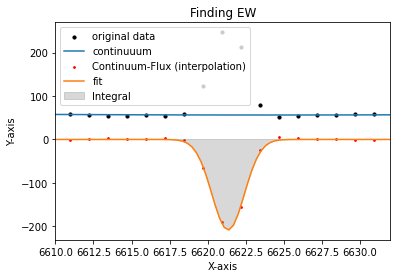

EW= -9.652364697008657  at (i,j)= 7 , 15


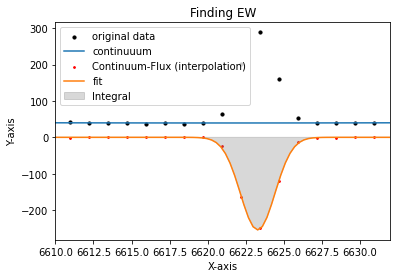

EW= -17.94453772149255  at (i,j)= 8 , 0


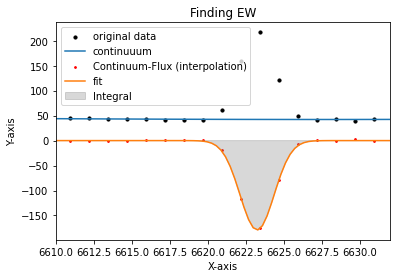

EW= -11.648915561602672  at (i,j)= 8 , 1


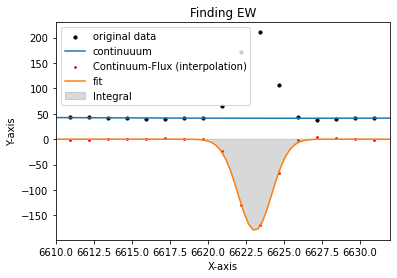

EW= -11.722056300982754  at (i,j)= 8 , 2


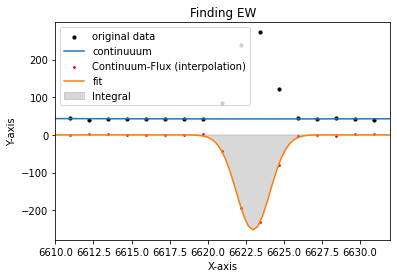

EW= -16.04310787603173  at (i,j)= 8 , 3


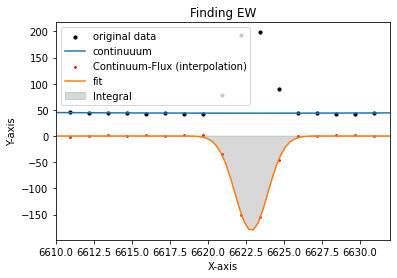

EW= -10.913734012729277  at (i,j)= 8 , 4


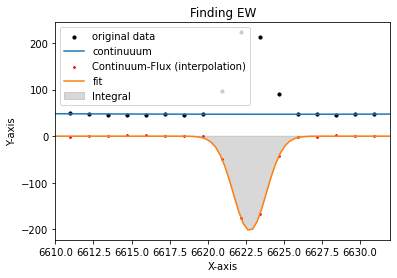

EW= -11.41895496365943  at (i,j)= 8 , 5


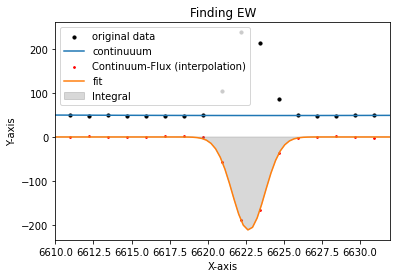

EW= -11.364708988878839  at (i,j)= 8 , 6


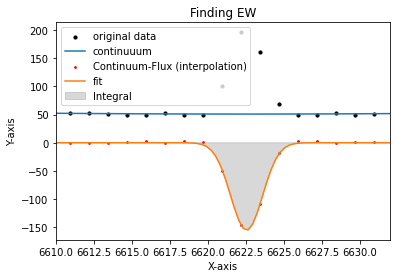

EW= -7.857888624526234  at (i,j)= 8 , 7


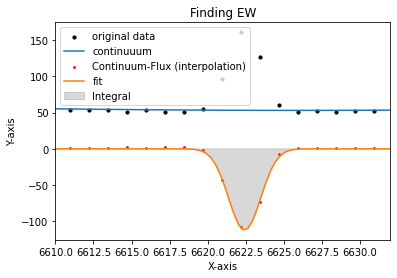

EW= -5.453580225604615  at (i,j)= 8 , 8


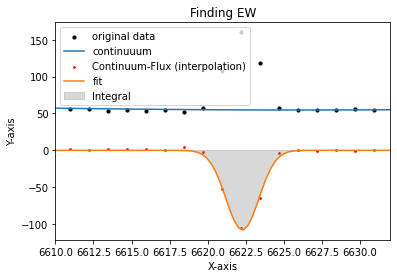

EW= -5.233419568293004  at (i,j)= 8 , 9


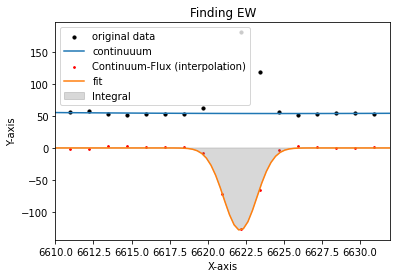

EW= -6.370546309125595  at (i,j)= 8 , 10


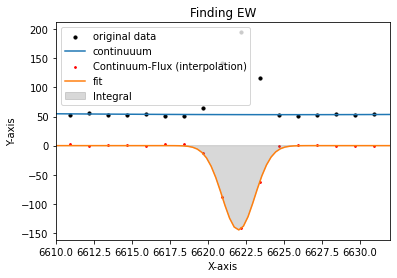

EW= -7.158907051552232  at (i,j)= 8 , 11


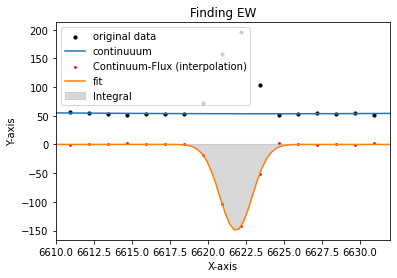

EW= -7.288233473851141  at (i,j)= 8 , 12


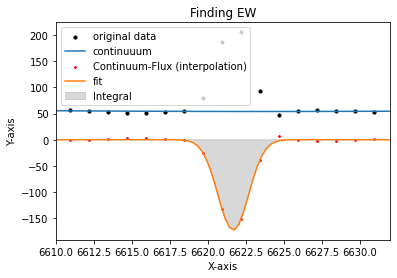

EW= -7.962239550258281  at (i,j)= 8 , 13


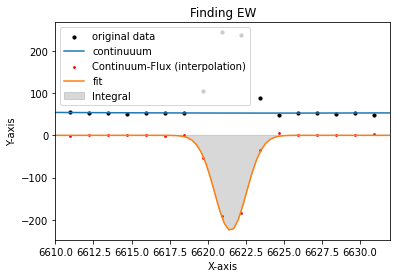

EW= -10.866694635510692  at (i,j)= 8 , 14


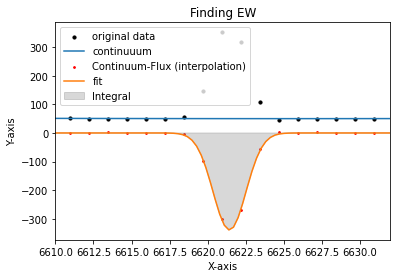

EW= -17.978407969256114  at (i,j)= 8 , 15


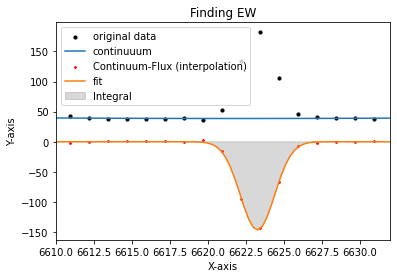

EW= -10.473915568745525  at (i,j)= 9 , 0


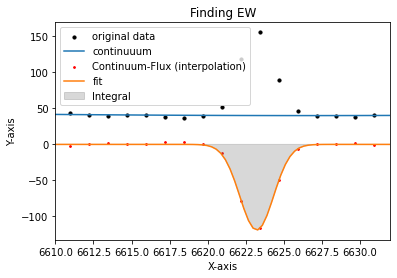

EW= -8.06391593100551  at (i,j)= 9 , 1


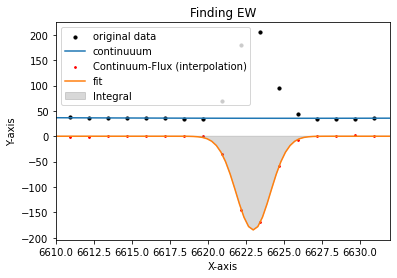

EW= -14.396055280252257  at (i,j)= 9 , 2


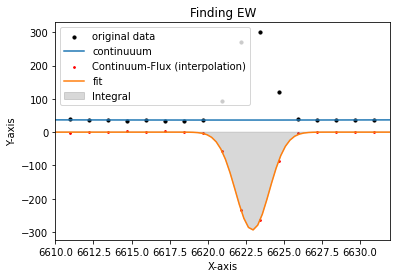

EW= -21.946378471058157  at (i,j)= 9 , 3


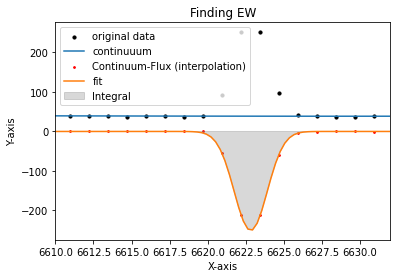

EW= -17.25850651931269  at (i,j)= 9 , 4


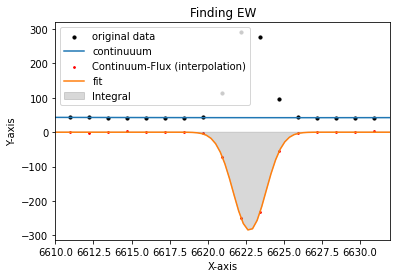

EW= -17.846242660926418  at (i,j)= 9 , 5


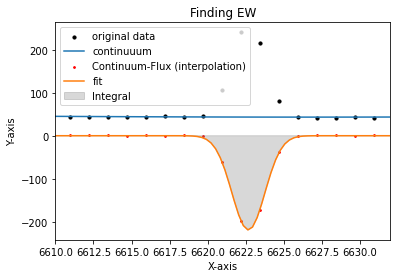

EW= -13.457084811401488  at (i,j)= 9 , 6


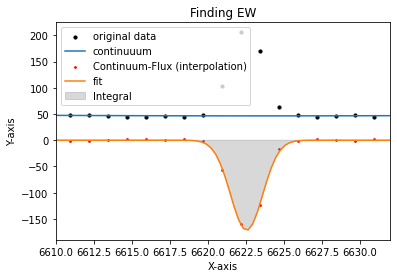

EW= -9.551240367735703  at (i,j)= 9 , 7


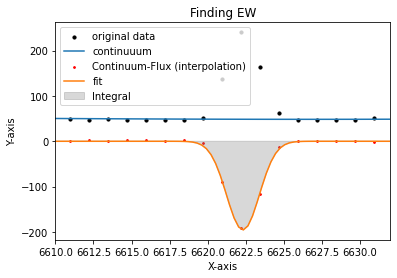

EW= -10.65102794955592  at (i,j)= 9 , 8


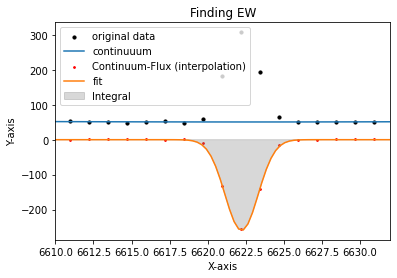

EW= -13.680778500273677  at (i,j)= 9 , 9


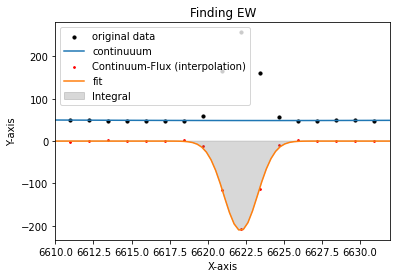

EW= -11.774921535968101  at (i,j)= 9 , 10


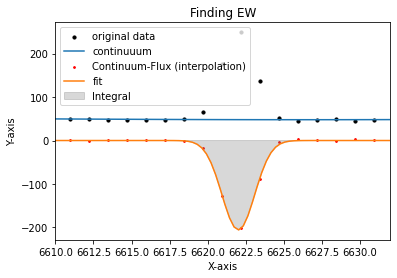

EW= -11.318024655485381  at (i,j)= 9 , 11


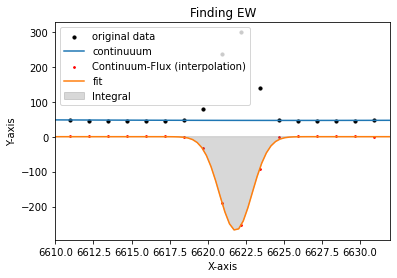

EW= -15.184896136522541  at (i,j)= 9 , 12


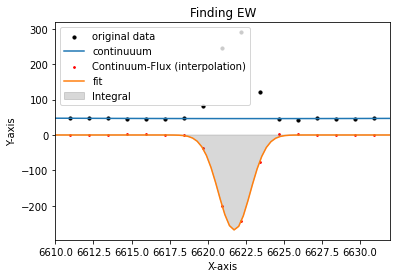

EW= -14.856997162533752  at (i,j)= 9 , 13


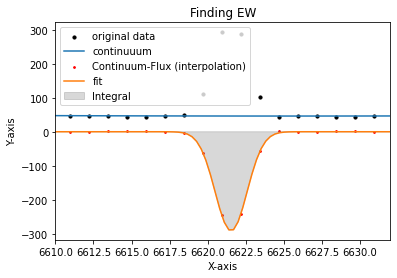

EW= -16.278705734260413  at (i,j)= 9 , 14


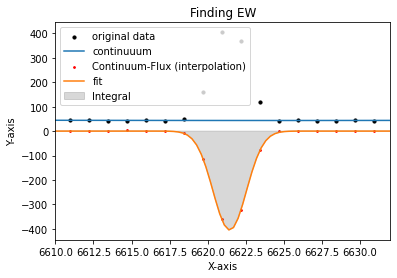

EW= -25.087819163035302  at (i,j)= 9 , 15


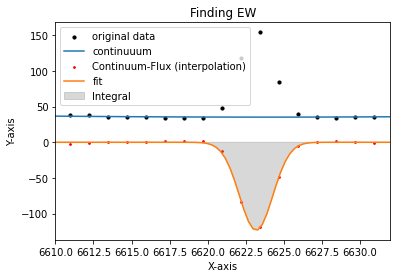

EW= -9.412941157325625  at (i,j)= 10 , 0


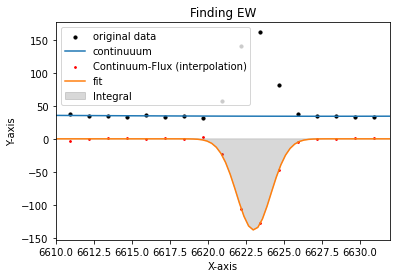

EW= -11.132497029294301  at (i,j)= 10 , 1


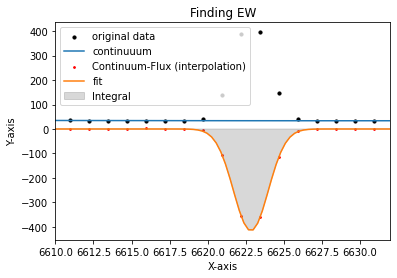

EW= -34.5210263203105  at (i,j)= 10 , 2


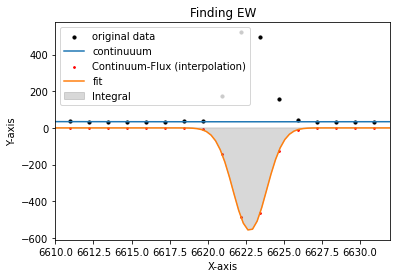

EW= -45.34798112101716  at (i,j)= 10 , 3


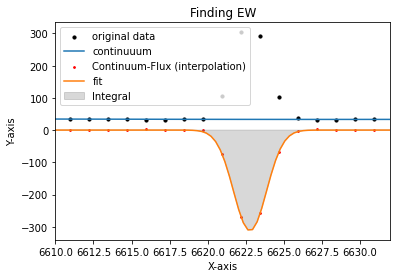

EW= -25.044552061001326  at (i,j)= 10 , 4


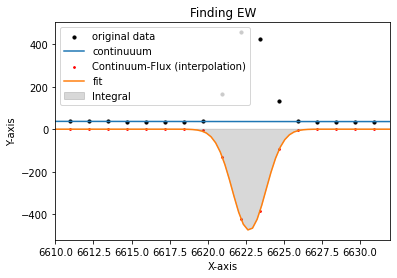

EW= -35.526551445271004  at (i,j)= 10 , 5


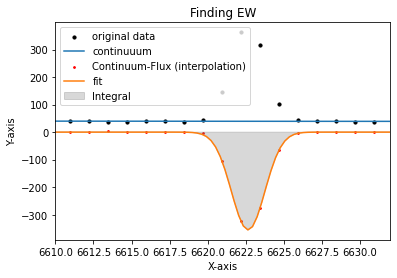

EW= -24.36916425145913  at (i,j)= 10 , 6


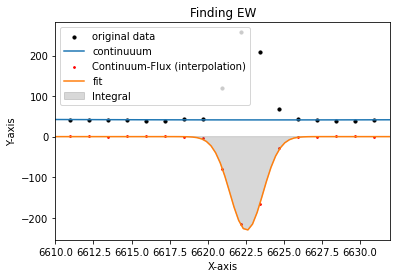

EW= -14.87698576398159  at (i,j)= 10 , 7


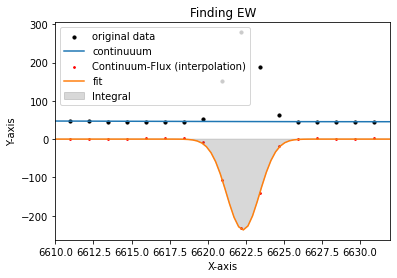

EW= -13.691089733135065  at (i,j)= 10 , 8


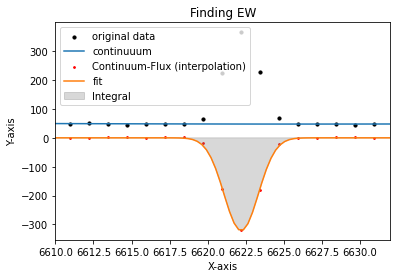

EW= -18.618505291505667  at (i,j)= 10 , 9


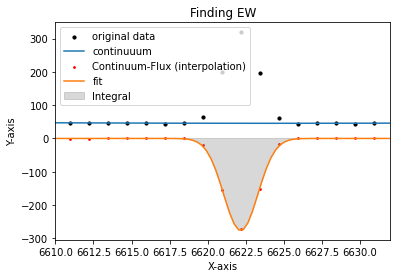

EW= -16.72571315232093  at (i,j)= 10 , 10


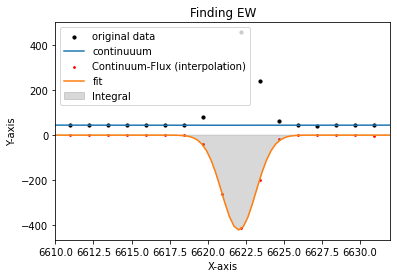

EW= -26.13779407594809  at (i,j)= 10 , 11


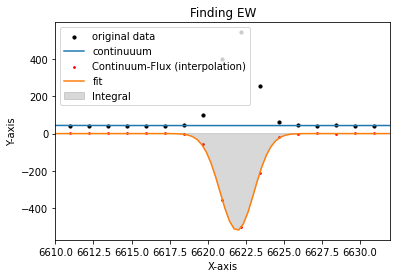

EW= -33.014508467813684  at (i,j)= 10 , 12


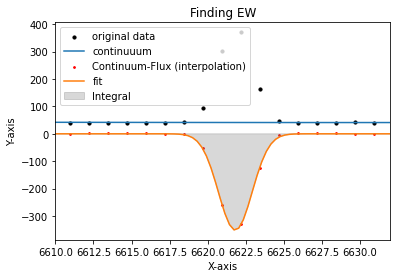

EW= -23.159942879344694  at (i,j)= 10 , 13


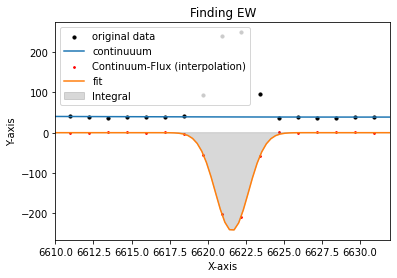

EW= -16.63475183939237  at (i,j)= 10 , 14


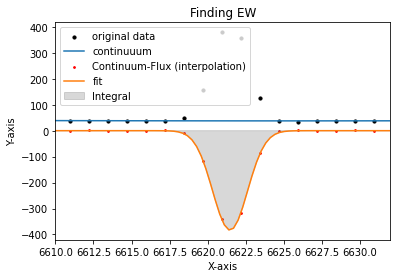

EW= -28.52819709727387  at (i,j)= 10 , 15


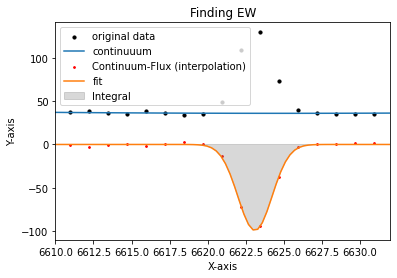

EW= -7.582327754476915  at (i,j)= 11 , 0


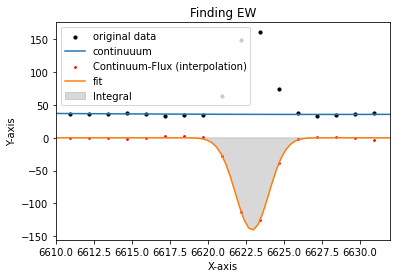

EW= -10.56953238618974  at (i,j)= 11 , 1


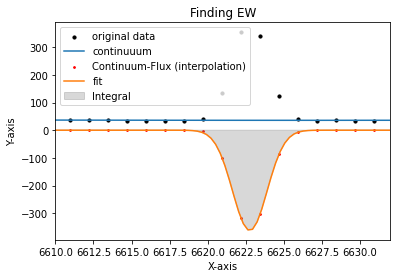

EW= -28.214715666848107  at (i,j)= 11 , 2


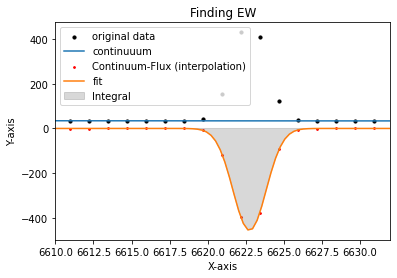

EW= -35.89540529599761  at (i,j)= 11 , 3


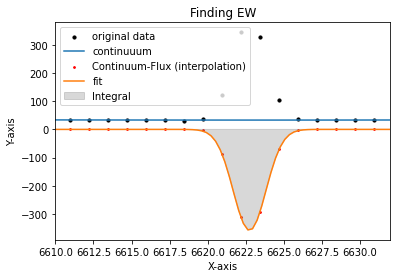

EW= -28.61273363297342  at (i,j)= 11 , 4


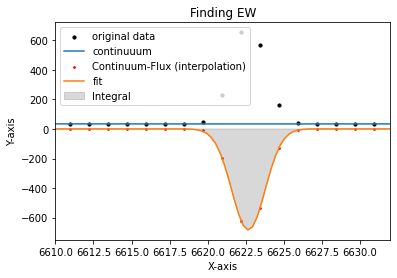

EW= -54.029177690892595  at (i,j)= 11 , 5


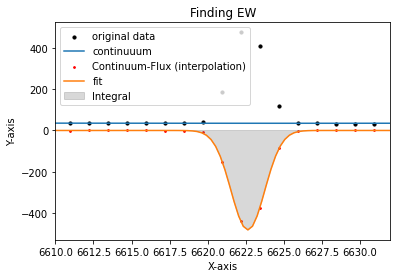

EW= -37.46470843782166  at (i,j)= 11 , 6


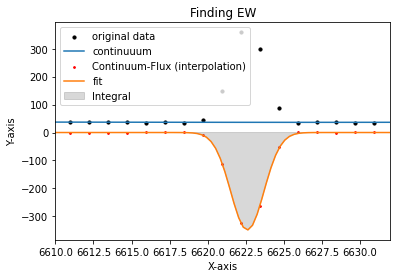

EW= -25.619692181888297  at (i,j)= 11 , 7


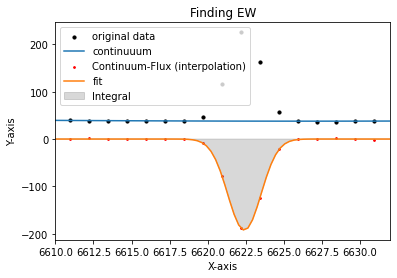

EW= -13.64187429937685  at (i,j)= 11 , 8


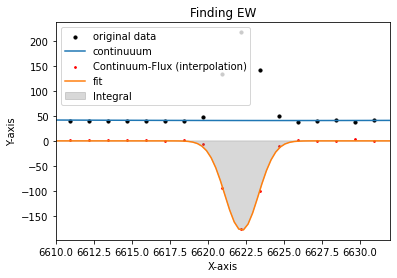

EW= -11.848429623047513  at (i,j)= 11 , 9


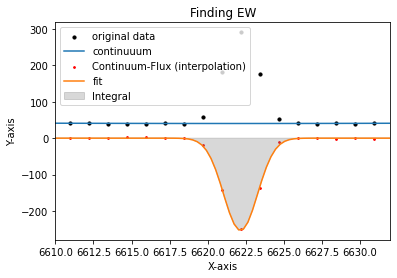

EW= -17.23291886781395  at (i,j)= 11 , 10


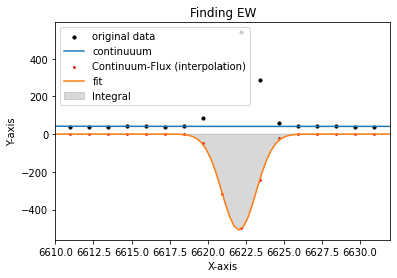

EW= -34.300290594717765  at (i,j)= 11 , 11


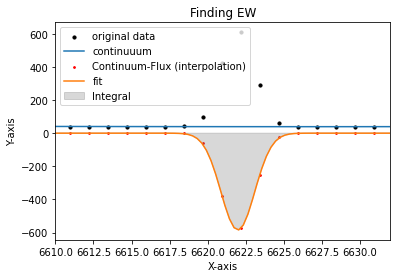

EW= -40.482964629422625  at (i,j)= 11 , 12


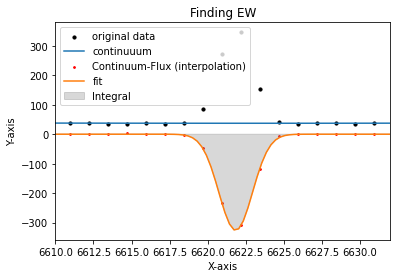

EW= -23.779565642247398  at (i,j)= 11 , 13


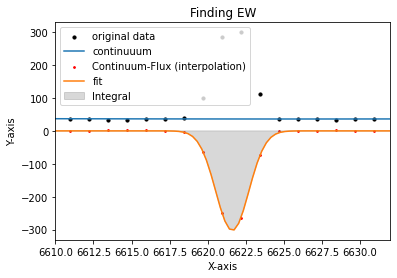

EW= -22.31562487758003  at (i,j)= 11 , 14


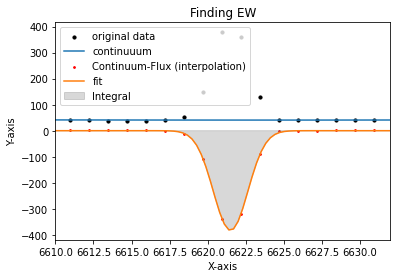

EW= -26.2390411587136  at (i,j)= 11 , 15


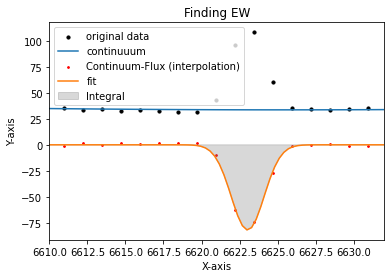

EW= -6.457013649142695  at (i,j)= 12 , 0


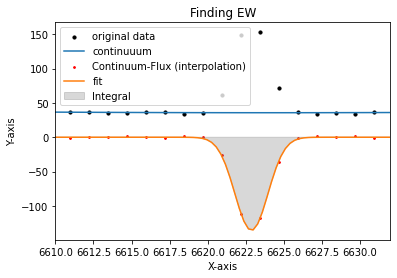

EW= -10.133341696877164  at (i,j)= 12 , 1


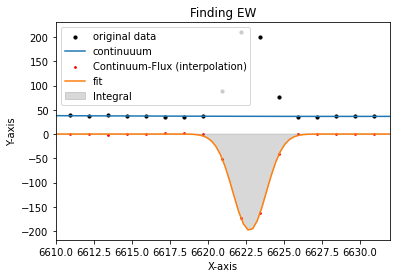

EW= -14.549773145715386  at (i,j)= 12 , 2


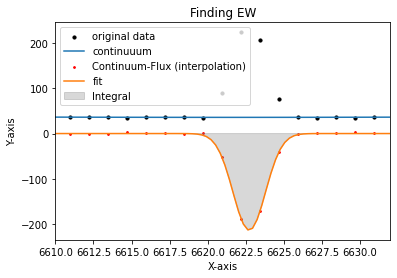

EW= -15.696985341898221  at (i,j)= 12 , 3


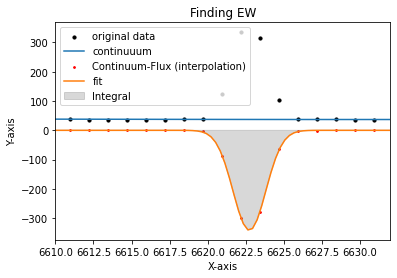

EW= -24.318244749454244  at (i,j)= 12 , 4


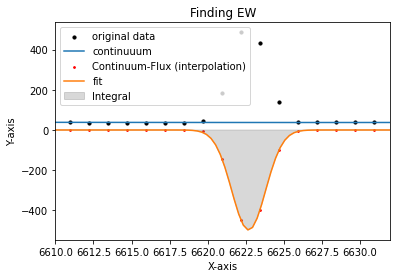

EW= -36.342593799901444  at (i,j)= 12 , 5


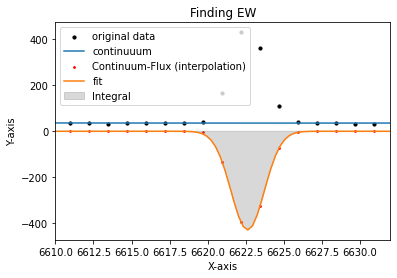

EW= -32.19504657331192  at (i,j)= 12 , 6


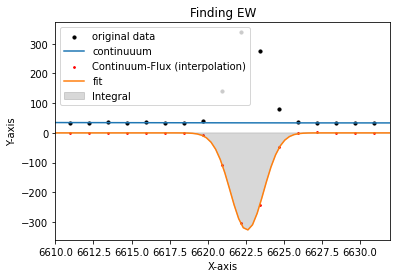

EW= -25.898095550369106  at (i,j)= 12 , 7


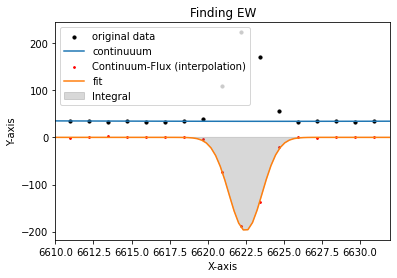

EW= -15.445479609120092  at (i,j)= 12 , 8


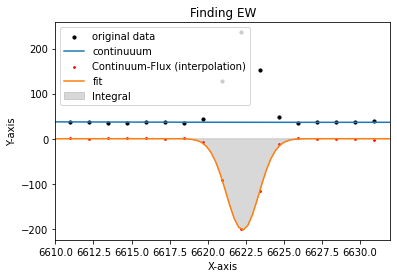

EW= -14.555867110583206  at (i,j)= 12 , 9


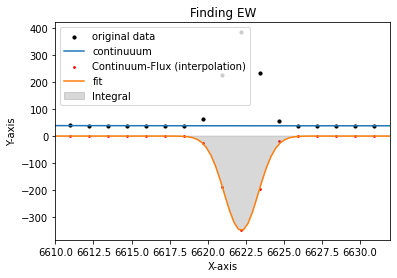

EW= -25.11828135774108  at (i,j)= 12 , 10


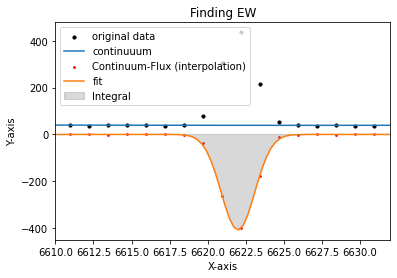

EW= -28.290882873127465  at (i,j)= 12 , 11


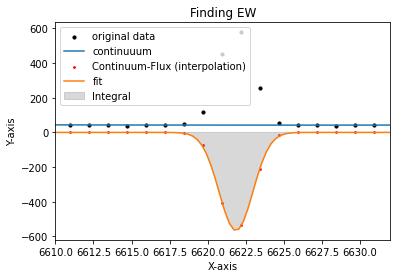

EW= -36.46187874013509  at (i,j)= 12 , 12


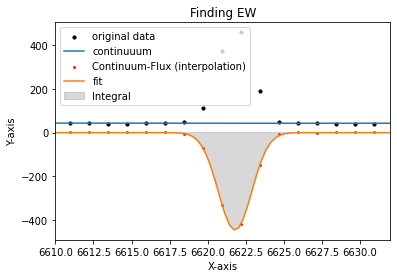

EW= -28.064466772065035  at (i,j)= 12 , 13


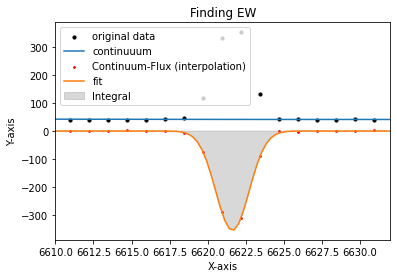

EW= -22.906365212320445  at (i,j)= 12 , 14


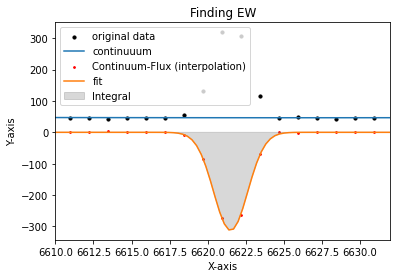

EW= -18.457613316249578  at (i,j)= 12 , 15


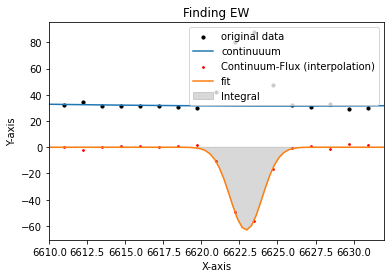

EW= -5.197309748497731  at (i,j)= 13 , 0


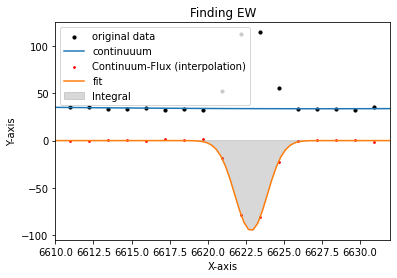

EW= -7.333837591837903  at (i,j)= 13 , 1


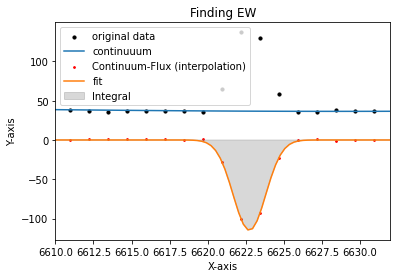

EW= -8.244238321280546  at (i,j)= 13 , 2


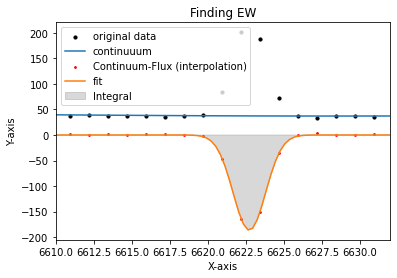

EW= -13.080395135486837  at (i,j)= 13 , 3


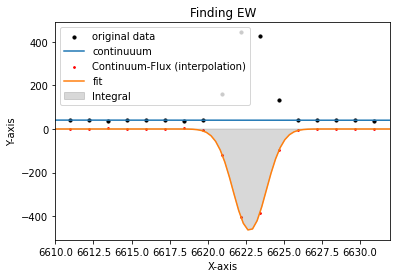

EW= -30.832857699643803  at (i,j)= 13 , 4


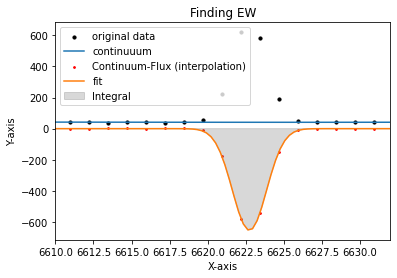

EW= -44.061967394210086  at (i,j)= 13 , 5


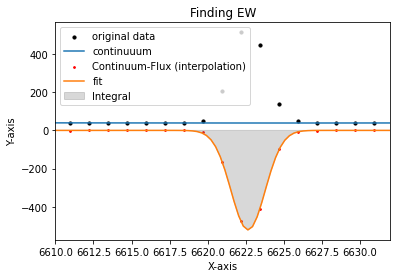

EW= -36.99241487582122  at (i,j)= 13 , 6


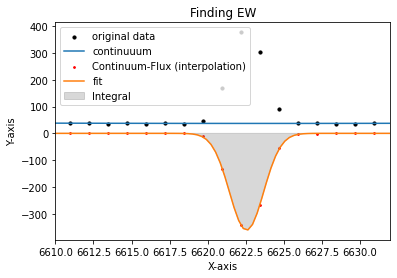

EW= -26.80118187430667  at (i,j)= 13 , 7


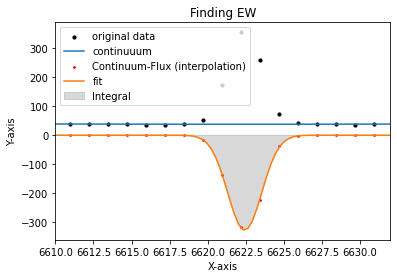

EW= -23.603468514958426  at (i,j)= 13 , 8


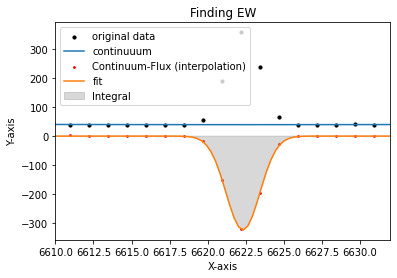

EW= -22.253839957398537  at (i,j)= 13 , 9


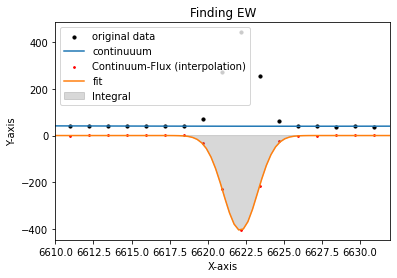

EW= -28.04766729404956  at (i,j)= 13 , 10


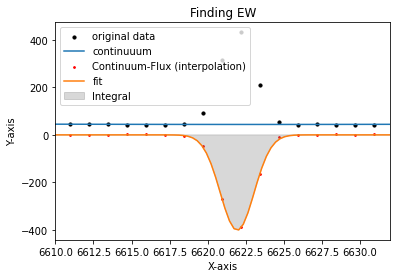

EW= -24.953592309650322  at (i,j)= 13 , 11


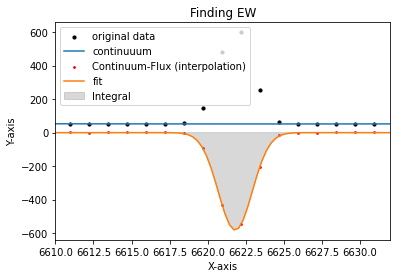

EW= -30.65564394851384  at (i,j)= 13 , 12


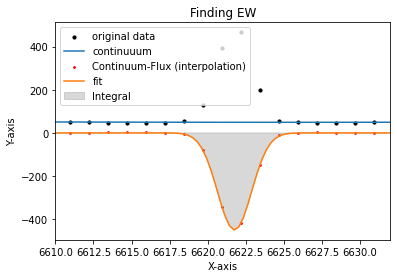

EW= -25.041334292673298  at (i,j)= 13 , 13


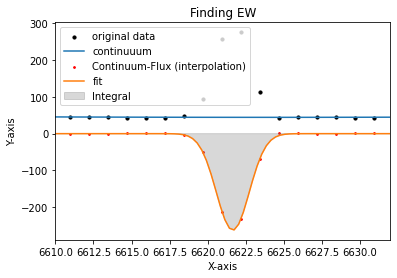

EW= -15.725770285045904  at (i,j)= 13 , 14


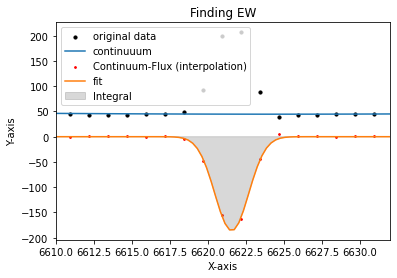

EW= -11.37316390180615  at (i,j)= 13 , 15


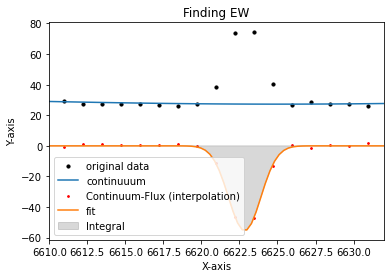

EW= -5.3008117317652  at (i,j)= 14 , 0


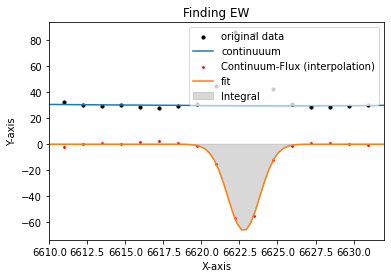

EW= -5.771714734323573  at (i,j)= 14 , 1


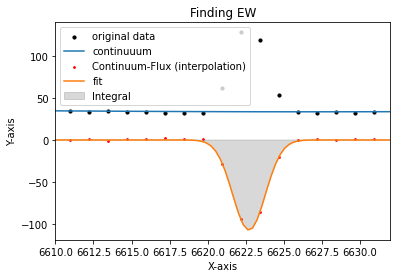

EW= -8.400742390791615  at (i,j)= 14 , 2


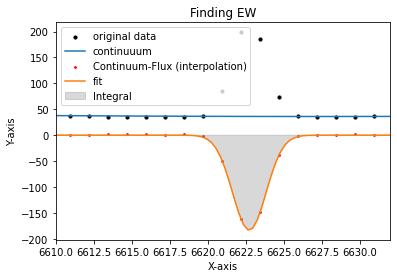

EW= -13.650413576647322  at (i,j)= 14 , 3


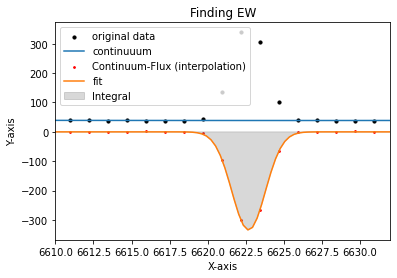

EW= -23.348020992678965  at (i,j)= 14 , 4


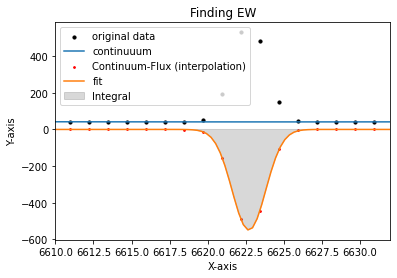

EW= -36.12954521437178  at (i,j)= 14 , 5


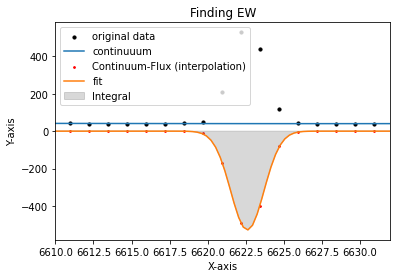

EW= -35.1856259803295  at (i,j)= 14 , 6


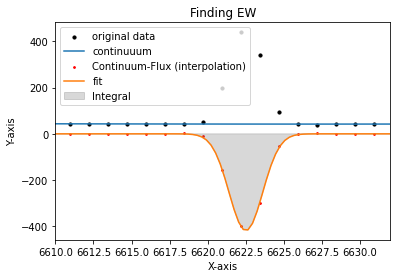

EW= -26.844288911975102  at (i,j)= 14 , 7


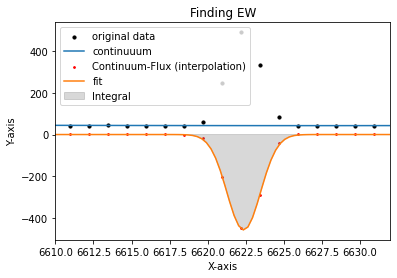

EW= -29.006182629791457  at (i,j)= 14 , 8


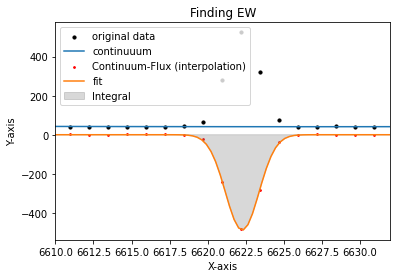

EW= -32.06686243887452  at (i,j)= 14 , 9


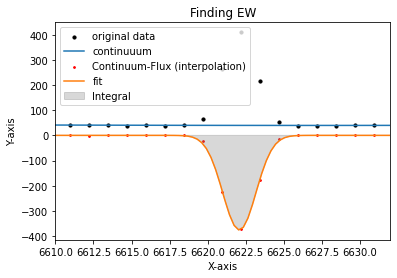

EW= -25.391294315740332  at (i,j)= 14 , 10


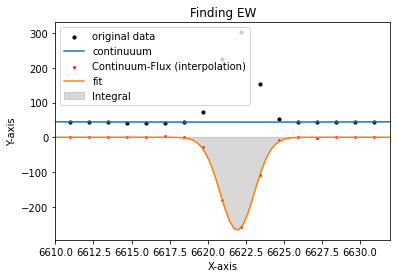

EW= -16.578258453604647  at (i,j)= 14 , 11


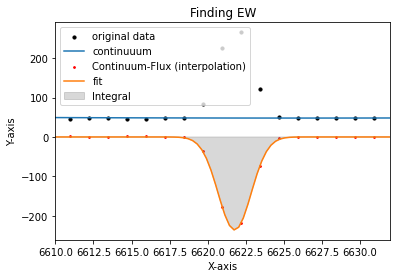

EW= -13.066002820250521  at (i,j)= 14 , 12


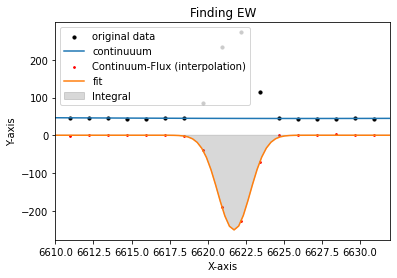

EW= -14.690726057883138  at (i,j)= 14 , 13


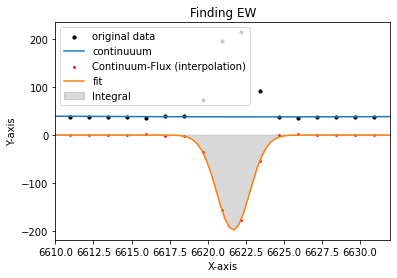

EW= -13.797546247892123  at (i,j)= 14 , 14


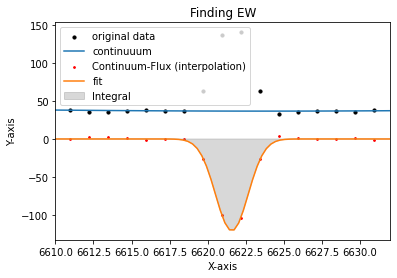

EW= -8.642249025883217  at (i,j)= 14 , 15


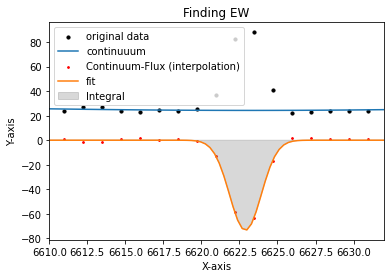

EW= -7.718910897201491  at (i,j)= 15 , 0


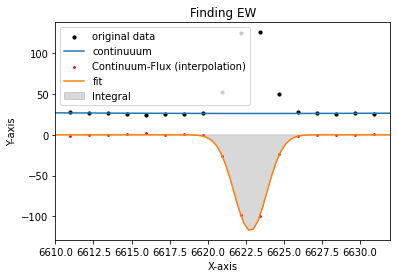

EW= -11.763948644487899  at (i,j)= 15 , 1


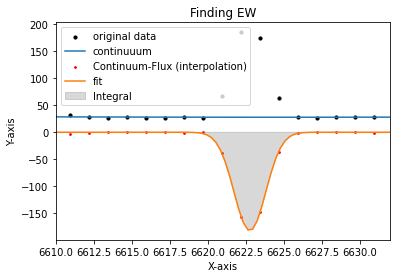

EW= -16.775899965495473  at (i,j)= 15 , 2


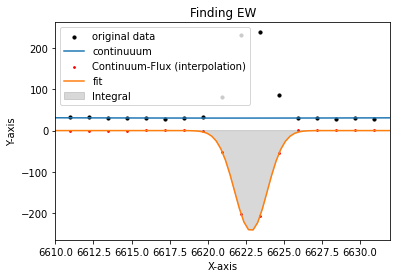

EW= -21.090168364896485  at (i,j)= 15 , 3


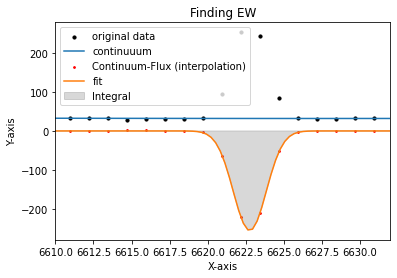

EW= -21.261279885556096  at (i,j)= 15 , 4


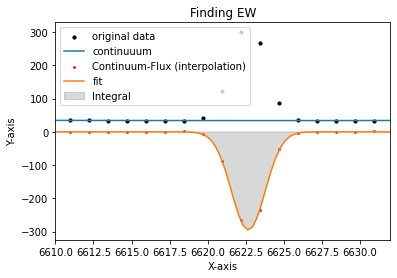

EW= -23.508222785414848  at (i,j)= 15 , 5


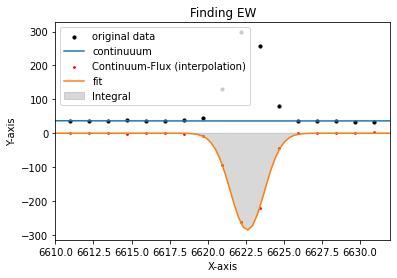

EW= -21.40419686493426  at (i,j)= 15 , 6


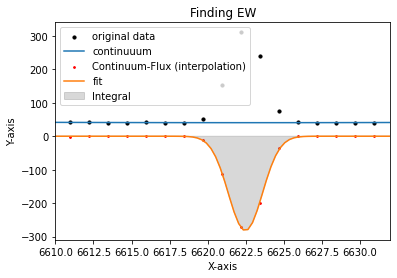

EW= -19.115299267467396  at (i,j)= 15 , 7


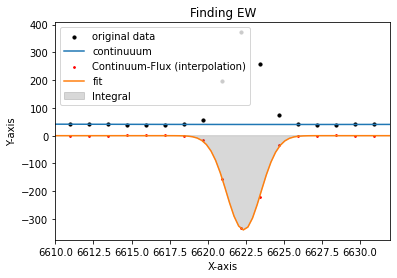

EW= -23.24783072797532  at (i,j)= 15 , 8


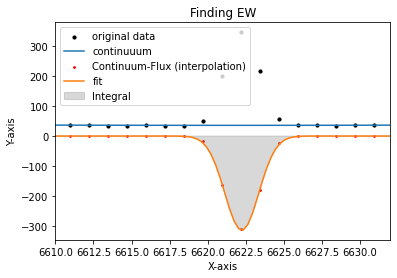

EW= -24.05317564852623  at (i,j)= 15 , 9


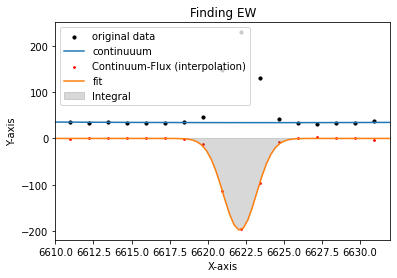

EW= -15.504399945972251  at (i,j)= 15 , 10


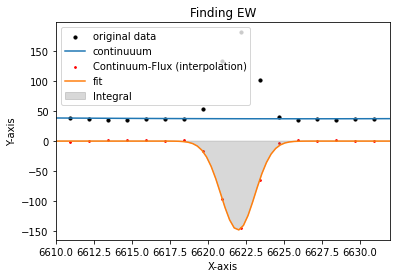

EW= -10.846076428784363  at (i,j)= 15 , 11


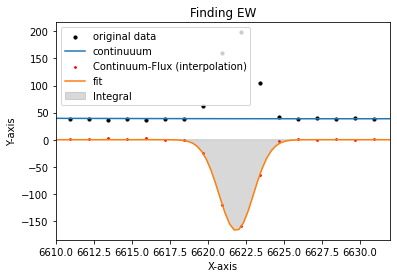

EW= -11.926857995396182  at (i,j)= 15 , 12


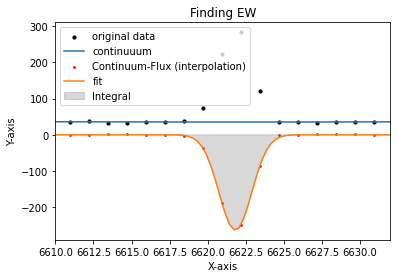

EW= -19.64987057636955  at (i,j)= 15 , 13


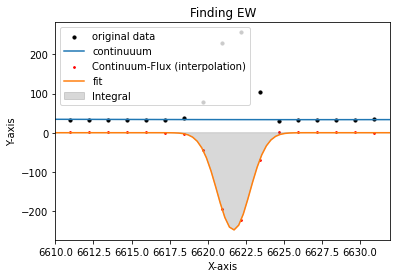

EW= -19.743796532695622  at (i,j)= 15 , 14


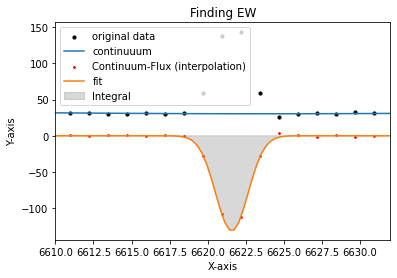

EW= -11.256711133058632  at (i,j)= 15 , 15


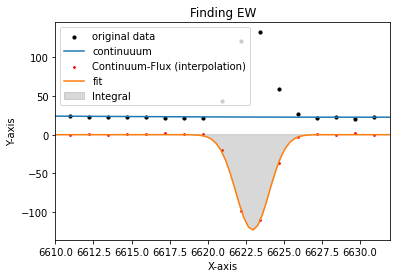

EW= -14.50042528861867  at (i,j)= 16 , 0


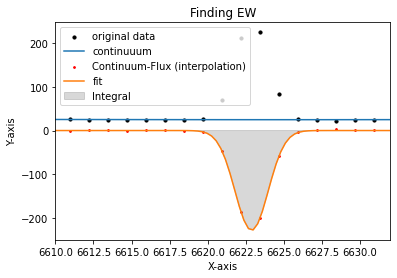

EW= -24.666039164354498  at (i,j)= 16 , 1


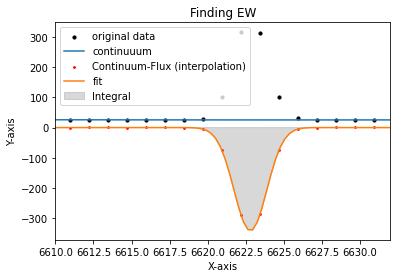

EW= -35.68719485005457  at (i,j)= 16 , 2


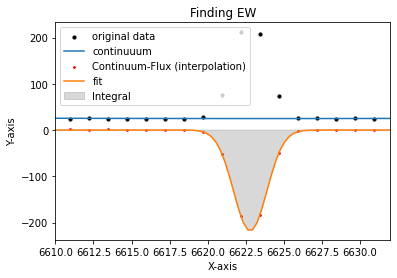

EW= -23.438779664532056  at (i,j)= 16 , 3


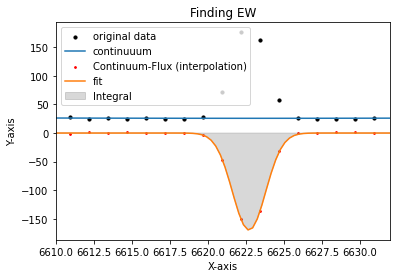

EW= -17.654499750774278  at (i,j)= 16 , 4


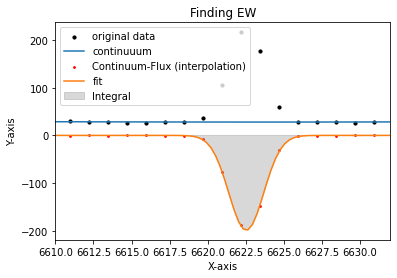

EW= -19.979351925461238  at (i,j)= 16 , 5


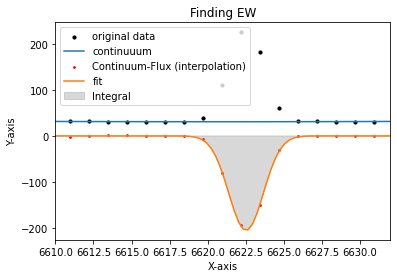

EW= -18.568446673024606  at (i,j)= 16 , 6


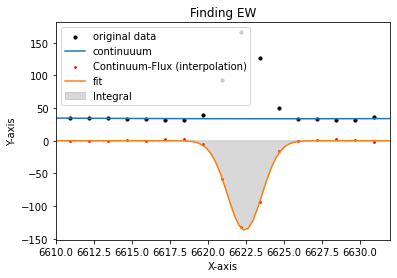

EW= -11.252421482962266  at (i,j)= 16 , 7


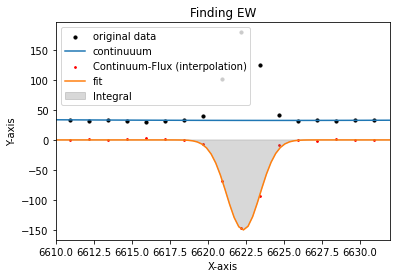

EW= -12.408315962345755  at (i,j)= 16 , 8


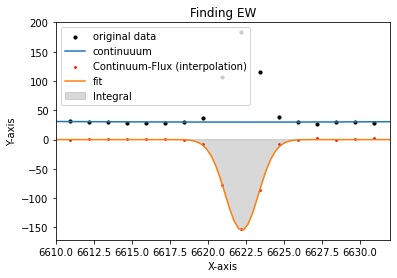

EW= -13.816463618085633  at (i,j)= 16 , 9


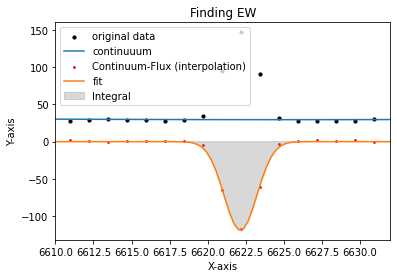

EW= -10.695149832734185  at (i,j)= 16 , 10


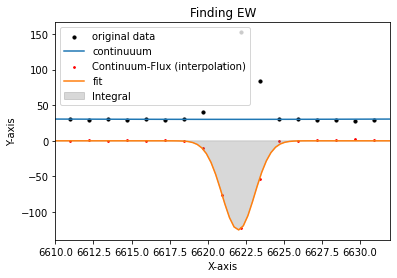

EW= -10.869930857407853  at (i,j)= 16 , 11


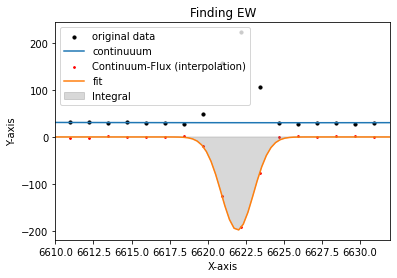

EW= -17.000294810650697  at (i,j)= 16 , 12


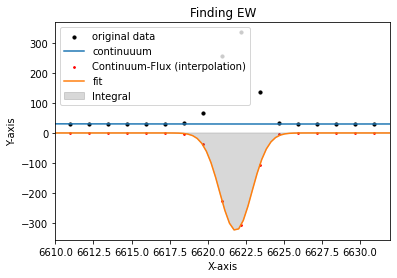

EW= -28.235566568045243  at (i,j)= 16 , 13


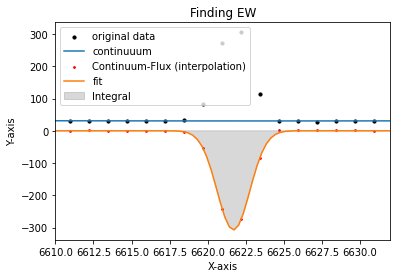

EW= -26.59878810752973  at (i,j)= 16 , 14


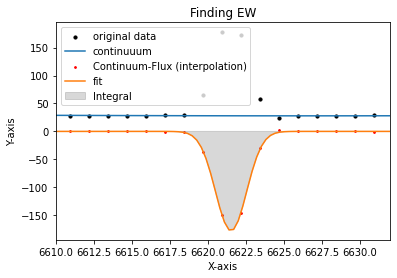

EW= -15.963012965355432  at (i,j)= 16 , 15


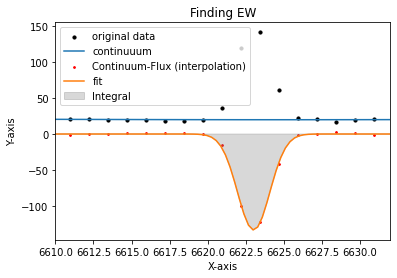

EW= -17.504287960592965  at (i,j)= 17 , 0


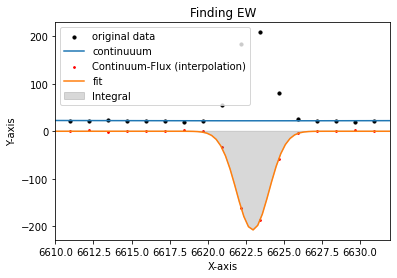

EW= -24.769151831672026  at (i,j)= 17 , 1


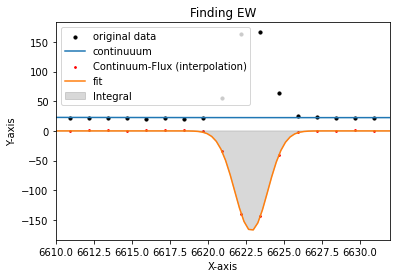

EW= -19.88308798819547  at (i,j)= 17 , 2


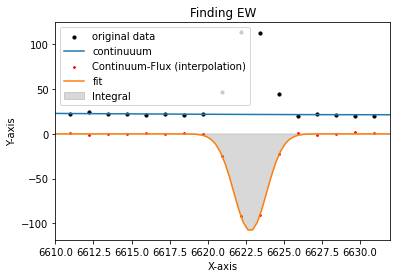

EW= -13.113960429176217  at (i,j)= 17 , 3


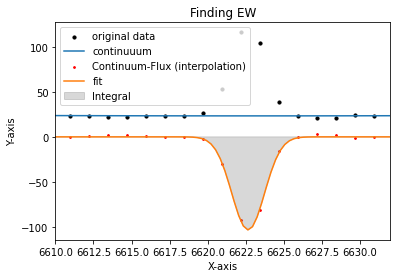

EW= -11.732741494602985  at (i,j)= 17 , 4


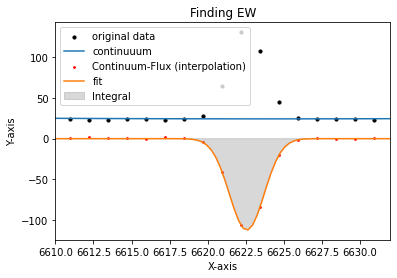

EW= -12.936818403309397  at (i,j)= 17 , 5


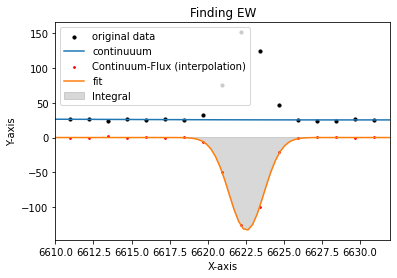

EW= -14.669180954997433  at (i,j)= 17 , 6


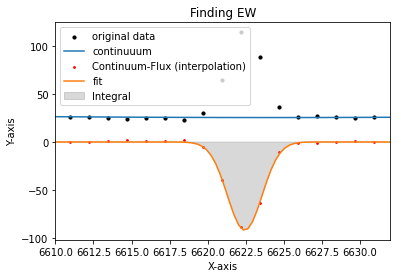

EW= -10.06796502281695  at (i,j)= 17 , 7


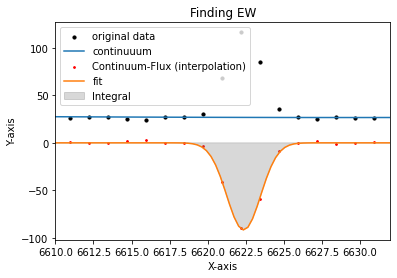

EW= -9.373197923307288  at (i,j)= 17 , 8


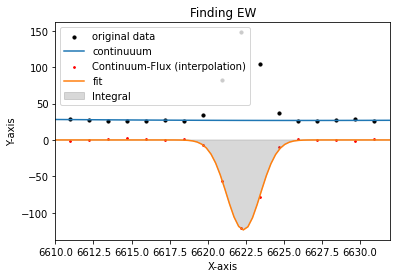

EW= -12.5143281099038  at (i,j)= 17 , 9


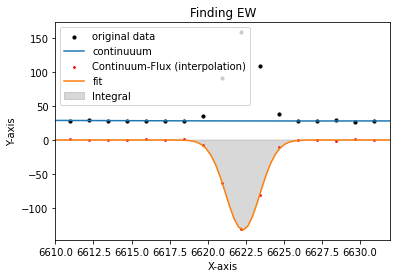

EW= -12.889762746454064  at (i,j)= 17 , 10


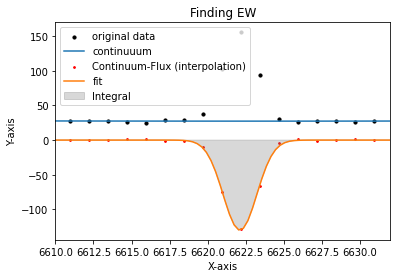

EW= -12.888616666131181  at (i,j)= 17 , 11


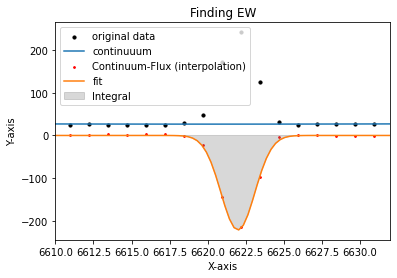

EW= -22.74388330307913  at (i,j)= 17 , 12


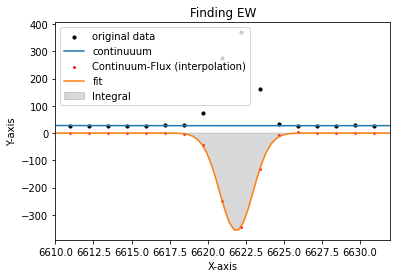

EW= -35.13164274916979  at (i,j)= 17 , 13


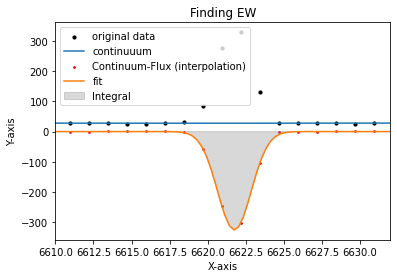

EW= -31.867925374189223  at (i,j)= 17 , 14


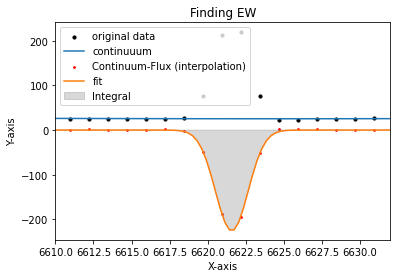

EW= -23.467398610028525  at (i,j)= 17 , 15


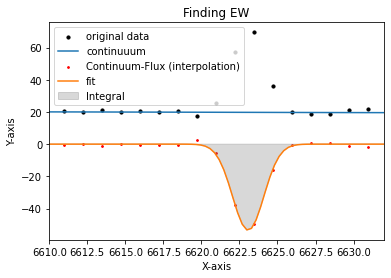

EW= -6.844221020064148  at (i,j)= 18 , 0


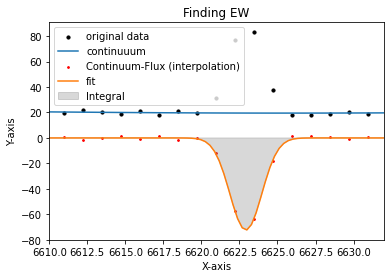

EW= -9.546293292191832  at (i,j)= 18 , 1


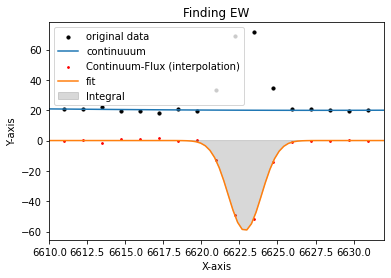

EW= -7.949995238194954  at (i,j)= 18 , 2


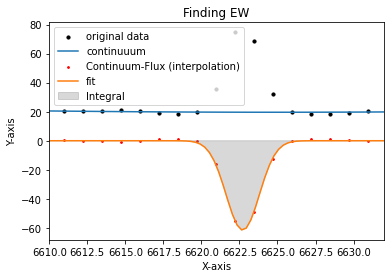

EW= -8.384063233286215  at (i,j)= 18 , 3


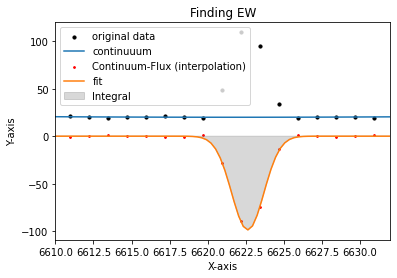

EW= -12.85215852973878  at (i,j)= 18 , 4


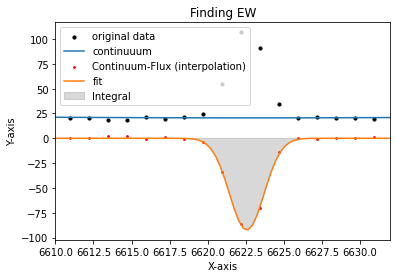

EW= -12.475657489503488  at (i,j)= 18 , 5


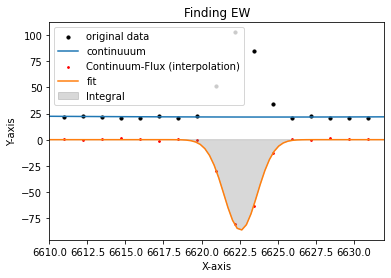

EW= -10.707395804377283  at (i,j)= 18 , 6


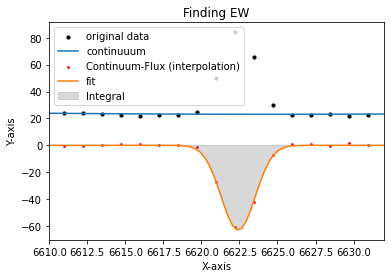

EW= -7.472733045031323  at (i,j)= 18 , 7


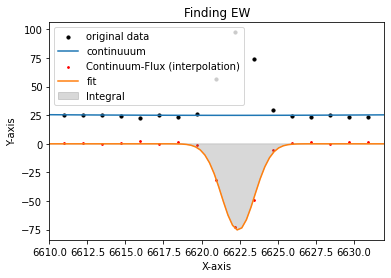

EW= -8.032072048406151  at (i,j)= 18 , 8


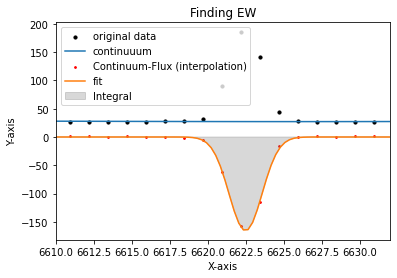

EW= -16.20169566215395  at (i,j)= 18 , 9


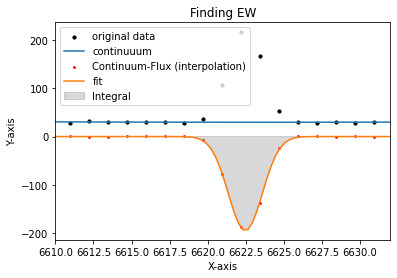

EW= -18.043593040849395  at (i,j)= 18 , 10


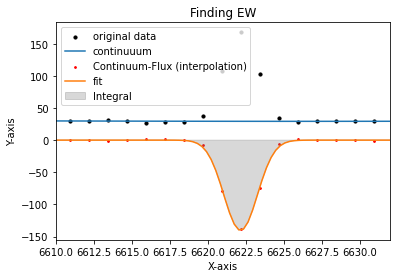

EW= -13.00107171043698  at (i,j)= 18 , 11


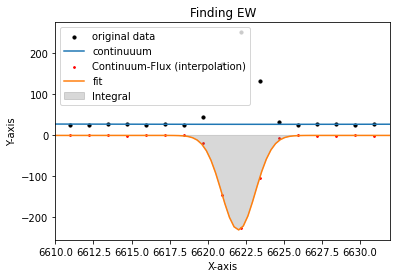

EW= -23.006108688690535  at (i,j)= 18 , 12


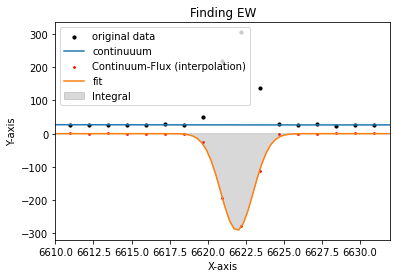

EW= -28.843510391130508  at (i,j)= 18 , 13


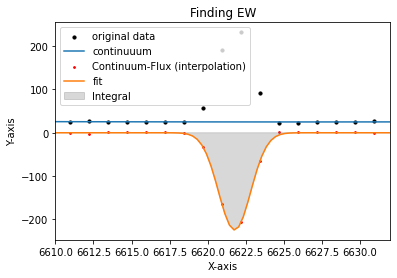

EW= -23.366152519331127  at (i,j)= 18 , 14


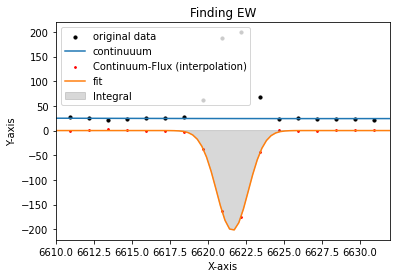

EW= -21.3414743427213  at (i,j)= 18 , 15


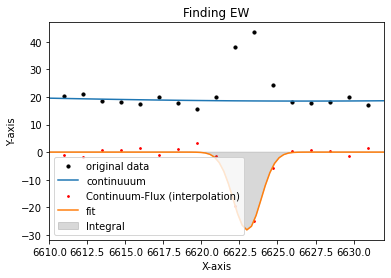

EW= -3.420739772359538  at (i,j)= 19 , 0


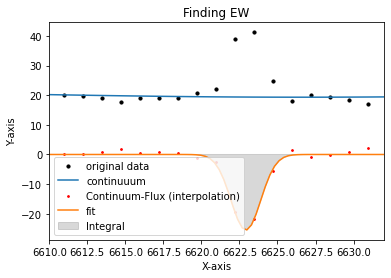

EW= -3.157345174007038  at (i,j)= 19 , 1


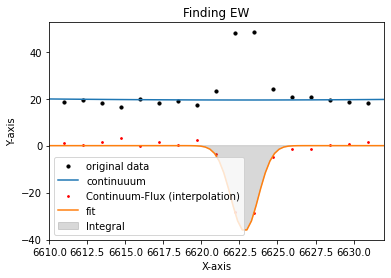

EW= -4.144551839021467  at (i,j)= 19 , 2


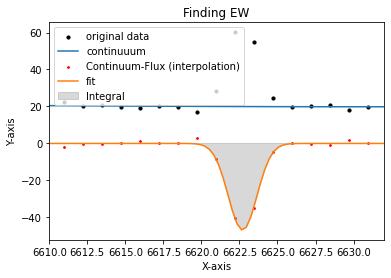

EW= -5.424243020386757  at (i,j)= 19 , 3


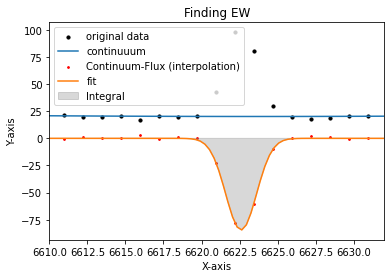

EW= -10.429569747751124  at (i,j)= 19 , 4


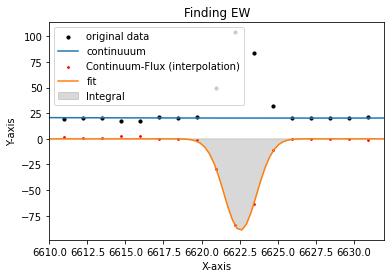

EW= -11.525031542738628  at (i,j)= 19 , 5


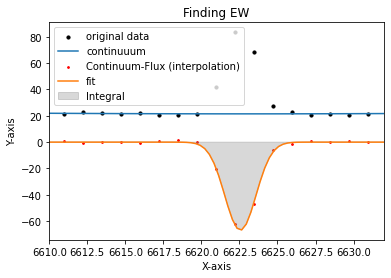

EW= -7.833501326943476  at (i,j)= 19 , 6


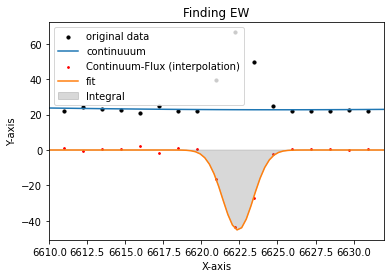

EW= -4.919886279031513  at (i,j)= 19 , 7


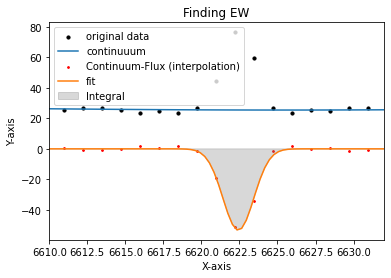

EW= -5.22022112033542  at (i,j)= 19 , 8


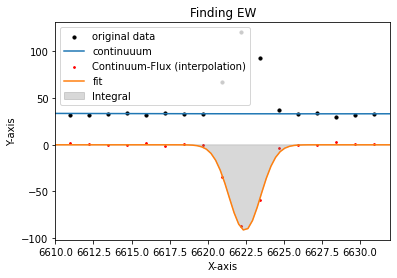

EW= -6.999445092166519  at (i,j)= 19 , 9


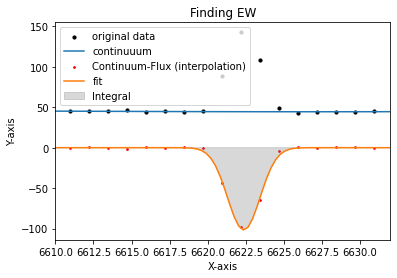

EW= -6.002983741945976  at (i,j)= 19 , 10


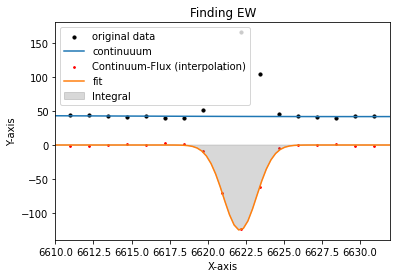

EW= -7.974720379878287  at (i,j)= 19 , 11


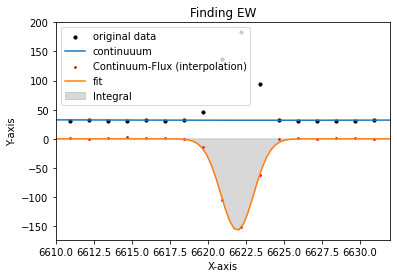

EW= -12.987561597378239  at (i,j)= 19 , 12


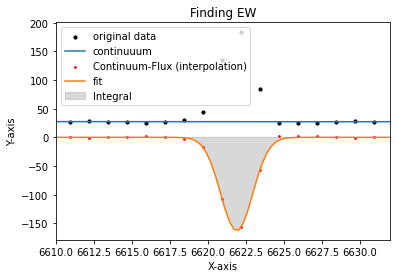

EW= -15.338083589478195  at (i,j)= 19 , 13


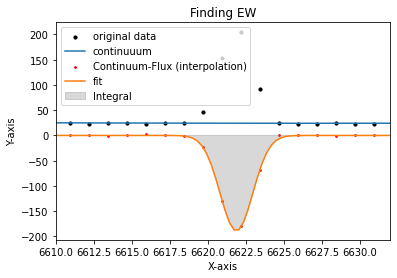

EW= -20.57487170361413  at (i,j)= 19 , 14


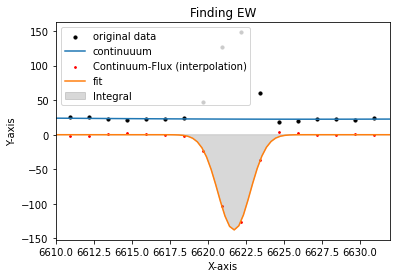

EW= -15.85865035065069  at (i,j)= 19 , 15


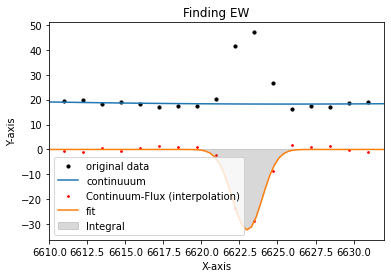

EW= -4.2746825488695475  at (i,j)= 20 , 0


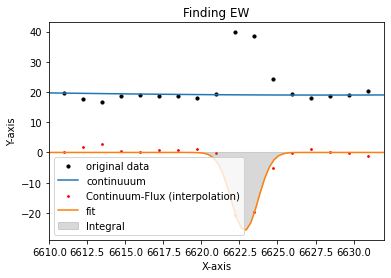

EW= -2.953139091654664  at (i,j)= 20 , 1


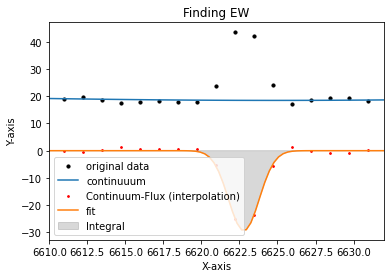

EW= -3.946498602576032  at (i,j)= 20 , 2


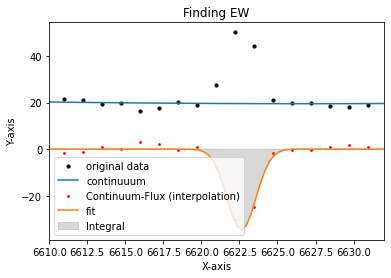

EW= -4.1233613140406105  at (i,j)= 20 , 3


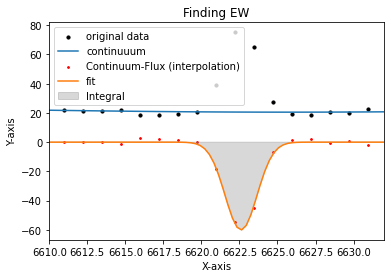

EW= -7.518816723226114  at (i,j)= 20 , 4


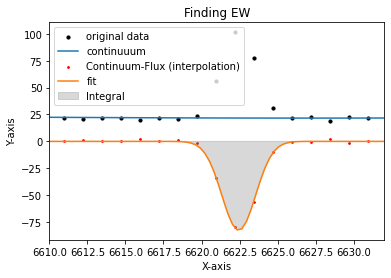

EW= -10.364478054777239  at (i,j)= 20 , 5


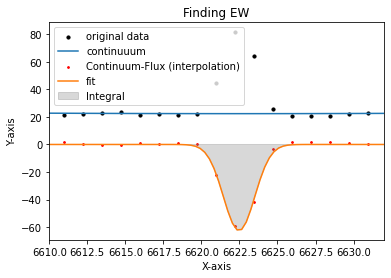

EW= -7.074539037605167  at (i,j)= 20 , 6


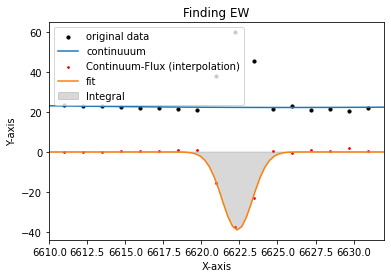

EW= -4.315540815017667  at (i,j)= 20 , 7


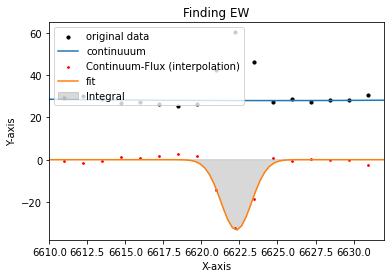

EW= -2.9254939714231516  at (i,j)= 20 , 8


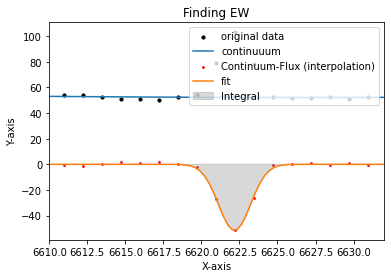

EW= -2.5585586304410097  at (i,j)= 20 , 9


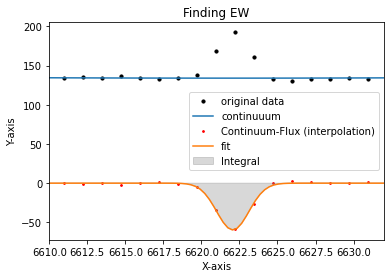

EW= -1.1579395510305024  at (i,j)= 20 , 10


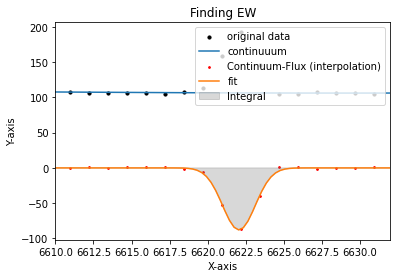

EW= -2.180625094521532  at (i,j)= 20 , 11


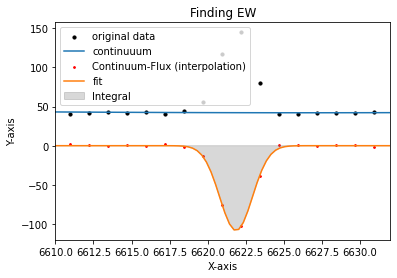

EW= -6.781103874844209  at (i,j)= 20 , 12


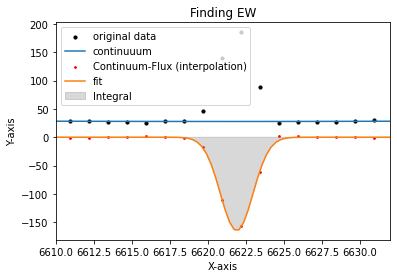

EW= -15.494842651476679  at (i,j)= 20 , 13


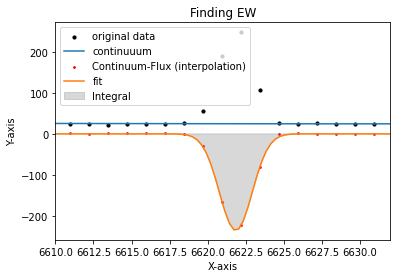

EW= -25.16717673267563  at (i,j)= 20 , 14


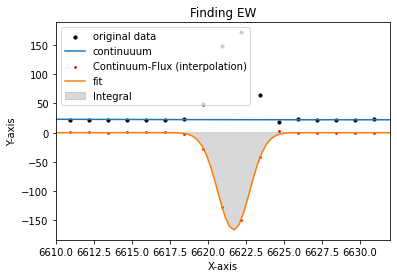

EW= -19.219921478485343  at (i,j)= 20 , 15


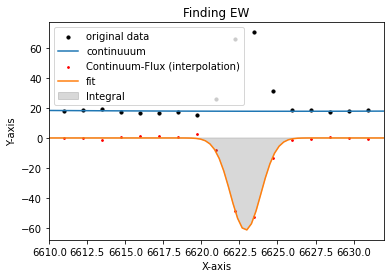

EW= -8.49281845603863  at (i,j)= 21 , 0


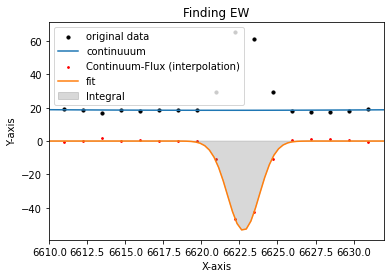

EW= -7.446148156857735  at (i,j)= 21 , 1


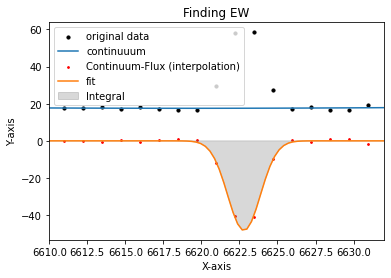

EW= -7.251639016280591  at (i,j)= 21 , 2


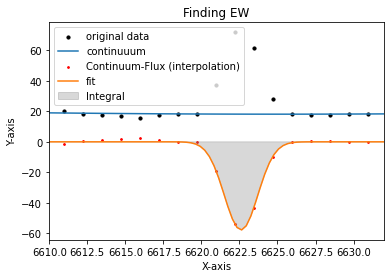

EW= -8.60748130759496  at (i,j)= 21 , 3


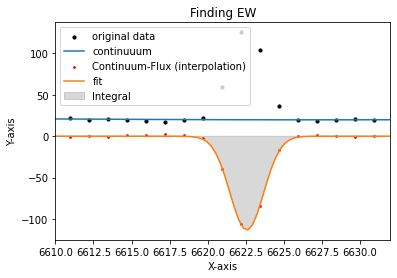

EW= -15.397817573186613  at (i,j)= 21 , 4


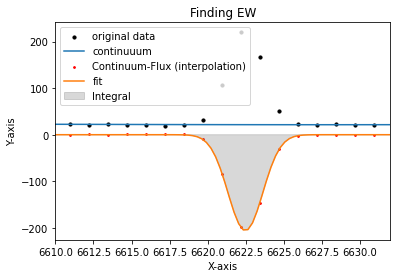

EW= -26.849042391315997  at (i,j)= 21 , 5


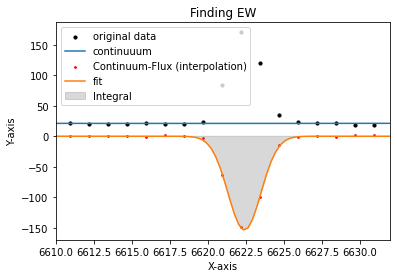

EW= -19.343601178810797  at (i,j)= 21 , 6


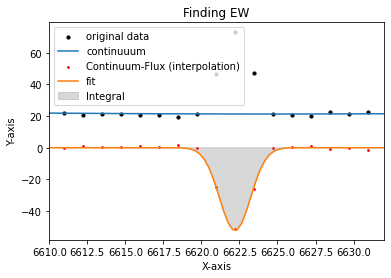

EW= -6.1364604631261965  at (i,j)= 21 , 7


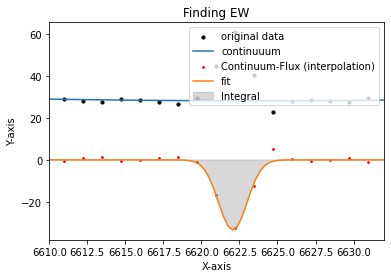

EW= -2.7274595275877616  at (i,j)= 21 , 8


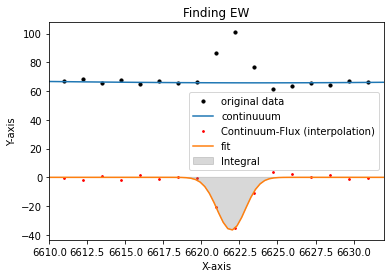

EW= -1.2730026346306087  at (i,j)= 21 , 9


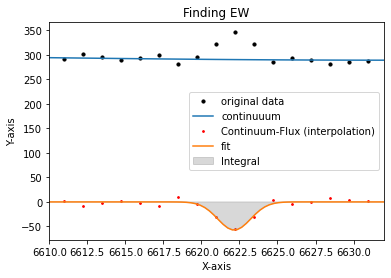

EW= -0.5244348372584421  at (i,j)= 21 , 10


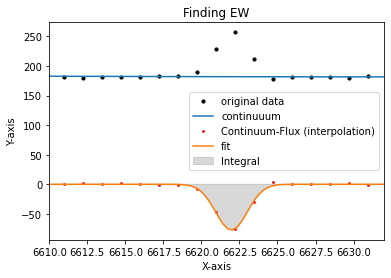

EW= -1.0818322342682323  at (i,j)= 21 , 11


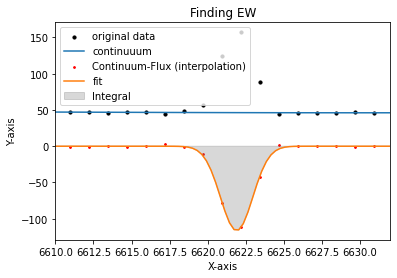

EW= -6.529784540116891  at (i,j)= 21 , 12


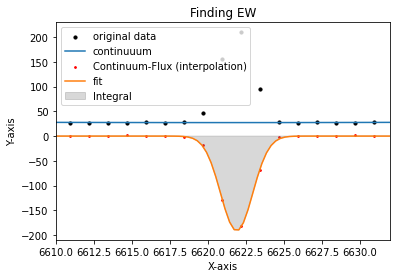

EW= -18.132561608557435  at (i,j)= 21 , 13


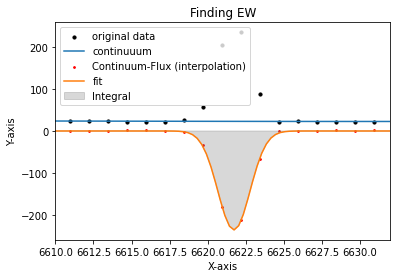

EW= -26.693186010330997  at (i,j)= 21 , 14


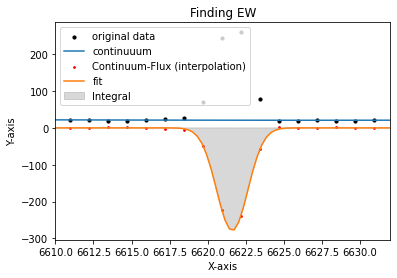

EW= -33.57382730080805  at (i,j)= 21 , 15


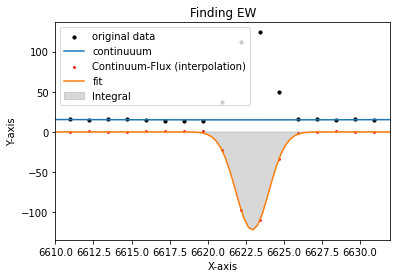

EW= -21.685654545812685  at (i,j)= 22 , 0


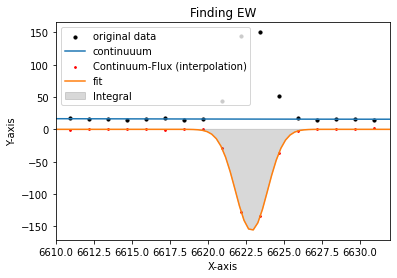

EW= -25.59569257812702  at (i,j)= 22 , 1


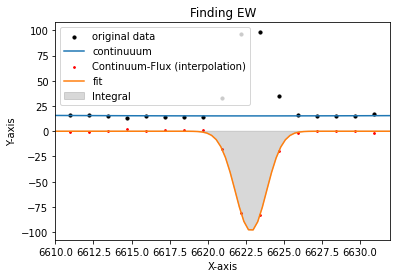

EW= -16.314260287907405  at (i,j)= 22 , 2


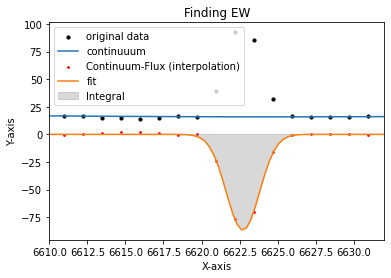

EW= -14.521179090442553  at (i,j)= 22 , 3


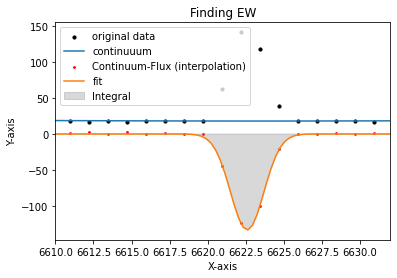

EW= -19.923001963968996  at (i,j)= 22 , 4


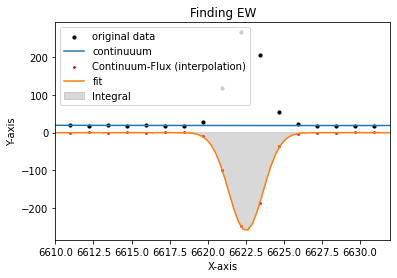

EW= -37.73383178845041  at (i,j)= 22 , 5


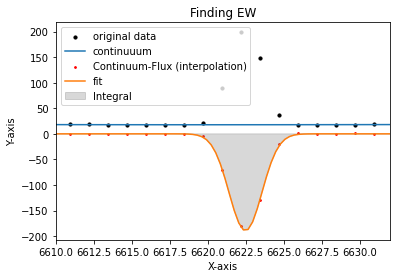

EW= -28.215163174653465  at (i,j)= 22 , 6


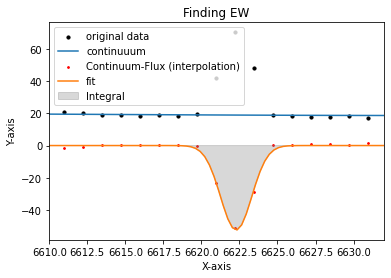

EW= -6.975770723643071  at (i,j)= 22 , 7


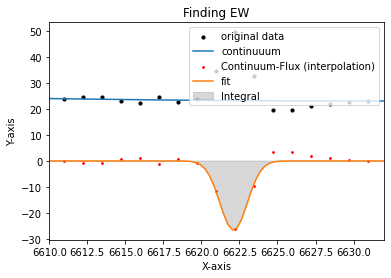

EW= -2.529762744868323  at (i,j)= 22 , 8


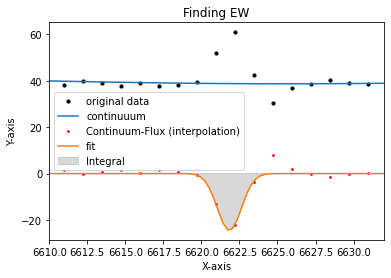

EW= -1.2350597132501193  at (i,j)= 22 , 9


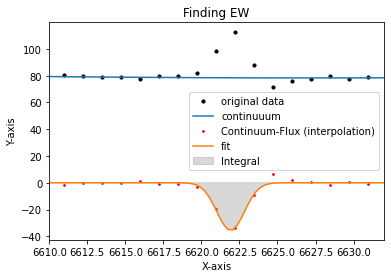

EW= -1.0130397904292152  at (i,j)= 22 , 10


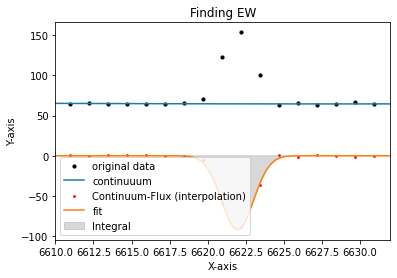

EW= -3.6750600534963414  at (i,j)= 22 , 11


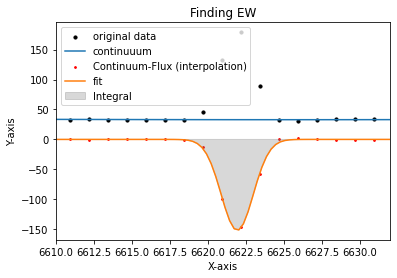

EW= -11.916052347220015  at (i,j)= 22 , 12


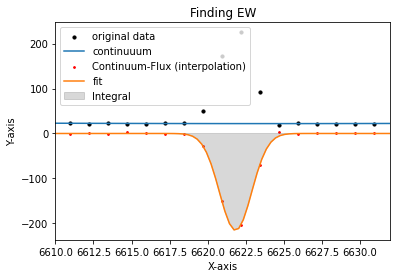

EW= -25.44698507768544  at (i,j)= 22 , 13


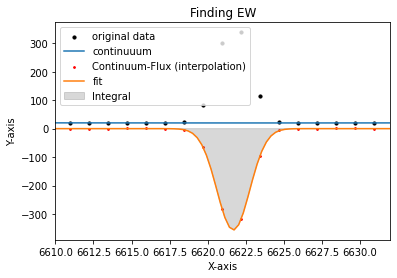

EW= -47.35394538525786  at (i,j)= 22 , 14


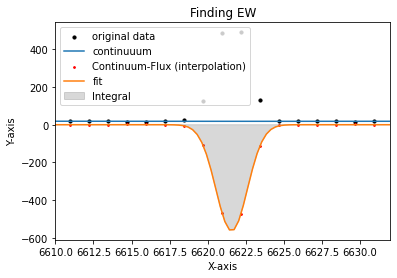

EW= -79.62156768592554  at (i,j)= 22 , 15


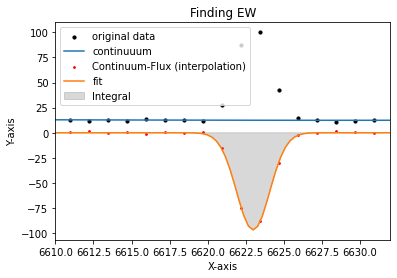

EW= -20.709709711971325  at (i,j)= 23 , 0


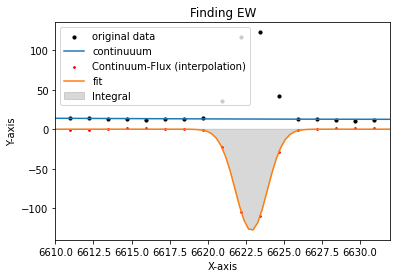

EW= -25.449660550933654  at (i,j)= 23 , 1


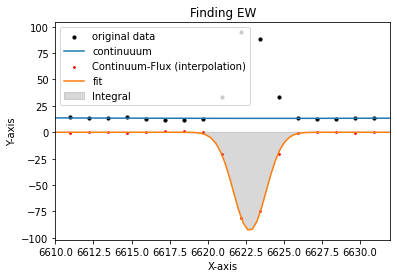

EW= -18.492421093600594  at (i,j)= 23 , 2


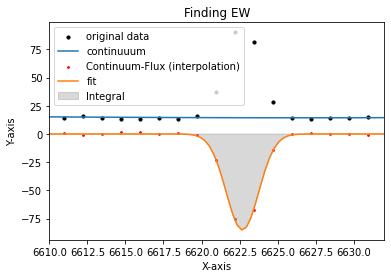

EW= -15.445778476894317  at (i,j)= 23 , 3


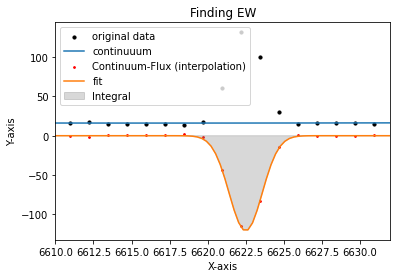

EW= -19.9663886978518  at (i,j)= 23 , 4


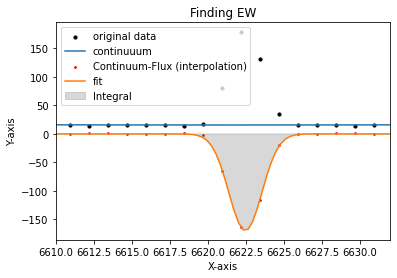

EW= -28.840332680295145  at (i,j)= 23 , 5


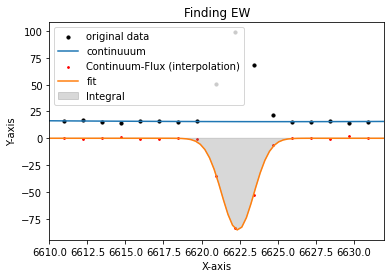

EW= -14.266451710013644  at (i,j)= 23 , 6


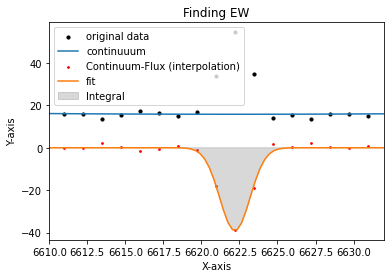

EW= -6.0449945207710964  at (i,j)= 23 , 7


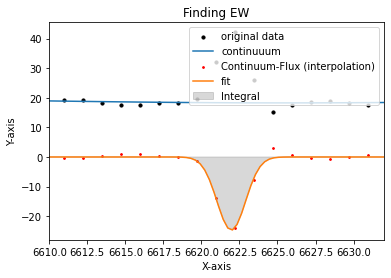

EW= -3.1143585793296995  at (i,j)= 23 , 8


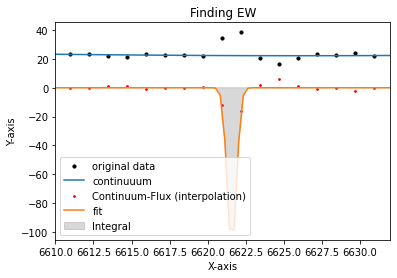

EW= -3.7058992822491486  at (i,j)= 23 , 9


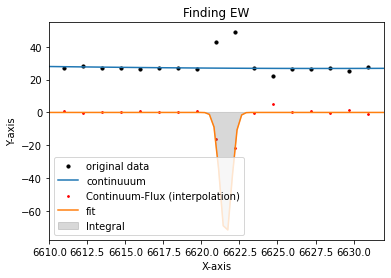

EW= -2.5924369466119126  at (i,j)= 23 , 10


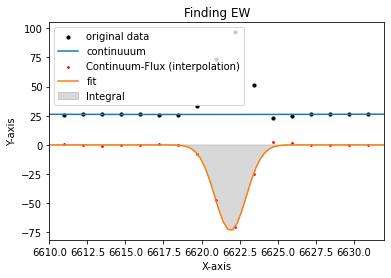

EW= -7.097057889512201  at (i,j)= 23 , 11


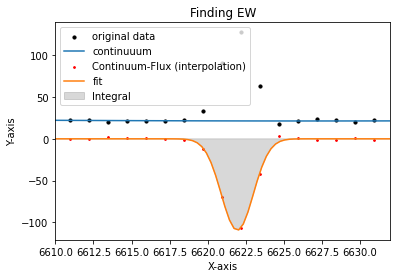

EW= -13.177861057352523  at (i,j)= 23 , 12


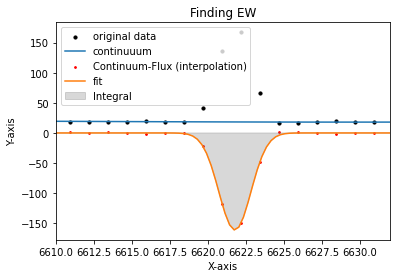

EW= -22.85883919250478  at (i,j)= 23 , 13


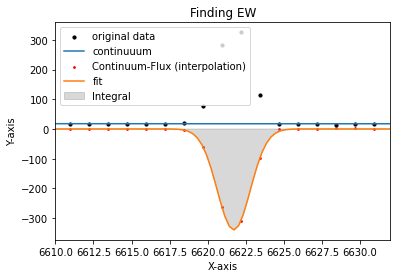

EW= -51.32679320242351  at (i,j)= 23 , 14


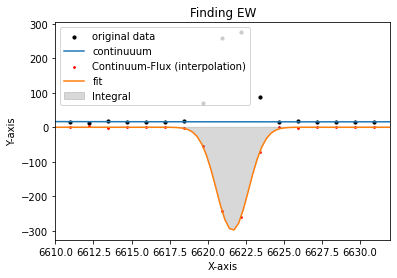

EW= -48.99554250447011  at (i,j)= 23 , 15


In [183]:
map=EW_map(binned_region,wave,halpha_obs)

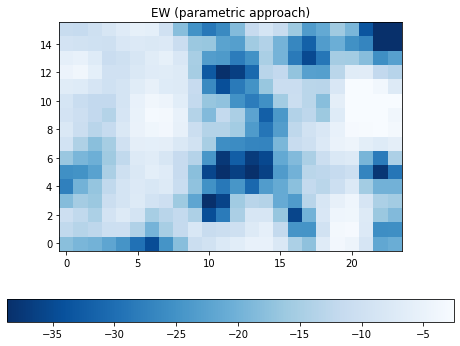

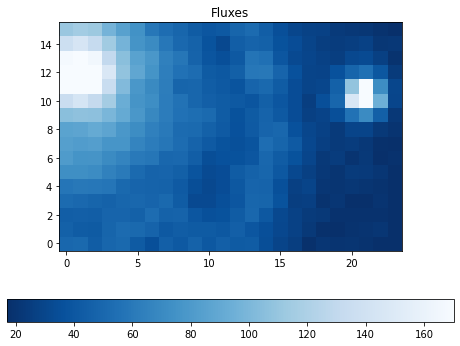

In [184]:
data= np.transpose(map)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("EW (parametric approach)")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

## EW through non parametric approach

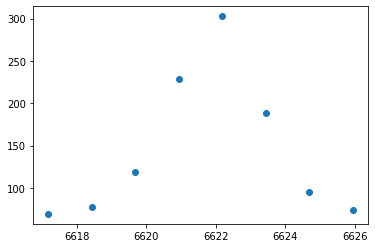

In [111]:
plt.scatter(x_original,y_original)

In [113]:
continuum_fit

poly1d([-3.14445749e-06,  8.34194609e-02, -8.29884800e+02,  3.66930005e+06,
       -6.08383464e+09])

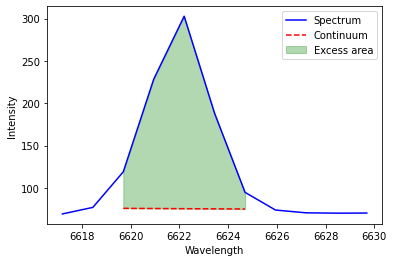

Integratal of area over continuum divided by continuum: -8.70


In [116]:
x_chopped,y_chopped=chop_data(wave,median_bulge,halpha_obs-40,halpha_obs+40)
x_original,y_original=chop_data(wave,median_bulge,halpha_obs-7,halpha_obs+7)

# Define peak region
peak_mask = (x_original >= bound1) & (x_original <= bound2)
wavelength_peak = x_original[peak_mask]
spectrum_peak = y_original[peak_mask]
            
# smooth data
y_smooth=smooth_spectra(y_chopped,kernel_size=3)
            
            
            
continuum_fit, x_continuum, y_continuum=continuum(x_chopped,y_smooth)
continuum_peak = continuum_fit(wavelength_peak)



# Compute the excess intensity above the continuum
excess_intensity = (continuum_peak-spectrum_peak)/continuum_peak

# Integrate the excess intensity (area over the continuum)
area_over_continuum = simps(excess_intensity, wavelength_peak)
#continuum_summed = simps(continuum_fit(wavelength_peak), wavelength_peak)


plt.plot(x_original, y_original, label="Spectrum", color="blue")
plt.plot(wavelength_peak, continuum_peak, label="Continuum", linestyle="dashed", color="red")
plt.fill_between(wavelength_peak, continuum_peak, spectrum_peak, alpha=0.3, color="green", label="Excess area")
plt.xlabel("Wavelength")
plt.ylabel("Intensity")
plt.legend()
plt.show()

print(f"Integral of area over continuum divided by continuum: {area_over_continuum:.2f}")


## EW through non parametric approach - automatized

In [134]:
def EW_map_non_parametric(cube_region,wave,central_wavelength,kernel_size=3,plots=False):

    x_len=len(cube_region[0][0])
    y_len=len(cube_region[0])
    
    map=np.zeros((x_len, y_len))
    
    b1=central_wavelength-3
    b2=central_wavelength+3
    
    for i in range(0,x_len):
        for j in range(0,y_len):
            
            spec=cube_region[:,j,i]
            
            x_chopped,y_chopped=chop_data(wave,spec,central_wavelength-20,central_wavelength+20)

            # smooth data
            y_smooth=smooth_spectra(y_chopped,kernel_size)
            
            
            x,y=chop_data(x_chopped, y_smooth,central_wavelength-5,central_wavelength+5)        
            
            
            peak_mask = (x >= b1) & (x <= b2)
            wavelength_peak = x[peak_mask]
            spectrum_peak = y[peak_mask]
            
            
            # Compute the excess intensity above the continuum            
            aux=continuum(x_chopped,y_smooth)
            if(aux==None): # skipping the i,j pixel in case we cannot find the continuum
                map[i,j]=np.nan
                continue 
            else:
                continuum_fit=aux[0]
                x_continuum=aux[1]
                y_continuum=aux[2]
                
            continuum_peak = continuum_fit(wavelength_peak)
            excess_intensity = (continuum_peak-spectrum_peak)/continuum_peak
            
            

            # Integrate the excess intensity (area over the continuum)
            area_over_continuum = simps(excess_intensity, wavelength_peak)
            #continuum_summed = simps(continuum_fit(wavelength_peak), wavelength_peak)
            
            
            if plots==True:
                plt.plot(x, y, label="spectrum", color="blue")
                plt.plot(wavelength_peak,continuum_peak, label="Continuum", linestyle="dashed", color="red")
                plt.fill_between(wavelength_peak, continuum_peak, spectrum_peak, alpha=0.3, color="green", label="Excess area")
                plt.xlabel("Wavelength")
                plt.ylabel("Intensity")
                plt.legend()
                plt.show()

            
            ew=area_over_continuum;
            print(f"Integratal of area over continuum divided by continuum: {area_over_continuum:.2f}")
            
            map[i,j]=ew
    return map

Integratal of area over continuum divided by continuum: -16.83
Integratal of area over continuum divided by continuum: -11.55
Integratal of area over continuum divided by continuum: -9.61
Integratal of area over continuum divided by continuum: -16.36
Integratal of area over continuum divided by continuum: -26.39
Integratal of area over continuum divided by continuum: -25.28
Integratal of area over continuum divided by continuum: -15.59
Integratal of area over continuum divided by continuum: -9.05
Integratal of area over continuum divided by continuum: -7.73


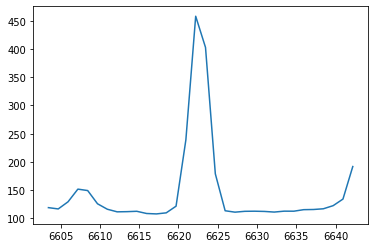

Couldn't find continuum


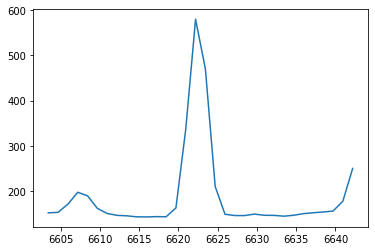

Couldn't find continuum


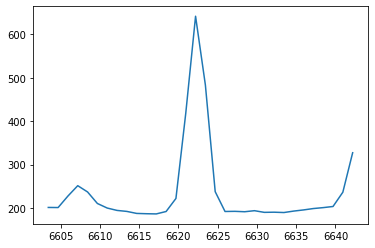

Couldn't find continuum


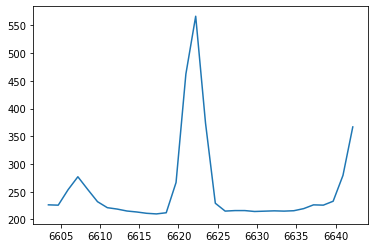

Couldn't find continuum


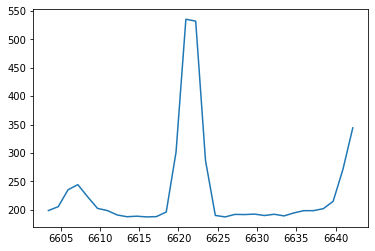

Couldn't find continuum


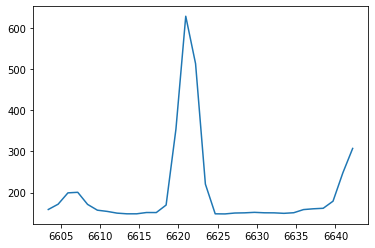

Couldn't find continuum


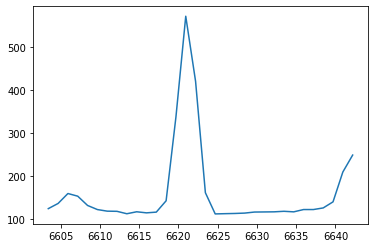

Couldn't find continuum
Integratal of area over continuum divided by continuum: -17.70
Integratal of area over continuum divided by continuum: -12.74
Integratal of area over continuum divided by continuum: -11.58
Integratal of area over continuum divided by continuum: -14.00
Integratal of area over continuum divided by continuum: -17.98
Integratal of area over continuum divided by continuum: -25.09
Integratal of area over continuum divided by continuum: -19.36
Integratal of area over continuum divided by continuum: -14.10
Integratal of area over continuum divided by continuum: -10.25


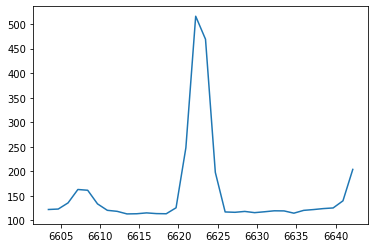

Couldn't find continuum


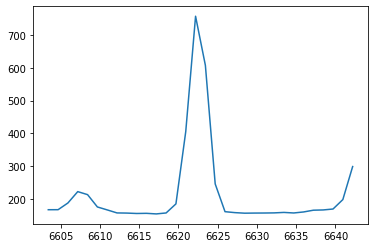

Couldn't find continuum


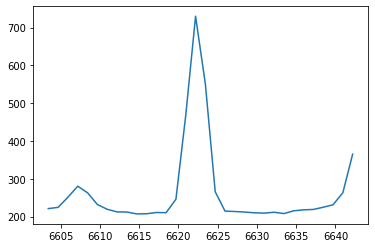

Couldn't find continuum


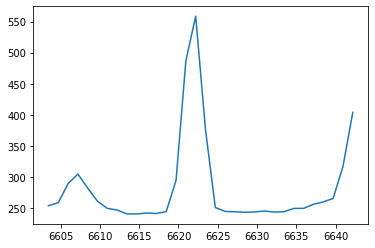

Couldn't find continuum


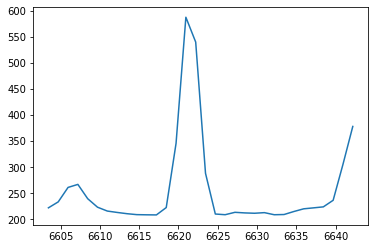

Couldn't find continuum


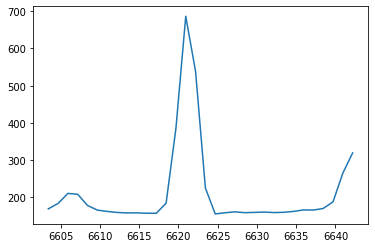

Couldn't find continuum


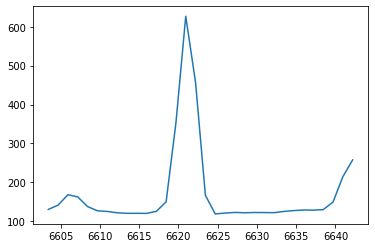

Couldn't find continuum
Integratal of area over continuum divided by continuum: -17.26
Integratal of area over continuum divided by continuum: -11.95
Integratal of area over continuum divided by continuum: -13.50
Integratal of area over continuum divided by continuum: -14.75
Integratal of area over continuum divided by continuum: -15.08
Integratal of area over continuum divided by continuum: -21.93
Integratal of area over continuum divided by continuum: -20.17
Integratal of area over continuum divided by continuum: -17.81
Integratal of area over continuum divided by continuum: -13.11


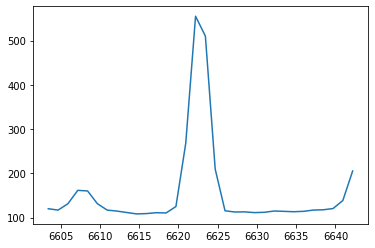

Couldn't find continuum


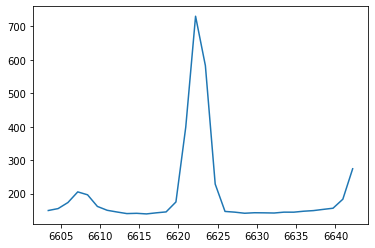

Couldn't find continuum


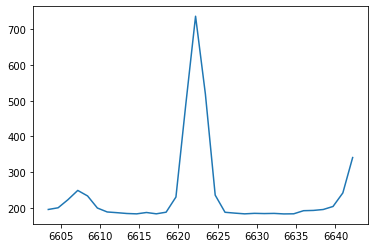

Couldn't find continuum


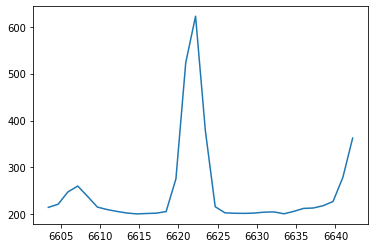

Couldn't find continuum


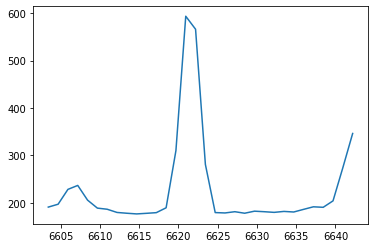

Couldn't find continuum


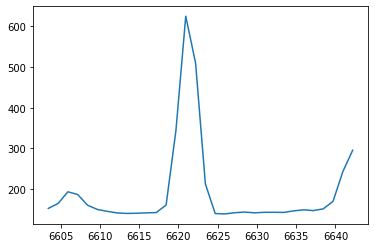

Couldn't find continuum


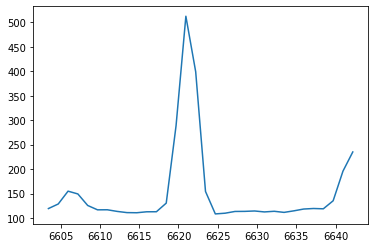

Couldn't find continuum
Integratal of area over continuum divided by continuum: -18.79
Integratal of area over continuum divided by continuum: -9.93
Integratal of area over continuum divided by continuum: -8.65
Integratal of area over continuum divided by continuum: -9.89
Integratal of area over continuum divided by continuum: -10.93
Integratal of area over continuum divided by continuum: -14.36
Integratal of area over continuum divided by continuum: -15.79
Integratal of area over continuum divided by continuum: -14.44
Integratal of area over continuum divided by continuum: -11.04


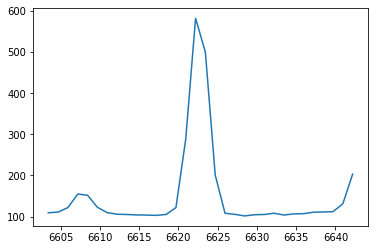

Couldn't find continuum


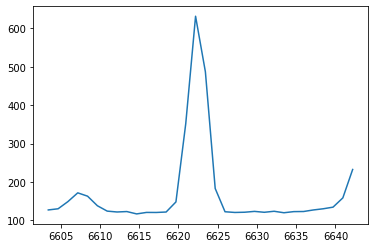

Couldn't find continuum


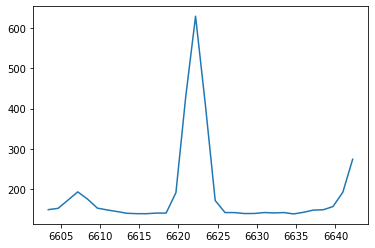

Couldn't find continuum


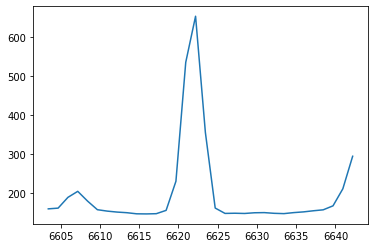

Couldn't find continuum


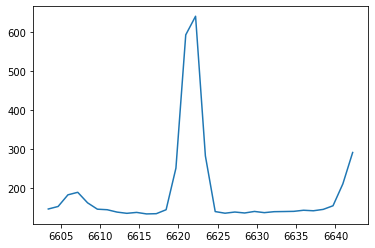

Couldn't find continuum


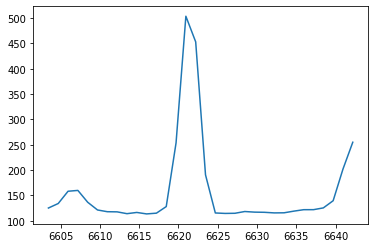

Couldn't find continuum
Integratal of area over continuum divided by continuum: -5.54
Integratal of area over continuum divided by continuum: -21.05
Integratal of area over continuum divided by continuum: -9.68
Integratal of area over continuum divided by continuum: -7.02
Integratal of area over continuum divided by continuum: -8.52
Integratal of area over continuum divided by continuum: -8.60
Integratal of area over continuum divided by continuum: -9.21
Integratal of area over continuum divided by continuum: -13.14
Integratal of area over continuum divided by continuum: -10.23
Integratal of area over continuum divided by continuum: -7.81
Integratal of area over continuum divided by continuum: -8.06
Integratal of area over continuum divided by continuum: -8.03


/tmp/ipykernel_93583/4244713290.py:23: RankWarning: Polyfit may be poorly conditioned
  p_coeffs = np.polyfit(x_continuum, y_continuum, 4)


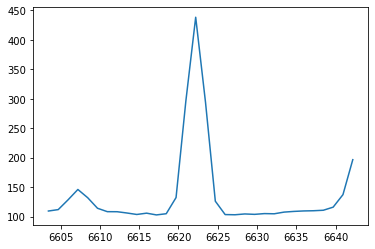

Couldn't find continuum


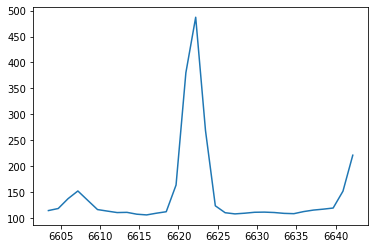

Couldn't find continuum


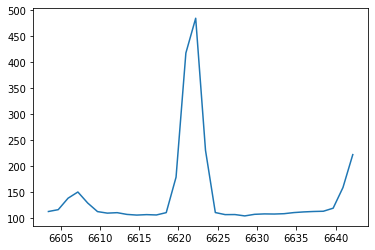

Couldn't find continuum
Integratal of area over continuum divided by continuum: -5.78
Integratal of area over continuum divided by continuum: -4.35
Integratal of area over continuum divided by continuum: -24.99
Integratal of area over continuum divided by continuum: -12.89
Integratal of area over continuum divided by continuum: -8.66
Integratal of area over continuum divided by continuum: -5.52
Integratal of area over continuum divided by continuum: -5.59
Integratal of area over continuum divided by continuum: -5.78
Integratal of area over continuum divided by continuum: -6.53
Integratal of area over continuum divided by continuum: -5.48
Integratal of area over continuum divided by continuum: -4.79
Integratal of area over continuum divided by continuum: -4.87
Integratal of area over continuum divided by continuum: -4.59
Integratal of area over continuum divided by continuum: -5.79
Integratal of area over continuum divided by continuum: -6.69
Integratal of area over continuum divided by

Integratal of area over continuum divided by continuum: -18.19
Integratal of area over continuum divided by continuum: -21.84
Integratal of area over continuum divided by continuum: -11.07
Integratal of area over continuum divided by continuum: -8.82
Integratal of area over continuum divided by continuum: -1.65
Integratal of area over continuum divided by continuum: -1.47
Integratal of area over continuum divided by continuum: -1.83
Integratal of area over continuum divided by continuum: -2.17
Integratal of area over continuum divided by continuum: -3.06
Integratal of area over continuum divided by continuum: -4.95
Integratal of area over continuum divided by continuum: -2.52
Integratal of area over continuum divided by continuum: -1.84
Integratal of area over continuum divided by continuum: -1.82
Integratal of area over continuum divided by continuum: -3.57
Integratal of area over continuum divided by continuum: -4.13
Integratal of area over continuum divided by continuum: -6.43
Integ

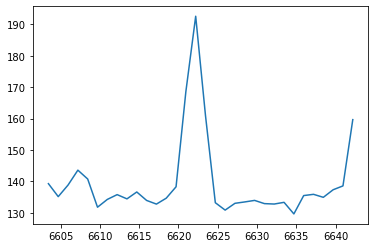

Couldn't find continuum


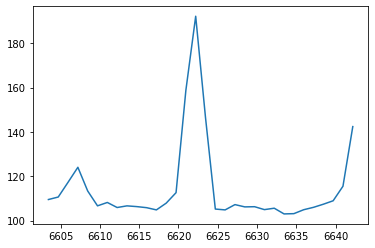

Couldn't find continuum
Integratal of area over continuum divided by continuum: -3.95
Integratal of area over continuum divided by continuum: -7.62
Integratal of area over continuum divided by continuum: -15.39
Integratal of area over continuum divided by continuum: -8.62
Integratal of area over continuum divided by continuum: -2.84
Integratal of area over continuum divided by continuum: -2.62
Integratal of area over continuum divided by continuum: -2.48
Integratal of area over continuum divided by continuum: -2.69
Integratal of area over continuum divided by continuum: -9.38
Integratal of area over continuum divided by continuum: -18.48
Integratal of area over continuum divided by continuum: -10.26
Integratal of area over continuum divided by continuum: -1.97
Integratal of area over continuum divided by continuum: -0.95
Integratal of area over continuum divided by continuum: -0.76


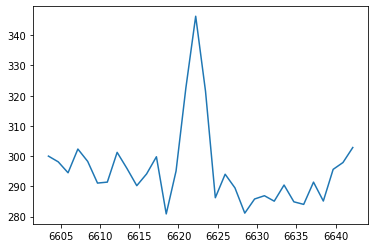

Couldn't find continuum


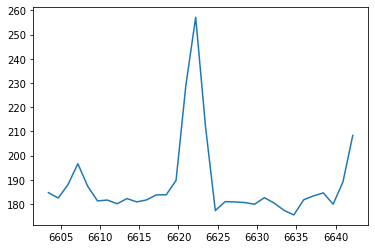

Couldn't find continuum
Integratal of area over continuum divided by continuum: -3.91
Integratal of area over continuum divided by continuum: -8.62
Integratal of area over continuum divided by continuum: -11.63
Integratal of area over continuum divided by continuum: -13.30
Integratal of area over continuum divided by continuum: -13.10
Integratal of area over continuum divided by continuum: -14.76
Integratal of area over continuum divided by continuum: -3.83
Integratal of area over continuum divided by continuum: -3.46
Integratal of area over continuum divided by continuum: -11.31
Integratal of area over continuum divided by continuum: -24.09
Integratal of area over continuum divided by continuum: -13.36
Integratal of area over continuum divided by continuum: -2.15
Integratal of area over continuum divided by continuum: -1.04
Integratal of area over continuum divided by continuum: -0.37
Integratal of area over continuum divided by continuum: -0.56
Integratal of area over continuum divid

In [135]:
map_NP=EW_map_non_parametric(binned_region,wave,halpha_obs,kernel_size=3,plots=False)

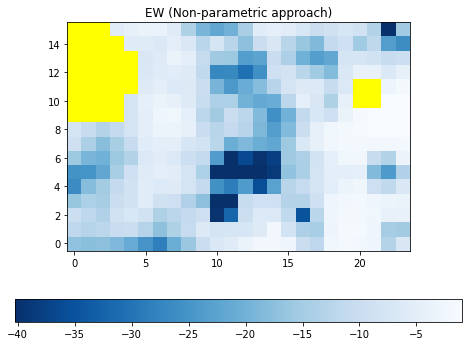

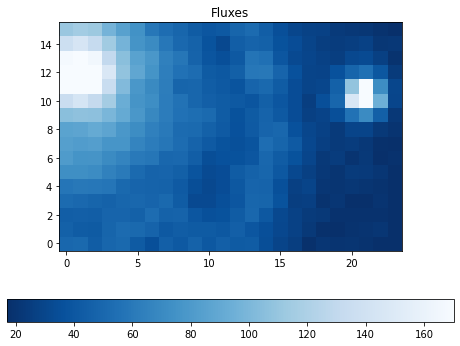

In [136]:
data= np.transpose(map_NP)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("EW (Non-parametric approach)")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

In [152]:
map_diff=abs(map_NP-map)

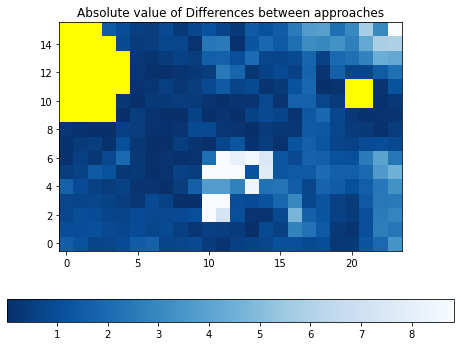

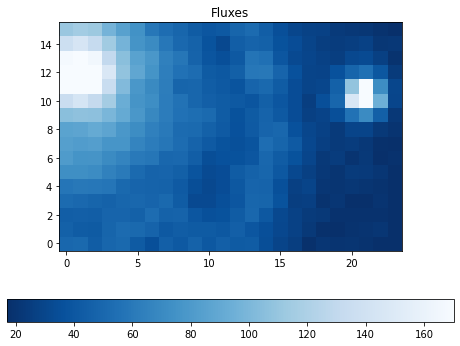

In [154]:
data= np.transpose(map_diff)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Absolute value of Differences between approaches")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

## Voronoi binning

goal: reach a chosen constant S/N per bin

I will choose noise to be a constant, the standard deviation of the pixel values divided by 50.

In [25]:
header;


selection=findWavelengths(wave, 5000)
selection[1]
cube[selection[1]]

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype='>f4')

In [24]:
len(final_x)

NameError: name 'final_x' is not defined

what should I use for the parameter pixelsize? Do i knwo the pixel scale of the cubes?

In [ ]:
from vorbin.voronoi_2d_binning import voronoi_2d_binning

data=cube[selection[1]]
x_len=len(data)
y_len=len(data[0])

#creating arrays of grid x_positions and y_positions

x=range(0,x_len)
y=range(0,y_len)
final_x=[]
final_y=[]
final_signal=[]
j=0
for yy in y:
    i=0
    for xx in x:
        i+=1
        if i%100==0 & j%100==0:
            final_x.append(xx)
            final_y.append(yy)
            final_signal.append(data[xx,yy])
    j+=1
        


target_sn = 10 #whats a good target S/N?

final_x=np.array(final_x)
final_y=np.array(final_y)
final_signal=np.array(final_signal)

# Create a mask that is True where the values are not NaN
mask = ~np.isnan(final_x) & ~np.isnan(final_y) & ~np.isnan(final_signal)

# Apply the mask to filter out NaN values
#print(final_x, final_y, final_signal)2
final_x = final_x[mask]
final_y = final_y[mask]
final_signal = final_signal[mask]

# Print out the filtered arrays to check
#print(final_x, final_y, final_signal)


std_dev=np.nanstd(data)
noise = np.full(shape=len(final_signal),fill_value=std_dev/50)

# Compute Voronoi bins
out=voronoi_2d_binning(final_x, final_y, final_signal, noise, target_sn, plot=True,pixelsize=1)

plt.show();

## Spectra at Hα

In [240]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

#plot_image(cube[index],wavelen,index,'Blues_r')


data=cube[index]

In [241]:
from astropy.stats import sigma_clipped_stats,gaussian_sigma_to_fwhm

from photutils import DAOStarFinder

mean, median, std = sigma_clipped_stats(data, sigma=5.0,maxiters=5) 
print((mean, median, std))

daofind = DAOStarFinder(fwhm=50, threshold=10.*std)

sources = daofind(data)

print("     Found %i stars in image " %len(sources))

(39.827423, 13.7210865, 63.754784)
     Found 6 stars in image 


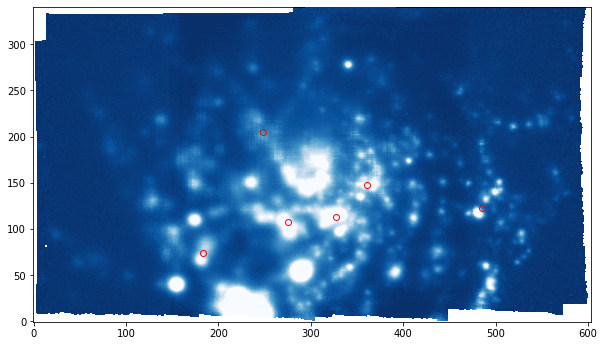

In [242]:

lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(10, 8))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
        
        
plt.plot(sources["xcentroid"],sources["ycentroid"],'or',mfc='none');

In [245]:
#defining (x,y) where we want to observe the spectra

i_brightest=np.argsort(sources['flux'])[0]

x_pos=int(sources[i_brightest][1])
y_pos=int(sources[i_brightest][2])

plotting spectra

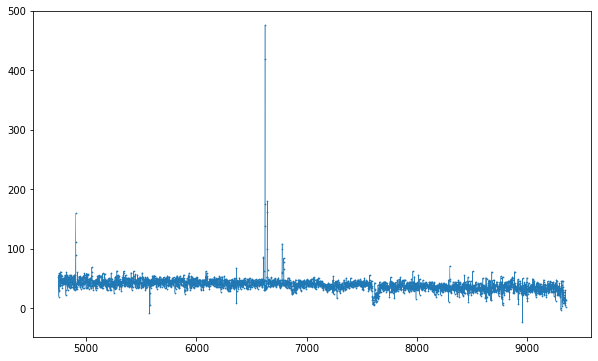

In [246]:
specdata=cube[:,y_pos,x_pos]

plt.figure(figsize=(10,6))

plt.plot(wave,specdata,linewidth=0.5,alpha=0.95)
plt.scatter(wave,specdata,s=0.5)

Text(0.5, 1.0, 'Zoom in Halpha emission region')

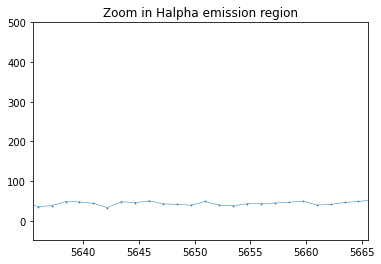

In [253]:
plt.plot(wave,specdata,linewidth=0.5,alpha=0.95)
plt.scatter(wave,specdata,s=0.5)

plt.xlim(halpha_obs-15,halpha_obs+15)
#plt.ylim(-20,90)
plt.title("Zoom in Halpha emission region")

fitting a Gaussian

In [64]:
bound1=int(findWavelengths(wave, 6618)[1])
bound2=int(findWavelengths(wave, 6625)[1])

In [66]:
x = wave[bound1:bound2]
y = specdata[bound1:bound2]

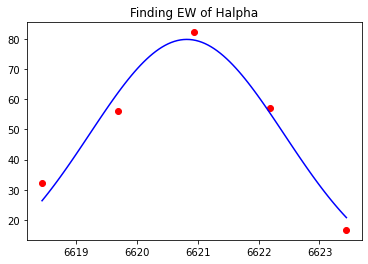

Fitted Amplitude (A): 79.7570857754474
Fitted Mean (mu): 6620.82077366716
Fitted Standard Deviation (sigma): 1.5989482179390269


In [67]:
initial_guess = [max(y), x[np.argmax(y)], 1]

params, covariance = curve_fit(gaussian, x, y, p0=initial_guess)
A_fit, mu_fit, sigma_fit = params


x_fit = np.linspace(min(x), max(x), 100)
y_fit = gaussian(x_fit, params[0], params[1], params[2])

plt.scatter(x, y, label="Data", color="red")
plt.plot(x_fit, y_fit, label="Gaussian Fit", color="blue")

plt.title("Finding EW of Halpha")
plt.show()


# Print fitted parameters
print(f"Fitted Amplitude (A): {A_fit}")
print(f"Fitted Mean (mu): {mu_fit}")
print(f"Fitted Standard Deviation (sigma): {sigma_fit}")

Integral using Simpson's rule: 281.6268


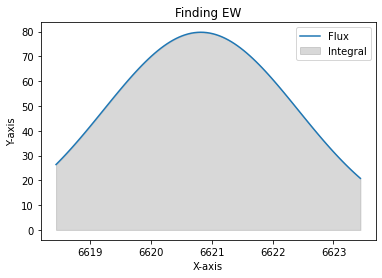

In [77]:

from scipy.integrate import simps

x = np.linspace(x_fit[0],x_fit[len(x_fit)-1], 100)  

# Compute the integral using Simpson's rule
integral_simps = simps(y_fit, x)

print(f"Integral using Simpson's rule: {integral_simps:.4f}")

# Plot the curve
plt.plot(x, y_fit, label="Flux")
plt.fill_between(x, y_fit, alpha=0.3, color='gray', label="Integral")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.title("Finding EW")
plt.show()


## Using Specutils

In [79]:
#from astropy.io import fits

from astropy import units as u

from astropy.visualization import quantity_support

quantity_support()  # for getting units on the axes below  

<astropy.visualization.units.quantity_support.<locals>.MplQuantityConverter at 0x7f656aa54e80>

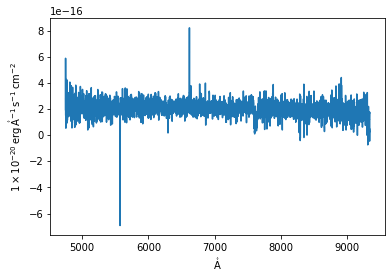

In [80]:
from specutils import Spectrum1D

lamb = wave * u.AA 

flux = specdata * 10**-17 * u.Unit(str(header["BUNIT"])) #taking the units from the header of the cube

spec = Spectrum1D(spectral_axis=lamb, flux=flux)

f, ax = plt.subplots()  

ax.step(spec.spectral_axis, spec.flux) 
#ax.set_xlim(halpha_obs-15,halpha_obs+15)

Calculating SNR of the spectra

In [81]:
from specutils.analysis import snr_derived

snr_derived(spec)

<Quantity 4.432747>

In [82]:
import warnings

from specutils.fitting import fit_generic_continuum

with warnings.catch_warnings():  # Ignore warnings

    warnings.simplefilter('ignore')

    #normalizing by continuum estimate
    cont_norm_spec = spec / fit_generic_continuum(spec)(spec.spectral_axis) 

In [130]:
fit_generic_continuum.param_names

AttributeError: 'function' object has no attribute 'param_names'

ESTE ajuste está onde? fit_generic_continuum

(6598.263076399999, 6648.263076399999)

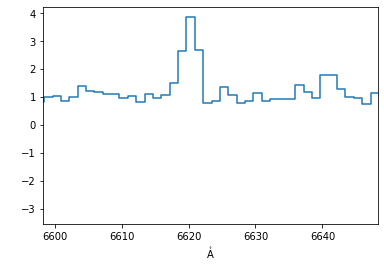

In [83]:
f, ax = plt.subplots()  

ax.step(cont_norm_spec.wavelength, cont_norm_spec.flux)  

ax.set_xlim((halpha_obs-25)/10 * u.nm,(halpha_obs+25)/10 * u.nm)  

In [84]:
from specutils import SpectralRegion

from specutils.analysis import equivalent_width

equivalent_width(cont_norm_spec, regions=SpectralRegion((halpha_obs-25)/10 * u.nm,(halpha_obs+25)/10 * u.nm))

<Quantity -11.53433117 Angstrom>

### Slicing a spectra into a particular region of interest

In [85]:
from specutils.manipulation import spectral_slab

ss = spectral_slab(cont_norm_spec, 5000.*u.AA, 5003.*u.AA)
ss

<Spectrum1D(flux=<Quantity [1.0896934 , 0.89806395]> (shape=(2,), mean=0.99388); spectral_axis=<SpectralAxis 
   (observer to target:
      radial_velocity=0.0 km / s
      redshift=0.0)
  [5000.94238281 5002.19238281] Angstrom> (length=2))>

### Calculating Moments

In [86]:
from specutils.analysis import moment

m = moment(spec, order=1) 

m.shape  


print(m)

6953.192735554875 Angstrom


## Line Finding

In [87]:
cont_norm_spec; #continuum normalized spectra

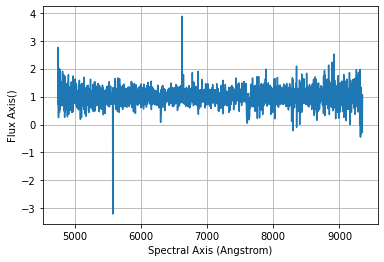

In [88]:
plt.plot(cont_norm_spec.spectral_axis, cont_norm_spec.flux) 

plt.xlabel('Spectral Axis ({})'.format(cont_norm_spec.spectral_axis.unit)) 

plt.ylabel('Flux Axis({})'.format(cont_norm_spec.flux.unit)) 

plt.grid(True)

Estimating uncertainty

In [89]:
ss = spectral_slab(cont_norm_spec, (halpha_obs-10)*u.AA, (halpha_obs+10)*u.AA) 
ss

<Spectrum1D(flux=<Quantity [0.83285743, 1.13031769, 0.9865351 , 1.07730173, 1.52001143,
           2.64860749, 3.87609295, 2.69161481, 0.78927651, 0.85823559,
           1.35906313, 1.08187466, 0.78013955, 0.85364203, 1.13819795,
           0.84613211]> (shape=(16,), mean=1.40437); spectral_axis=<SpectralAxis 
   (observer to target:
      radial_velocity=0.0 km / s
      redshift=0.0)
  [6613.44238281 6614.69238281 6615.94238281 ... 6629.69238281 6630.94238281
 6632.19238281] Angstrom> (length=16))>

In [90]:
from specutils.manipulation import noise_region_uncertainty

noise_region = SpectralRegion(0*u.um, 3*u.um)

cont_norm_spec = noise_region_uncertainty(ss, noise_region)

from specutils.fitting import find_lines_threshold

lines = find_lines_threshold(ss, noise_factor=3)  

lines[lines['line_type'] == 'emission']


If you want to suppress this warning either type 'specutils.conf.do_continuum_function_check = False' or see http://docs.astropy.org/en/stable/config/#adding-new-configuration-items for other ways to configure the warning. [specutils.analysis.flux]


line_center,line_type,line_center_index
Angstrom,,
float64,str8,int64
6620.9423828125,emission,6


### Parameter Estimation

our specdata is in units 10**(-20) erg / (Angstrom s cm2) so we have to convert it to Jy using:

1 Jy = 10**(-23) erg/(cm^2)

In [91]:
(str(header["BUNIT"]))

'10**(-20)*erg/s/cm**2/Angstrom'

In [92]:
"""auxspec=specdata*10**(20) #this is in erg / (Angstrom s cm2)
auxspec=specdata*10**(20)*10**(-10) #this is in erg / ( s cm2)"""
auxspec=specdata*halpha_obs**2/(3.34*10**(-19))

In [93]:
lamb = wave * u.AA 
flux = auxspec * u.Unit(str('Jy')) 

spec = Spectrum1D(spectral_axis=lamb, flux=flux)

In [99]:
from specutils import SpectralRegion

from specutils.fitting import estimate_line_parameters

from specutils.manipulation import extract_region

sub_region = SpectralRegion((halpha_obs-25)/10 *u.um, (halpha_obs+25)/10 *u.um)

sub_spectrum = extract_region(spec, sub_region)

In [100]:
result = estimate_line_parameters(spec, models.Gaussian1D())

print(result.amplitude)

print(result.mean) 

print(result.stddev) 

Parameter('amplitude', value=1.0786672501485288e+28, unit=Jy)
Parameter('mean', value=6953.192977414863, unit=Angstrom)
Parameter('stddev', value=1309.7939786398235, unit=Angstrom, bounds=(1.1754943508222875e-38, None))


In [97]:
from astropy.modeling import models
from specutils.fitting import fit_lines
from astropy import units as u


# Fit the spectrum and calculate the fitted flux values (``y_fit``)
g_init = models.Gaussian1D(amplitude=1.1*u.Jy, mean=halpha_obs*u.um, stddev=13*u.um)
g_fit = fit_lines(spec, g_init)


y_fit = g_fit(x*u.um)

# Plot the original spectrum and the fitted.
plt.plot(spec, , label="Original spectrum")
plt.plot(spec, y_fit, label="Fit result")
plt.title('Single fit peak')
plt.grid(True)
plt.legend()

SyntaxError: invalid syntax (1266487270.py, line 14)